# MÉTODO DE ENTRADA DE VENTANA FECHA Y VALOR 12 - 4

In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [2]:
import tensorflow as tf
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from array import *
from pickle import dump
import math

import numpy as np
import pandas as pd
import seaborn as sns

np.random.seed(123)

from sklearn.preprocessing import StandardScaler, MinMaxScaler, MaxAbsScaler
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
FILEPATH = "../../datasources/THC-id-17.csv"
df_original = pd.read_csv(FILEPATH, parse_dates=True)

FILEPATH = "../../datasources/THC-id-17-preprocessed.csv"
df = pd.read_csv(FILEPATH, parse_dates=True)

In [4]:
df_original

,datetime,id,value
0,2019-01-01 03:00:00,17.0,0.087
1,2019-01-01 03:15:00,17.0,0.100
2,2019-01-01 03:30:00,17.0,0.084
3,2019-01-01 03:45:00,17.0,0.057
4,2019-01-01 04:00:00,17.0,0.167
...,...,...,...
64588,2020-11-03 22:00:00,17.0,0.031
64589,2020-11-03 22:15:00,17.0,0.055
64590,2020-11-03 22:30:00,17.0,0.019
64591,2020-11-03 22:45:00,17.0,0.021


In [5]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


In [6]:
df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


### División de los datos

In [7]:
train_df, aux = train_test_split(df, test_size=0.3, shuffle=False)
test_df, val_df = train_test_split(aux, test_size=0.5, shuffle=False)

In [8]:
train_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
0,0.707107,0.707107,-0.993712,-0.111964,0.004172,0.999991,0.087
1,0.751840,0.659346,-0.994716,-0.102669,0.004351,0.999991,0.100
2,0.793353,0.608761,-0.995632,-0.093364,0.004530,0.999990,0.084
3,0.831470,0.555570,-0.996461,-0.084051,0.004709,0.999989,0.057
4,0.866025,0.500000,-0.997204,-0.074730,0.004888,0.999988,0.167
...,...,...,...,...,...,...,...
45210,0.382683,0.923880,0.056070,0.998427,0.968510,-0.248976,0.041
45211,0.442289,0.896873,0.065403,0.997859,0.968465,-0.249150,0.024
45212,0.500000,0.866025,0.074730,0.997204,0.968420,-0.249323,0.017
45213,0.555570,0.831470,0.084051,0.996461,0.968376,-0.249497,0.046


In [9]:
test_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
45215,6.593458e-01,0.751840,0.102669,0.994716,0.968286,-0.249844,0.016
45216,7.071068e-01,0.707107,0.111964,0.993712,0.968241,-0.250017,0.046
45217,7.518398e-01,0.659346,0.121251,0.992622,0.968197,-0.250191,0.009
45218,7.933533e-01,0.608761,0.130526,0.991445,0.968152,-0.250364,0.003
45219,8.314696e-01,0.555570,0.139790,0.990181,0.968107,-0.250538,0.034
...,...,...,...,...,...,...,...
54899,-6.540313e-02,0.997859,0.442289,-0.896873,-0.405068,-0.914287,0.018
54900,-5.539676e-12,1.000000,0.433884,-0.900969,-0.405231,-0.914214,0.018
54901,6.540313e-02,0.997859,0.425441,-0.904986,-0.405395,-0.914142,0.038
54902,1.305262e-01,0.991445,0.416961,-0.908924,-0.405559,-0.914069,0.039


In [10]:
val_df

,day_sin,day_cos,week_sin,week_cos,year_sin,year_cos,value
54904,0.258819,0.965926,0.399892,-0.916562,-0.405887,-0.913923,0.018
54905,0.321439,0.946930,0.391305,-0.920261,-0.406050,-0.913851,0.017
54906,0.382683,0.923880,0.382683,-0.923880,-0.406214,-0.913778,0.018
54907,0.442289,0.896873,0.374029,-0.927417,-0.406378,-0.913705,0.048
54908,0.500000,0.866025,0.365341,-0.930874,-0.406541,-0.913632,0.024
...,...,...,...,...,...,...,...
64588,-0.500000,0.866025,-0.826239,0.563320,-0.835100,0.550099,0.031
64589,-0.442289,0.896873,-0.820936,0.571021,-0.835001,0.550248,0.055
64590,-0.382683,0.923880,-0.815561,0.578671,-0.834902,0.550398,0.019
64591,-0.321439,0.946930,-0.810115,0.586271,-0.834804,0.550548,0.021


## Funciones auxiliares

In [11]:
def split_data(data, n_input, n_out):
    X, y = list(), list()
    in_start = 0
    
    for _ in range(len(data)):
        in_end = in_start + n_input
        out_end = in_end + n_out
        if out_end <= len(data):
            X.append(np.array(data.iloc[in_start:in_end, :]))
            y.append(np.array(data.iloc[in_end:out_end, -1]))
        in_start += 1
        
    return np.array(X).reshape(len(X), n_input, data.shape[1]), np.array(y)

In [12]:
def plot_history(history):
    hist = pd.DataFrame(history.history)
    hist['epoch'] = history.epoch
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Abs Error [MPG]')
    plt.plot(hist['epoch'], hist['mae'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mae'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Square Error [$MPG^2$]')
    plt.plot(hist['epoch'], hist['mse'], label='Train Error')
    plt.plot(hist['epoch'], hist['val_mse'], label = 'Val Error')
    plt.ylim(bottom=0)
    plt.legend()
    plt.show()

In [13]:
def plot_window_predictions(index_min, index_max, real_outputs, pred_outputs, num_plots, start):
    for n in range(start, start + num_plots):
        limit = index_min + n + n_entrada
        input_indices = np.array(df_original['datetime'].iloc[index_min + n : limit])
        input_values = np.array(df_original['value'].iloc[index_min + n : limit])
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        real_values = real_outputs[n]
        pred_values = pred_outputs[n]
        
        plt.figure()
        plt.xlabel('Time')
        plt.ylabel(f'Valores de prediccion - Iteracion {n+1}')
        plt.scatter(input_indices, input_values, color='b',zorder=2)
        plt.plot(input_indices, input_values, label='Inputs', color='b', zorder=1)
        plt.scatter(output_indices, real_values, edgecolors='k', label='Real output', c='#2ca02c', s=64)
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)
        plt.legend()

In [14]:
def plot_window_predictions_values(index_min, pred_outputs, max_plots):
    plt.figure()
    plt.xlabel('Time')
    plt.ylabel(f'Valores de prediccion')
    plt.plot(np.array(df_original['datetime'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             np.array(df_original['value'].iloc[index_min + n_entrada : index_min + n_entrada + max_plots + n_predicciones]), 
             color='b', zorder=1)
    
    for n in range(max_plots):
        limit = index_min + n + n_entrada
        output_indices = np.array(df_original['datetime'].iloc[limit : limit + n_predicciones])
        pred_values = pred_outputs[n]
        
        plt.scatter(output_indices, pred_values, marker='X', edgecolors='k', label='Prediction output', c='#ff7f0e', s=64)
        plt.xticks(rotation = 90)

In [15]:
import tensorflow.keras.backend as K

def smape(y_true, y_pred):
    return K.mean(2*K.abs(y_pred-y_true)/(K.abs(y_true)+K.abs(y_pred)))

## Parámetros
####  En este caso vamos a generar una ventana de 12 valores de entrada que corresponde a las 3 horas anteriores y una salida de 4 valores que corresponden al consumo de la siguiente hora

In [16]:
###### PARAMETERS ######
n_epochs = 200
batch_size = 128
n_entrada = 12           # Número de mediciones en las 3 horas anteriores
n_predicciones = 4       # Mediciones en una hora
n_features = df.shape[1] 
########################

## Extraer datos de entrada y salida

In [17]:
data_trainX, data_trainY = split_data(train_df, n_entrada, n_predicciones)
data_valX, data_valY = split_data(val_df, n_entrada, n_predicciones)
data_testX, data_testY = split_data(test_df, n_entrada, n_predicciones)

In [18]:
data_trainX.shape

(45200, 12, 7)

In [19]:
data_trainY.shape

(45200, 4)

In [20]:
data_valX.shape

(9674, 12, 7)

In [21]:
data_valY.shape

(9674, 4)

In [22]:
data_testX.shape

(9674, 12, 7)

In [23]:
data_testY.shape

(9674, 4)

In [24]:
data_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, -0.11196448,  0.00417166,
         0.9999913 ,  0.087     ],
       [ 0.75183981,  0.65934582, -0.99471562, -0.10266853,  0.00435086,
         0.99999053,  0.1       ],
       [ 0.79335334,  0.60876143, -0.99563208, -0.09336361,  0.00453005,
         0.99998974,  0.084     ],
       [ 0.83146961,  0.55557023, -0.99646149, -0.08405052,  0.00470924,
         0.99998891,  0.057     ],
       [ 0.8660254 ,  0.5       , -0.9972038 , -0.07473009,  0.00488844,
         0.99998805,  0.167     ],
       [ 0.89687274,  0.44228869, -0.99785892, -0.06540313,  0.00506763,
         0.99998716,  0.053     ],
       [ 0.92387953,  0.38268343, -0.99842682, -0.05607045,  0.00524682,
         0.99998624,  0.057     ],
       [ 0.94693013,  0.32143947, -0.99890742, -0.04673286,  0.00542602,
         0.99998528,  0.058     ],
       [ 0.96592583,  0.25881905, -0.9993007 , -0.03739119,  0.00560521,
         0.99998429,  0.038     ],
       [ 0.98078528,  0.1950

In [25]:
data_trainY[0]

array([0.055, 0.055, 0.05 , 0.05 ])

## Estandarización y normalización de los datos

In [26]:
# Normalizado
maxabs_scaler = MaxAbsScaler()
    
maxabs_scaler.fit(data_trainX.reshape(-1, data_trainX.shape[-1]))
    
scaled_trainX = maxabs_scaler.transform(data_trainX.reshape(-1, data_trainX.shape[-1])).reshape(data_trainX.shape)
scaled_valX = maxabs_scaler.transform(data_valX.reshape(-1, data_valX.shape[-1])).reshape(data_valX.shape)
scaled_testX = maxabs_scaler.transform(data_testX.reshape(-1, data_testX.shape[-1])).reshape(data_testX.shape)

In [27]:
scaled_trainX.shape

(45200, 12, 7)

In [28]:
scaled_valX.shape

(9674, 12, 7)

In [29]:
scaled_testX.shape

(9674, 12, 7)

In [30]:
scaled_trainX[0]

array([[ 0.70710678,  0.70710678, -0.99371221, -0.11196448,  0.00417166,
         0.9999913 ,  0.12869822],
       [ 0.75183981,  0.65934582, -0.99471562, -0.10266853,  0.00435086,
         0.99999053,  0.14792899],
       [ 0.79335334,  0.60876143, -0.99563208, -0.09336361,  0.00453005,
         0.99998974,  0.12426036],
       [ 0.83146961,  0.55557023, -0.99646149, -0.08405052,  0.00470924,
         0.99998891,  0.08431953],
       [ 0.8660254 ,  0.5       , -0.9972038 , -0.07473009,  0.00488844,
         0.99998805,  0.24704142],
       [ 0.89687274,  0.44228869, -0.99785892, -0.06540313,  0.00506763,
         0.99998716,  0.07840237],
       [ 0.92387953,  0.38268343, -0.99842682, -0.05607045,  0.00524682,
         0.99998624,  0.08431953],
       [ 0.94693013,  0.32143947, -0.99890742, -0.04673286,  0.00542602,
         0.99998528,  0.08579882],
       [ 0.96592583,  0.25881905, -0.9993007 , -0.03739119,  0.00560521,
         0.99998429,  0.05621302],
       [ 0.98078528,  0.1950

### Algunos modelos necesitan otros tipos de entrada

In [31]:
scaled_trainX_4D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, n_entrada, n_features)
scaled_valX_4D = scaled_valX.reshape(scaled_valX.shape[0], 1, n_entrada, n_features)
scaled_testX_4D = scaled_testX.reshape(scaled_testX.shape[0], 1, n_entrada, n_features)

scaled_trainX_5D = scaled_trainX.reshape(scaled_trainX.shape[0], 1, 1, n_entrada, n_features)
scaled_valX_5D = scaled_valX.reshape(scaled_valX.shape[0], 1, 1, n_entrada, n_features)
scaled_testX_5D = scaled_testX.reshape(scaled_testX.shape[0], 1, 1, n_entrada, n_features)

data_trainY_3D = data_trainY.reshape(data_trainY.shape[0], 1, n_predicciones)
data_valY_3D = data_valY.reshape(data_valY.shape[0], 1, n_predicciones)
data_testY_3D = data_testY.reshape(data_testY.shape[0], 1, n_predicciones)

data_trainY_3D_2 = data_trainY.reshape(data_trainY.shape[0], n_predicciones, 1)
data_valY_3D_2 = data_valY.reshape(data_valY.shape[0], n_predicciones, 1)
data_testY_3D_2 = data_testY.reshape(data_testY.shape[0], n_predicciones, 1)

### Early stopping

In [32]:
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=100)

# MODELO 1: LSTM DE UNA CAPA

### Construimos el modelo

In [33]:
def build_model1():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [34]:
model1 = build_model1()
model1.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 128)               69632     
                                                                 
 dense (Dense)               (None, 4)                 516       
                                                                 
Total params: 70,148
Trainable params: 70,148
Non-trainable params: 0
_________________________________________________________________


2022-06-24 02:37:18.301734: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-06-24 02:37:18.862408: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1525] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 30334 MB memory:  -> device: 0, name: Tesla V100-PCIE-32GB, pci bus id: 0000:5b:00.0, compute capability: 7.0


### Entrenamiento del modelo

In [35]:
history1 = model1.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200


2022-06-24 02:37:20.537096: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8100


354/354 [==============================] - 5s 9ms/step - loss: 0.0062 - mae: 0.0480 - mse: 0.0062 - smape: 0.8685 - val_loss: 0.0060 - val_mae: 0.0443 - val_mse: 0.0060 - val_smape: 0.9409
Epoch 2/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0057 - mae: 0.0453 - mse: 0.0057 - smape: 0.8332 - val_loss: 0.0060 - val_mae: 0.0438 - val_mse: 0.0060 - val_smape: 0.8884
Epoch 3/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0055 - mae: 0.0442 - mse: 0.0055 - smape: 0.8089 - val_loss: 0.0059 - val_mae: 0.0473 - val_mse: 0.0059 - val_smape: 0.8243
Epoch 4/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0052 - mae: 0.0430 - mse: 0.0052 - smape: 0.7922 - val_loss: 0.0060 - val_mae: 0.0441 - val_mse: 0.0060 - val_smape: 0.8060
Epoch 5/200
354/354 [==============================] - 3s 8ms/step - loss: 0.0051 - mae: 0.0420 - mse: 0.0051 - smape: 0.7684 - val_loss: 0.0060 - val_mae: 0.0419 - val_mse: 0.0060 - val_smape: 0.7481
Epoch 6

Epoch 42/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0044 - mae: 0.0382 - mse: 0.0044 - smape: 0.7096 - val_loss: 0.0071 - val_mae: 0.0461 - val_mse: 0.0071 - val_smape: 0.7709
Epoch 43/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0044 - mae: 0.0381 - mse: 0.0044 - smape: 0.7088 - val_loss: 0.0070 - val_mae: 0.0457 - val_mse: 0.0070 - val_smape: 0.7984
Epoch 44/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0044 - mae: 0.0379 - mse: 0.0044 - smape: 0.7079 - val_loss: 0.0075 - val_mae: 0.0483 - val_mse: 0.0075 - val_smape: 0.7933
Epoch 45/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0044 - mae: 0.0378 - mse: 0.0044 - smape: 0.7078 - val_loss: 0.0077 - val_mae: 0.0497 - val_mse: 0.0077 - val_smape: 0.8261
Epoch 46/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0043 - mae: 0.0378 - mse: 0.0043 - smape: 0.7067 - val_loss: 0.0074 - val_mae: 0.0482 - val_mse: 0.0074 - val

In [36]:
hist1 = pd.DataFrame(history1.history)
hist1['epoch'] = history1.epoch
hist1

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006211,0.047974,0.006211,0.868483,0.005964,0.044316,0.005964,0.940854,0
1,0.005666,0.045275,0.005666,0.833160,0.006044,0.043831,0.006044,0.888363,1
2,0.005490,0.044184,0.005490,0.808860,0.005917,0.047251,0.005917,0.824303,2
3,0.005246,0.043034,0.005246,0.792199,0.005974,0.044089,0.005974,0.805958,3
4,0.005106,0.042007,0.005106,0.768429,0.005992,0.041917,0.005992,0.748133,4
...,...,...,...,...,...,...,...,...,...
107,0.002392,0.029246,0.002392,0.664769,0.009896,0.053734,0.009896,0.870890,107
108,0.002358,0.029077,0.002358,0.662188,0.010026,0.054032,0.010026,0.884358,108
109,0.002377,0.029184,0.002377,0.663425,0.010218,0.054581,0.010218,0.898281,109
110,0.002350,0.029021,0.002350,0.661809,0.010015,0.054185,0.010015,0.872390,110


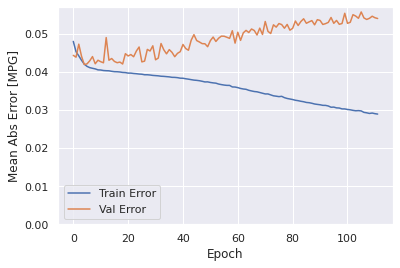

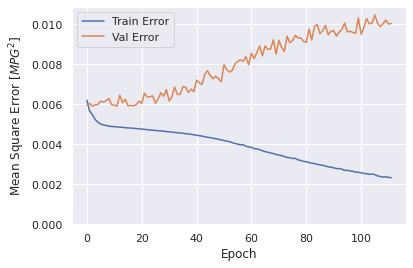

In [37]:
sns.set(rc = {'figure.figsize':(15,5), 'figure.dpi':80})
plot_history(history1)

### Evaluar predicciones

In [38]:
score_train1 = model1.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train1[0]}')
print(f'MAE:{score_train1[1]}')
print(f'MSE:{score_train1[2]}')
print(f'SMAPE:{score_train1[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0022 - mae: 0.0281 - mse: 0.0022 - smape: 0.6491
Loss:0.0022353201638907194
MAE:0.028097115457057953
MSE:0.0022353201638907194
SMAPE:0.6491235494613647


In [39]:
score_val1 = model1.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val1[0]}')
print(f'MAE:{score_val1[1]}')
print(f'MSE:{score_val1[2]}')
print(f'SMAPE:{score_val1[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0101 - mae: 0.0540 - mse: 0.0101 - smape: 0.8841
Loss:0.010050901211798191
MAE:0.05398153141140938
MSE:0.010050901211798191
SMAPE:0.8840972781181335


In [40]:
score_test1 = model1.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test1[0]}') 
print(f'MAE:{score_test1[1]}')
print(f'MSE:{score_test1[2]}')
print(f'SMAPE:{score_test1[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0086 - mae: 0.0537 - mse: 0.0086 - smape: 0.8678
Loss:0.008574038743972778
MAE:0.05369212478399277
MSE:0.008574038743972778
SMAPE:0.8678152561187744


### Comparativa de resultados

In [41]:
result = hist1.iloc[-1]
comparativa1 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test1[1], score_test1[2], score_test1[3], math.sqrt(score_test1[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa1.style.set_caption("Método de ventana de varios pasos - LSTM de una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.028912,0.002330,0.661786,0.048268
VALIDACION,0.053982,0.010051,0.884593,0.100254
TEST,0.053692,0.008574,0.867815,0.092596


### Obtener predicciones

In [42]:
trainPredict1 = model1.predict(scaled_trainX)
testPredict1 = model1.predict(scaled_testX)

### Visualización de las predicciones

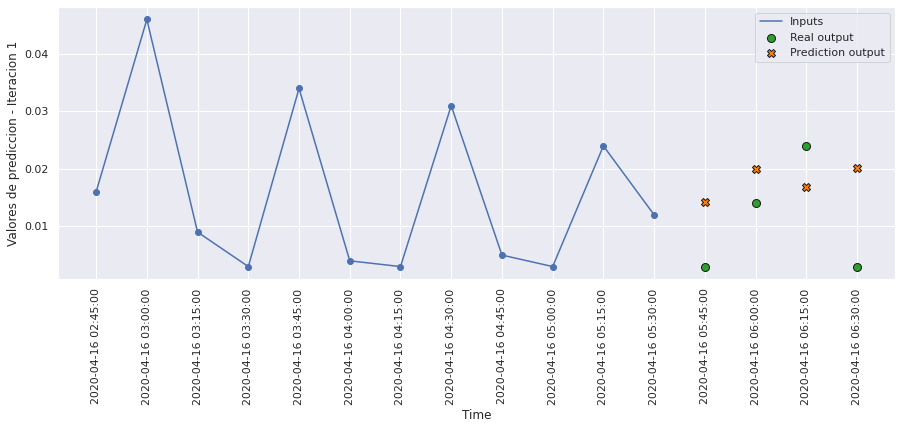

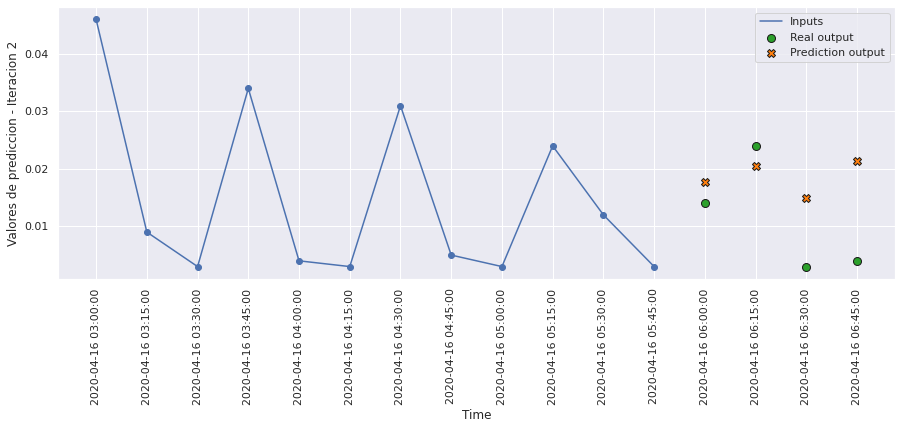

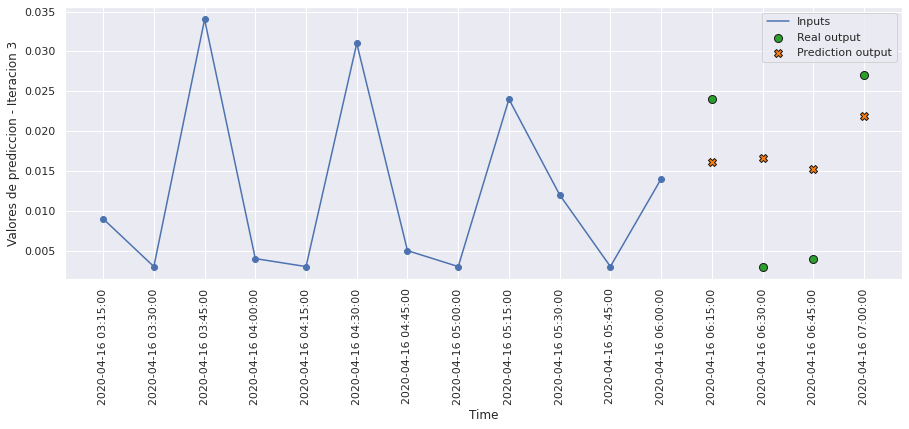

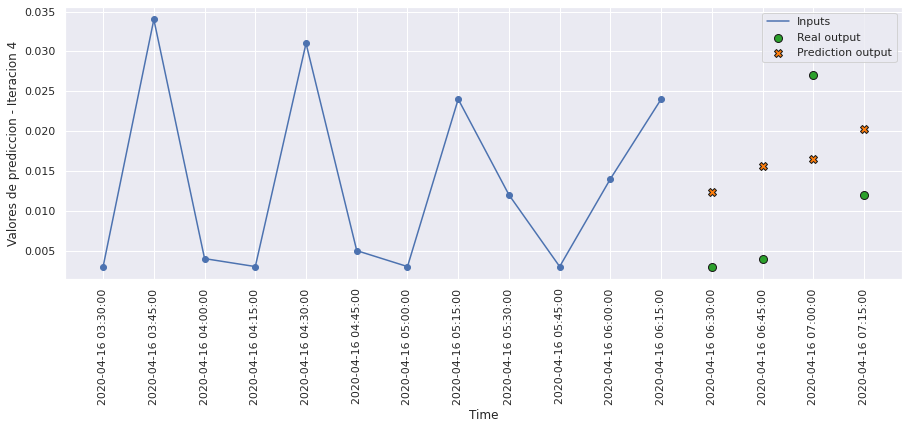

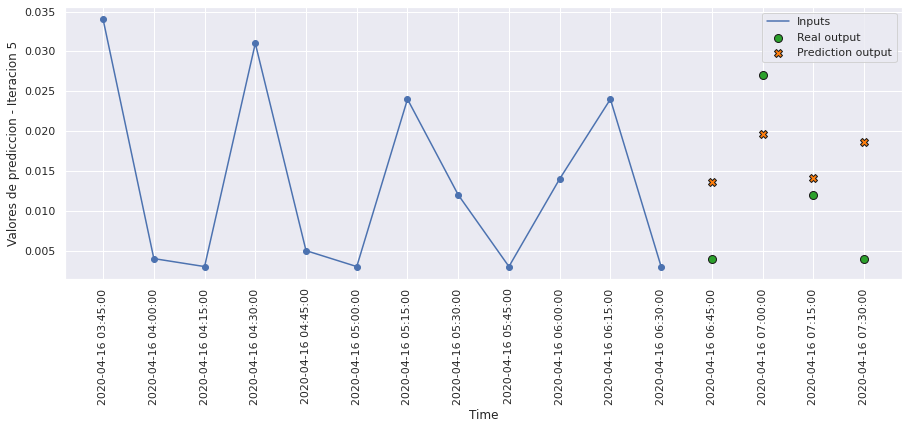

...

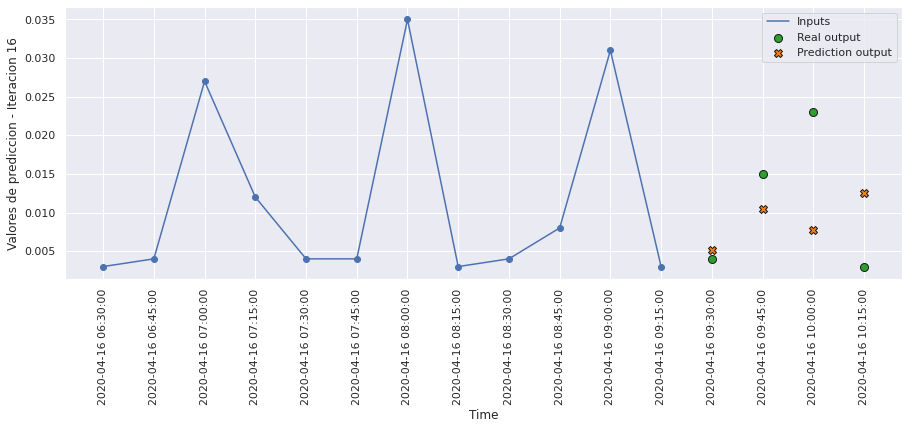

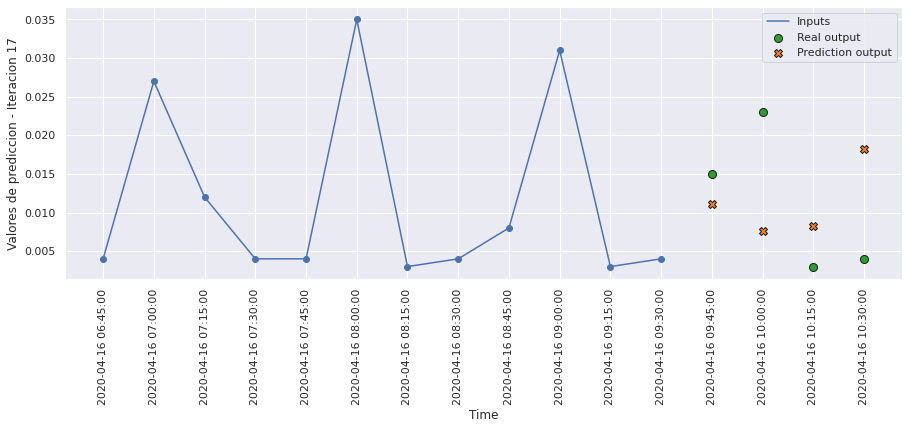

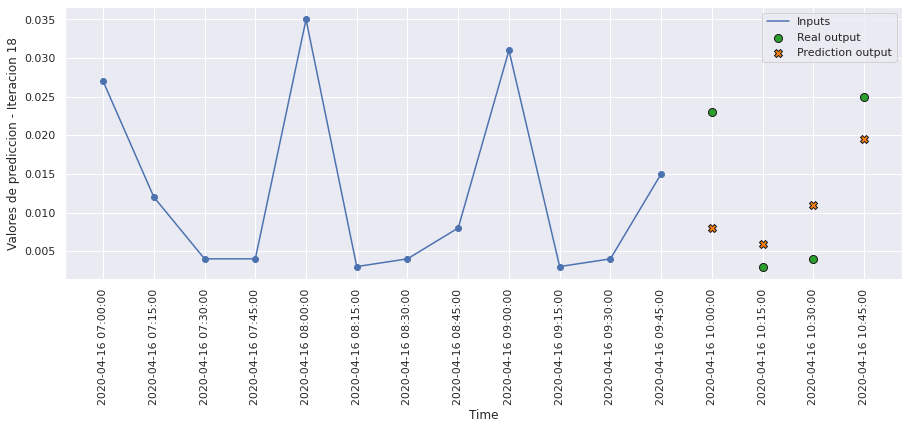

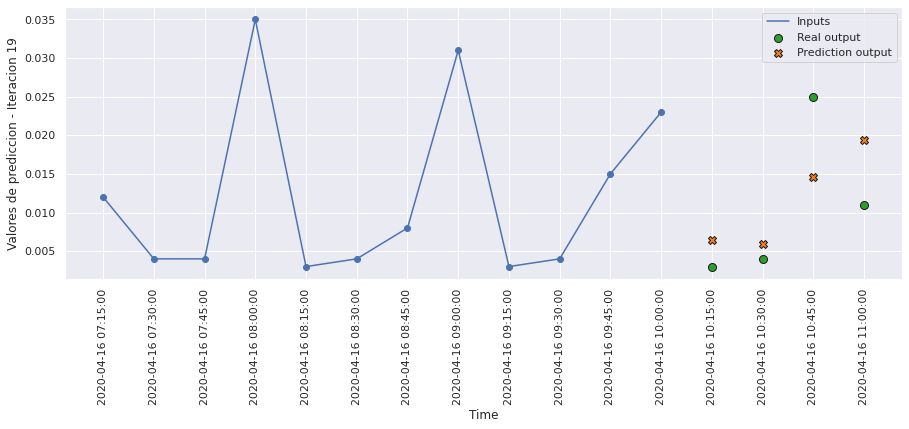

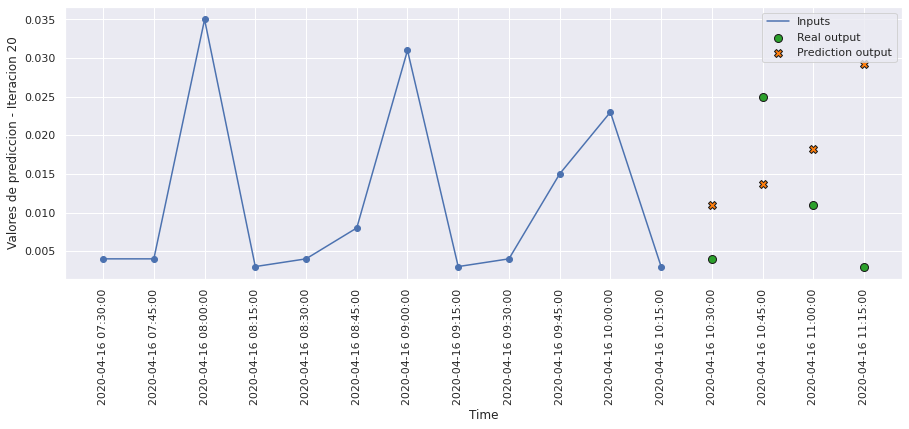

In [43]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict1, 20, 0)

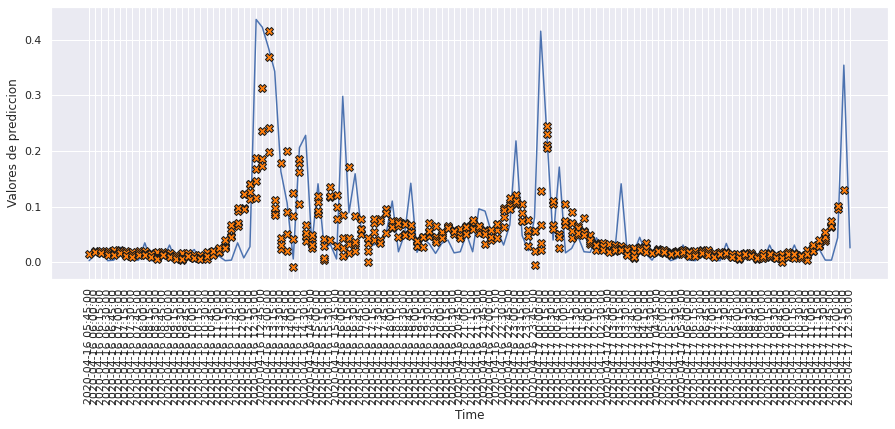

In [44]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 120)

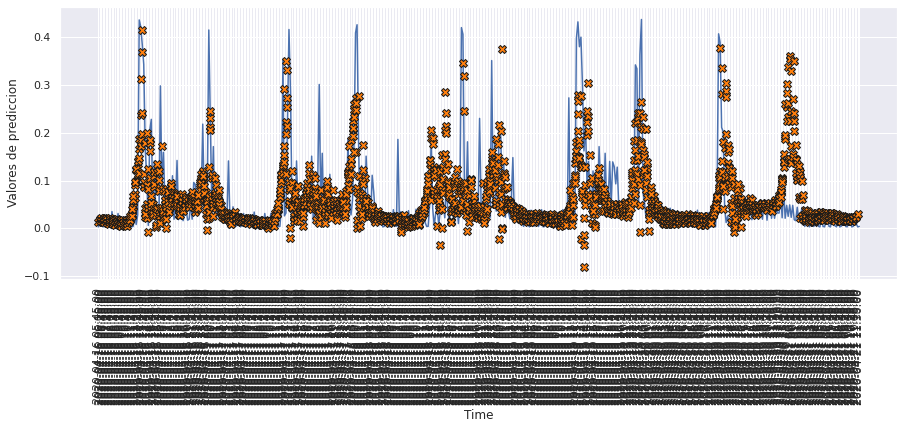

In [45]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict1, 500)

# MODELO 2: LSTM DE DOS CAPAS

### Construimos el modelo

In [46]:
def build_model2():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences = True),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [47]:
model2 = build_model2()
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_1 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_2 (LSTM)               (None, 128)               131584    
                                                                 
 dense_1 (Dense)             (None, 4)                 516       
                                                                 
Total params: 201,732
Trainable params: 201,732
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [48]:
history2 = model2.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.0061 - mae: 0.0473 - mse: 0.0061 - smape: 0.8554 - val_loss: 0.0062 - val_mae: 0.0448 - val_mse: 0.0062 - val_smape: 0.9137
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0055 - mae: 0.0442 - mse: 0.0055 - smape: 0.8050 - val_loss: 0.0059 - val_mae: 0.0409 - val_mse: 0.0059 - val_smape: 0.7613
Epoch 3/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0051 - mae: 0.0418 - mse: 0.0051 - smape: 0.7596 - val_loss: 0.0062 - val_mae: 0.0438 - val_mse: 0.0062 - val_smape: 0.7401
Epoch 4/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0050 - mae: 0.0412 - mse: 0.0050 - smape: 0.7485 - val_loss: 0.0058 - val_mae: 0.0426 - val_mse: 0.0058 - val_smape: 0.7584
Epoch 5/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0408 - mse: 0.0050 - smape: 0.7407 - val_loss: 0.0062 - val_mae: 0.0438 - val_mse: 0.0062 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0015 - mae: 0.0235 - mse: 0.0015 - smape: 0.6114 - val_loss: 0.0093 - val_mae: 0.0515 - val_mse: 0.0093 - val_smape: 0.8635
Epoch 82/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0015 - mae: 0.0234 - mse: 0.0015 - smape: 0.6107 - val_loss: 0.0092 - val_mae: 0.0514 - val_mse: 0.0092 - val_smape: 0.8808
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0014 - mae: 0.0233 - mse: 0.0014 - smape: 0.6104 - val_loss: 0.0093 - val_mae: 0.0518 - val_mse: 0.0093 - val_smape: 0.8799
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0014 - mae: 0.0231 - mse: 0.0014 - smape: 0.6088 - val_loss: 0.0095 - val_mae: 0.0527 - val_mse: 0.0095 - val_smape: 0.8847
Epoch 85/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0013 - mae: 0.0224 - mse: 0.0013 - smape: 0.6035 - val_loss: 0.0089 - val_mae: 0.0509 - val_mse: 0.0089 - val_smape: 0.865

In [49]:
hist2 = pd.DataFrame(history2.history)
hist2['epoch'] = history2.epoch
hist2

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006122,0.047300,0.006122,0.855420,0.006218,0.044792,0.006218,0.913677,0
1,0.005533,0.044231,0.005533,0.804984,0.005947,0.040917,0.005947,0.761317,1
2,0.005112,0.041771,0.005112,0.759567,0.006244,0.043827,0.006244,0.740101,2
3,0.005009,0.041162,0.005009,0.748525,0.005754,0.042603,0.005754,0.758372,3
4,0.004955,0.040767,0.004955,0.740731,0.006154,0.043842,0.006154,0.784913,4
...,...,...,...,...,...,...,...,...,...
99,0.000945,0.019608,0.000945,0.575949,0.009352,0.052274,0.009352,0.911080,99
100,0.000948,0.019647,0.000948,0.575235,0.009468,0.052539,0.009468,0.886742,100
101,0.000984,0.019997,0.000984,0.580219,0.009558,0.052971,0.009558,0.910881,101
102,0.000907,0.019295,0.000907,0.573063,0.009588,0.053191,0.009588,0.897684,102


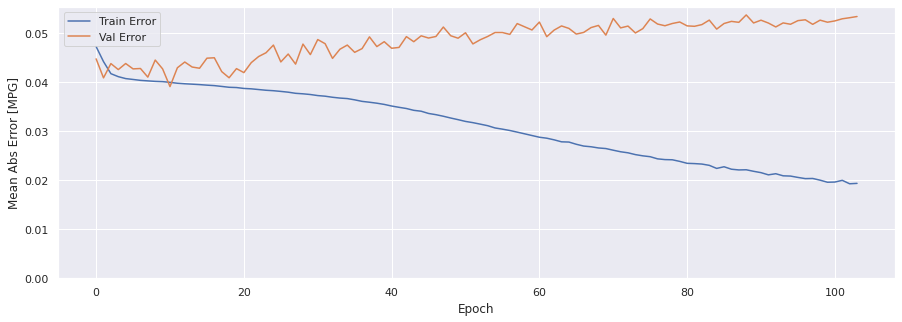

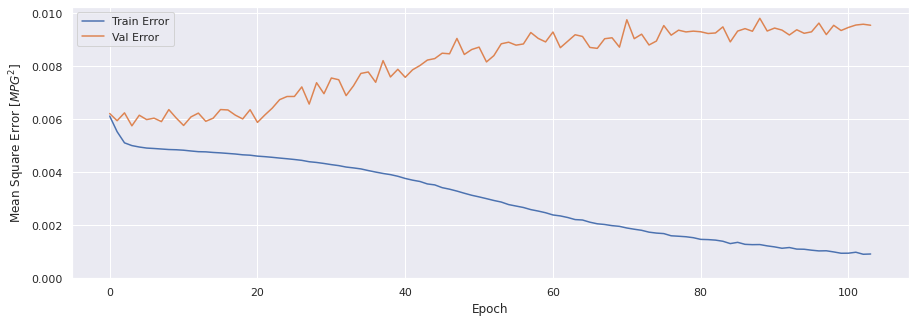

In [50]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history2)

### Evaluar predicciones

In [51]:
score_train2 = model2.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train2[0]}')
print(f'MAE:{score_train2[1]}')
print(f'MSE:{score_train2[2]}')
print(f'SMAPE:{score_train2[3]}')

1413/1413 [==============================] - 10s 7ms/step - loss: 8.6206e-04 - mae: 0.0189 - mse: 8.6206e-04 - smape: 0.5614
Loss:0.00086206168634817
MAE:0.01885252445936203
MSE:0.00086206168634817
SMAPE:0.5614229440689087


In [52]:
score_val2 = model2.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val2[0]}')
print(f'MAE:{score_val2[1]}')
print(f'MSE:{score_val2[2]}')
print(f'SMAPE:{score_val2[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0095 - mae: 0.0534 - mse: 0.0095 - smape: 0.8971
Loss:0.009549890644848347
MAE:0.053437650203704834
MSE:0.009549890644848347
SMAPE:0.8971132636070251


In [53]:
score_test2 = model2.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test2[0]}')
print(f'MAE:{score_test2[1]}')
print(f'MSE:{score_test2[2]}')
print(f'SMAPE:{score_test2[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0093 - mae: 0.0570 - mse: 0.0093 - smape: 0.9101
Loss:0.009309330955147743
MAE:0.05698506161570549
MSE:0.009309330955147743
SMAPE:0.9100843667984009


### Comparativa de resultados

In [54]:
result = hist2.iloc[-1]
comparativa2 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test2[1], score_test2[2], score_test2[3], math.sqrt(score_test2[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa2.style.set_caption("Método de ventana de varios pasos - LSTM de dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.019377,0.000917,0.571646,0.030284
VALIDACION,0.053438,0.009550,0.897390,0.097724
TEST,0.056985,0.009309,0.910084,0.096485


### Obtener predicciones

In [55]:
trainPredict2 = model2.predict(scaled_trainX)
testPredict2 = model2.predict(scaled_testX)

### Visualización de las predicciones

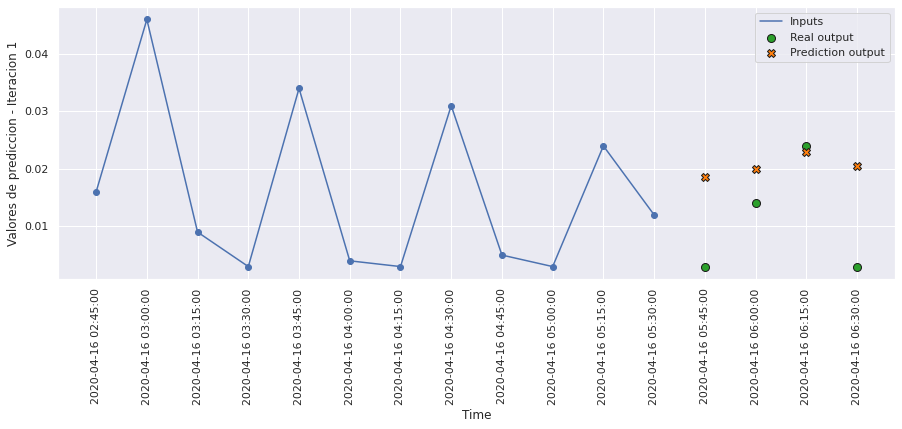

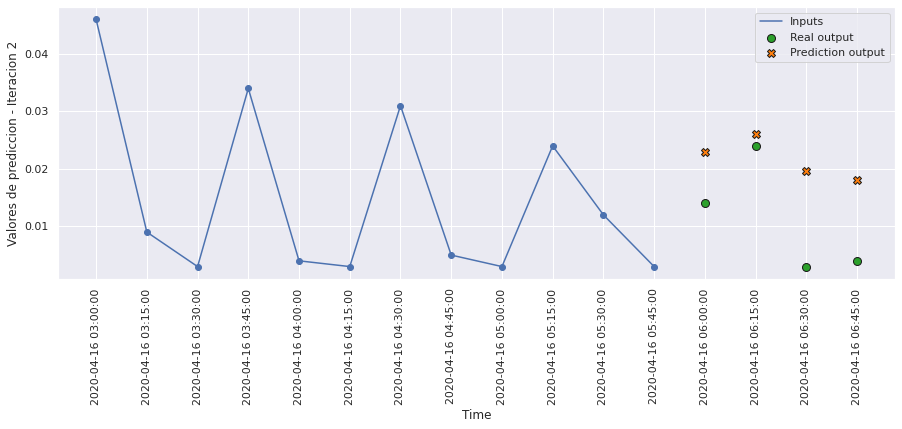

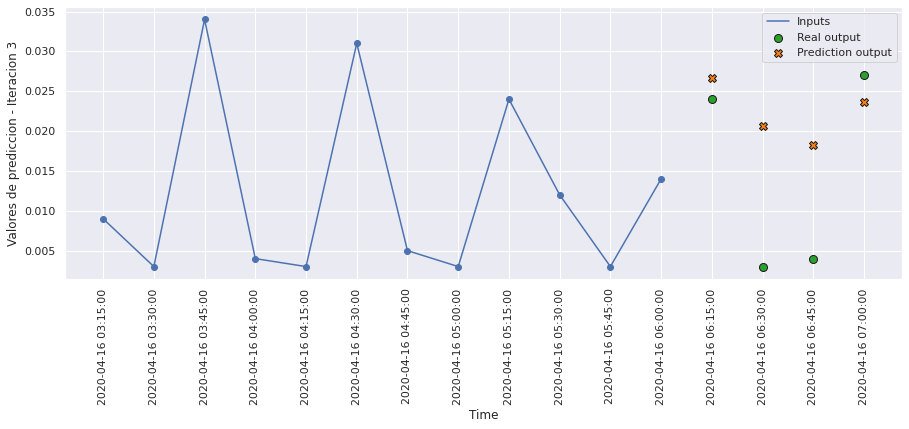

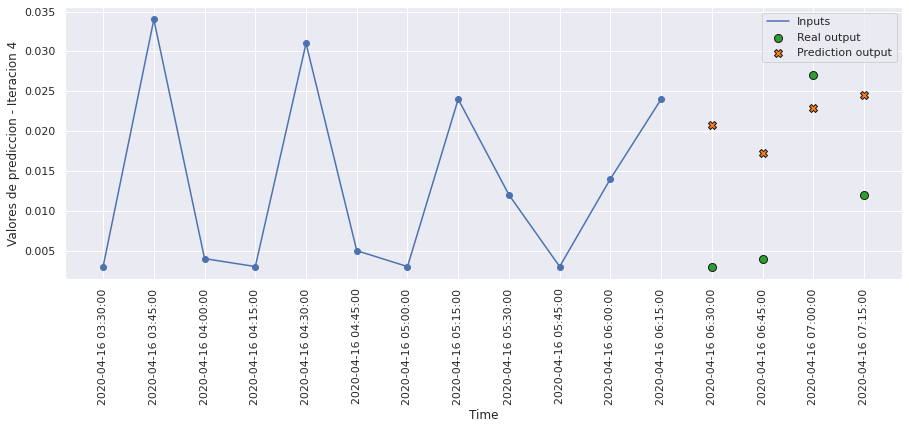

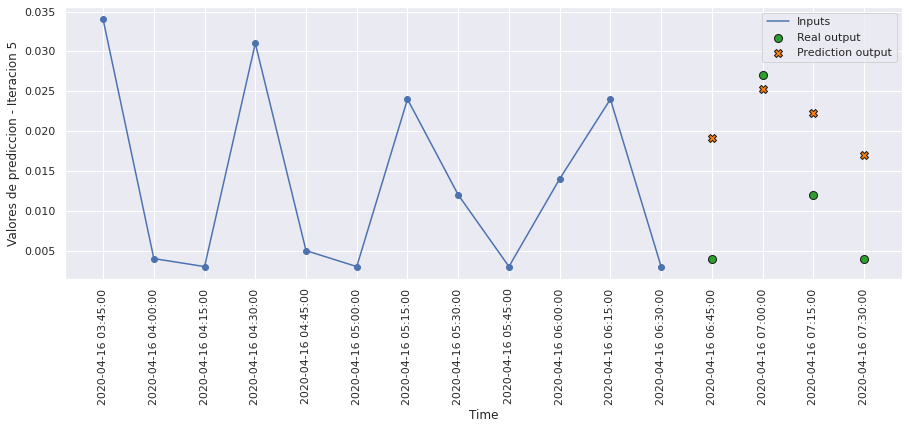

...

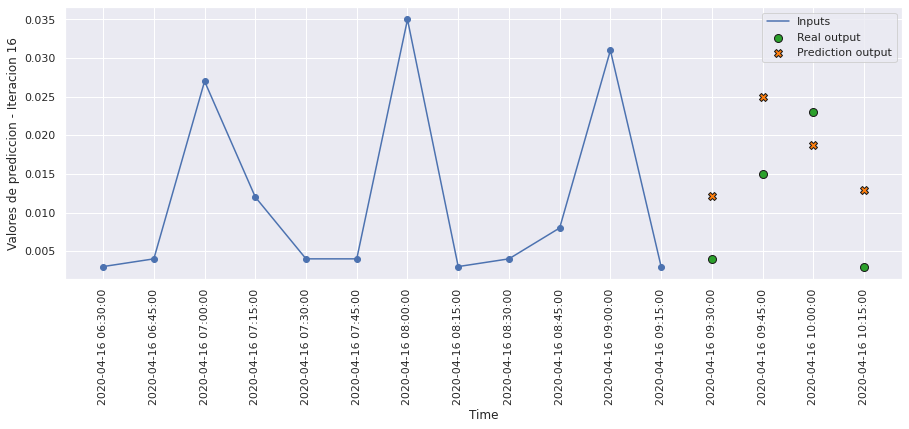

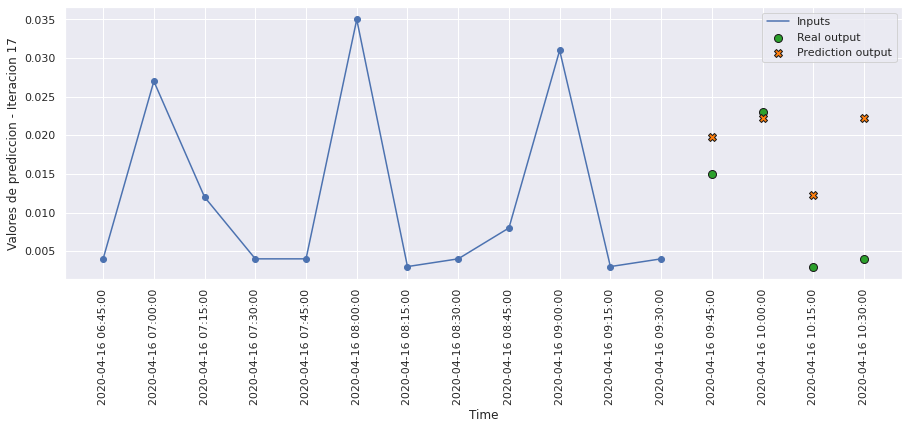

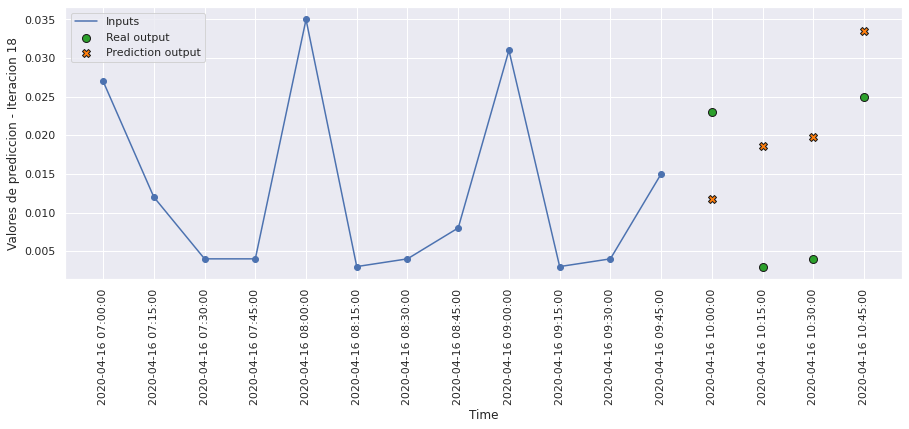

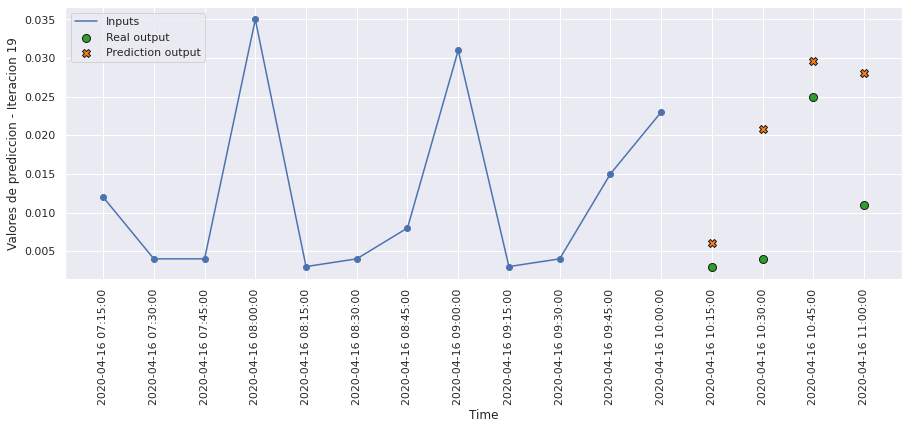

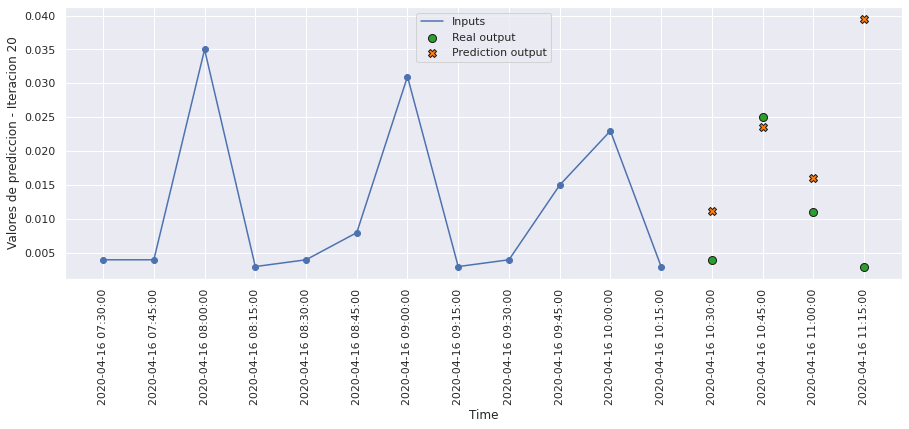

In [56]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict2, 20, 0)

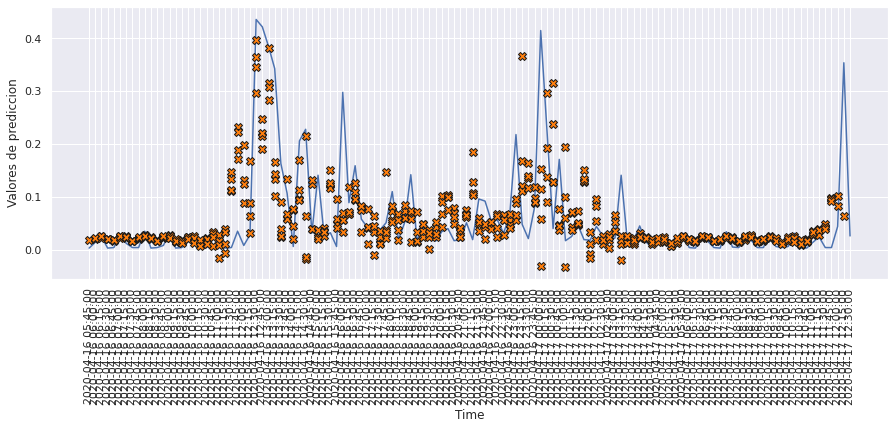

In [57]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 120)

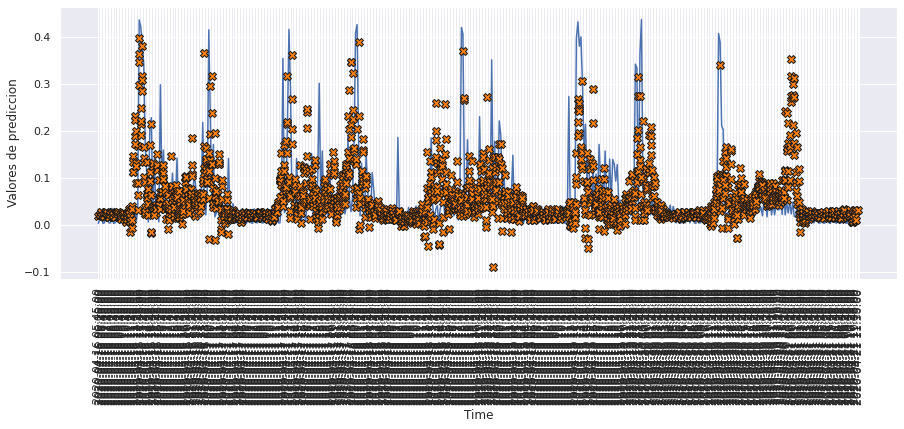

In [58]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict2, 500)

# MODELO 3: LSTM DE 3 CAPAS

### Construimos el modelo

In [59]:
def build_model3():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(64, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [60]:
model3 = build_model3()
model3.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_3 (LSTM)               (None, 12, 128)           69632     
                                                                 
 lstm_4 (LSTM)               (None, 12, 128)           131584    
                                                                 
 lstm_5 (LSTM)               (None, 64)                49408     
                                                                 
 dense_2 (Dense)             (None, 4)                 260       
                                                                 
Total params: 250,884
Trainable params: 250,884
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [61]:
history3 = model3.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 10s 21ms/step - loss: 0.0062 - mae: 0.0472 - mse: 0.0062 - smape: 0.8442 - val_loss: 0.0064 - val_mae: 0.0447 - val_mse: 0.0064 - val_smape: 0.8902
Epoch 2/200
354/354 [==============================] - 6s 18ms/step - loss: 0.0054 - mae: 0.0428 - mse: 0.0054 - smape: 0.7653 - val_loss: 0.0062 - val_mae: 0.0422 - val_mse: 0.0062 - val_smape: 0.7472
Epoch 3/200
354/354 [==============================] - 6s 18ms/step - loss: 0.0051 - mae: 0.0411 - mse: 0.0051 - smape: 0.7402 - val_loss: 0.0066 - val_mae: 0.0447 - val_mse: 0.0066 - val_smape: 0.7658
Epoch 4/200
354/354 [==============================] - 6s 18ms/step - loss: 0.0050 - mae: 0.0407 - mse: 0.0050 - smape: 0.7373 - val_loss: 0.0058 - val_mae: 0.0405 - val_mse: 0.0058 - val_smape: 0.7445
Epoch 5/200
354/354 [==============================] - 6s 18ms/step - loss: 0.0049 - mae: 0.0405 - mse: 0.0049 - smape: 0.7346 - val_loss: 0.0058 - val_mae: 0.0414 - val_mse: 0.0058 - val_sma

354/354 [==============================] - 6s 17ms/step - loss: 7.4525e-04 - mae: 0.0173 - mse: 7.4525e-04 - smape: 0.5272 - val_loss: 0.0089 - val_mae: 0.0497 - val_mse: 0.0089 - val_smape: 0.8029
Epoch 82/200
354/354 [==============================] - 6s 18ms/step - loss: 7.7842e-04 - mae: 0.0177 - mse: 7.7842e-04 - smape: 0.5301 - val_loss: 0.0088 - val_mae: 0.0493 - val_mse: 0.0088 - val_smape: 0.8126
Epoch 83/200
354/354 [==============================] - 6s 18ms/step - loss: 7.5323e-04 - mae: 0.0174 - mse: 7.5323e-04 - smape: 0.5267 - val_loss: 0.0089 - val_mae: 0.0501 - val_mse: 0.0089 - val_smape: 0.8394
Epoch 84/200
354/354 [==============================] - 6s 17ms/step - loss: 6.2594e-04 - mae: 0.0162 - mse: 6.2594e-04 - smape: 0.5138 - val_loss: 0.0088 - val_mae: 0.0500 - val_mse: 0.0088 - val_smape: 0.7996
Epoch 85/200
354/354 [==============================] - 6s 18ms/step - loss: 6.0513e-04 - mae: 0.0159 - mse: 6.0513e-04 - smape: 0.5108 - val_loss: 0.0089 - val_mae: 0.0

In [62]:
hist3 = pd.DataFrame(history3.history)
hist3['epoch'] = history3.epoch
hist3

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006181,0.047181,0.006181,0.844205,0.006437,0.044712,0.006437,0.890175,0
1,0.005370,0.042810,0.005370,0.765267,0.006180,0.042155,0.006180,0.747227,1
2,0.005051,0.041137,0.005051,0.740173,0.006580,0.044667,0.006580,0.765803,2
3,0.004963,0.040724,0.004963,0.737264,0.005828,0.040533,0.005828,0.744500,3
4,0.004921,0.040475,0.004921,0.734610,0.005783,0.041360,0.005783,0.735079,4
...,...,...,...,...,...,...,...,...,...
100,0.000419,0.013575,0.000419,0.472752,0.008899,0.050196,0.008899,0.859313,100
101,0.000399,0.013285,0.000399,0.468617,0.008913,0.049907,0.008913,0.830337,101
102,0.000401,0.013303,0.000401,0.467416,0.008849,0.050200,0.008849,0.811437,102
103,0.000503,0.014428,0.000503,0.481446,0.008943,0.049821,0.008943,0.825786,103


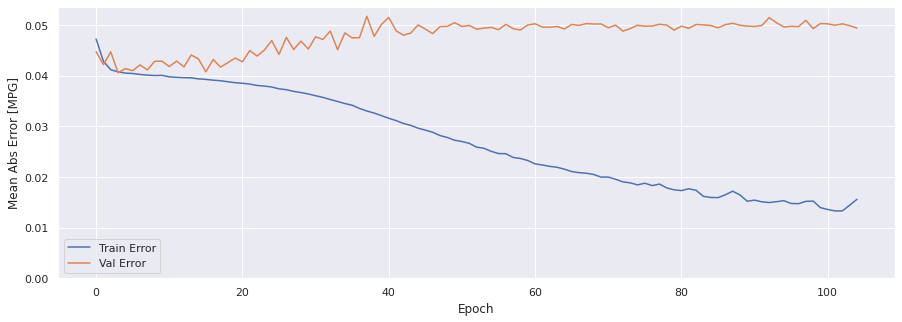

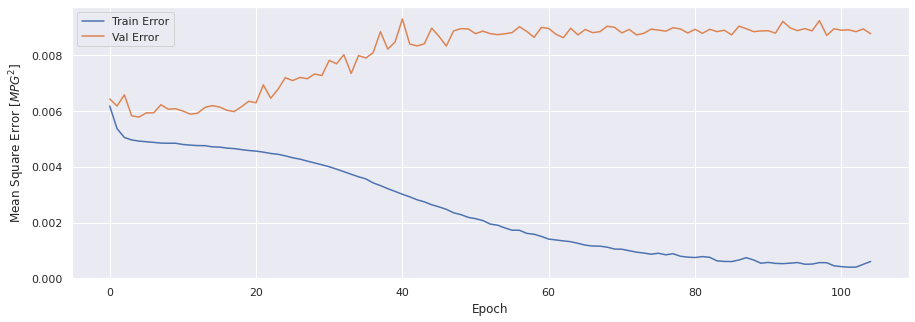

In [63]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history3)

### Evaluar predicciones

In [64]:
score_train3 = model3.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train3[0]}')
print(f'MAE:{score_train3[1]}')
print(f'MSE:{score_train3[2]}')
print(f'SMAPE:{score_train3[3]}')

1413/1413 [==============================] - 11s 8ms/step - loss: 4.2948e-04 - mae: 0.0136 - mse: 4.2948e-04 - smape: 0.4746
Loss:0.00042947608744725585
MAE:0.01355209480971098
MSE:0.00042947608744725585
SMAPE:0.47458505630493164


In [65]:
score_val3 = model3.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val3[0]}')
print(f'MAE:{score_val3[1]}')
print(f'MSE:{score_val3[2]}')
print(f'SMAPE:{score_val3[3]}')

303/303 [==============================] - 2s 8ms/step - loss: 0.0088 - mae: 0.0493 - mse: 0.0088 - smape: 0.8564
Loss:0.008772511966526508
MAE:0.04934195056557655
MSE:0.008772511966526508
SMAPE:0.8564271926879883


In [66]:
score_test3 = model3.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test3[0]}')
print(f'MAE:{score_test3[1]}')
print(f'MSE:{score_test3[2]}')
print(f'SMAPE:{score_test3[3]}')

303/303 [==============================] - 2s 8ms/step - loss: 0.0081 - mae: 0.0516 - mse: 0.0081 - smape: 0.8545
Loss:0.00811066199094057
MAE:0.05158334970474243
MSE:0.00811066199094057
SMAPE:0.8544788956642151


### Comparativa de resultados

In [67]:
result = hist3.iloc[-1]
comparativa3 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test3[1], score_test3[2], score_test3[3], math.sqrt(score_test3[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa3.style.set_caption("Método de ventana de varios pasos - LSTM de tres capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.015588,0.000603,0.494230,0.024547
VALIDACION,0.049342,0.008773,0.857016,0.093662
TEST,0.051583,0.008111,0.854479,0.090059


### Obtener predicciones

In [68]:
trainPredict3 = model3.predict(scaled_trainX)
testPredict3 = model3.predict(scaled_testX)

### Visualización de las predicciones

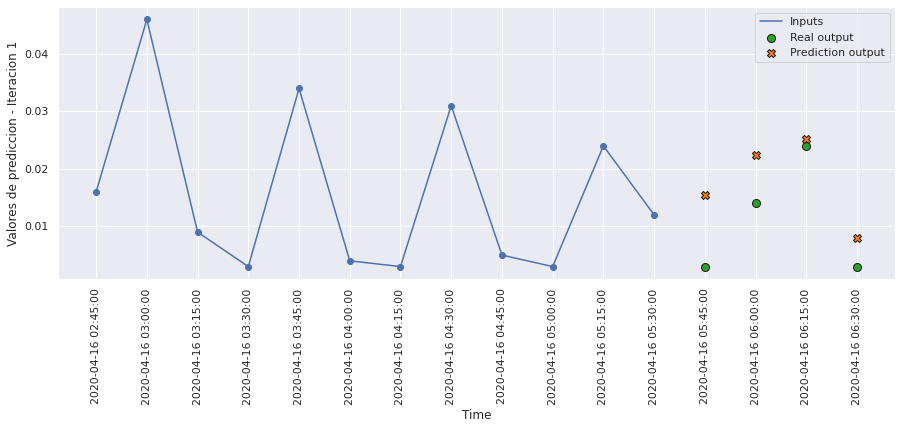

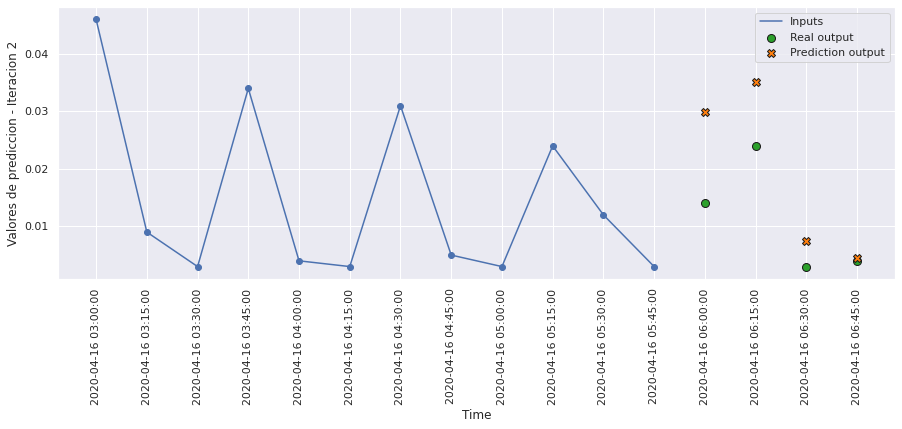

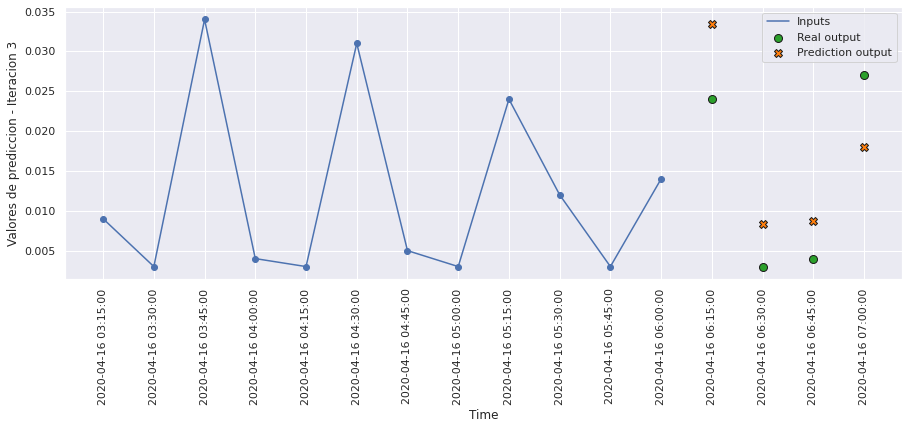

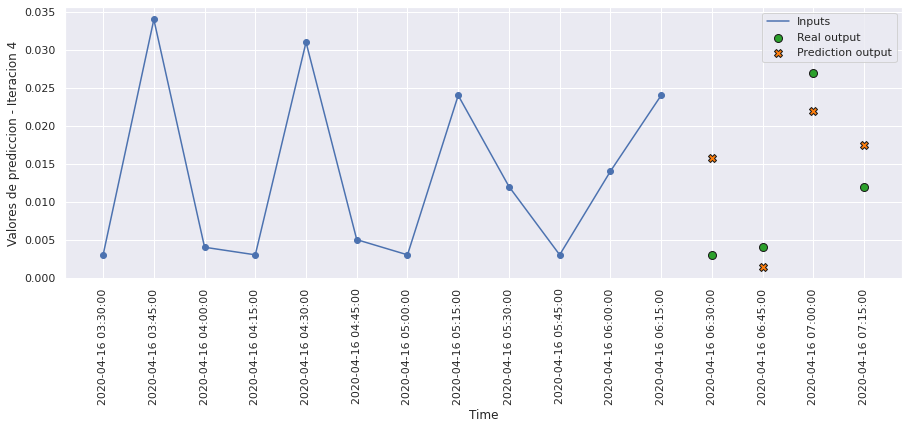

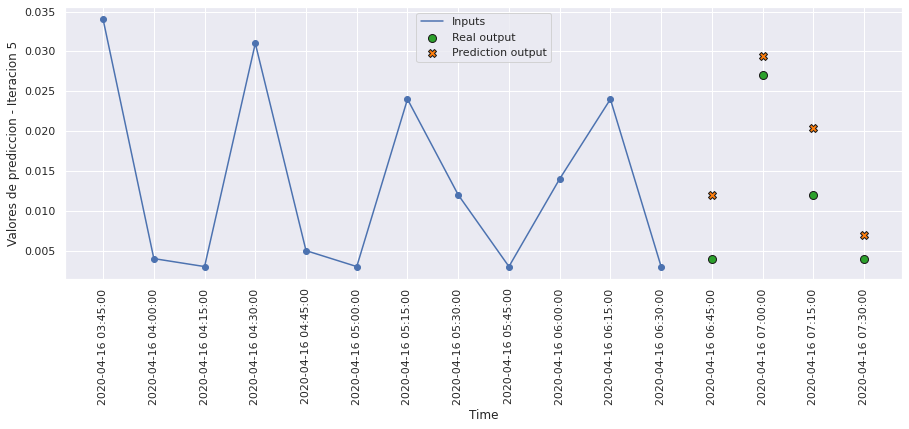

...

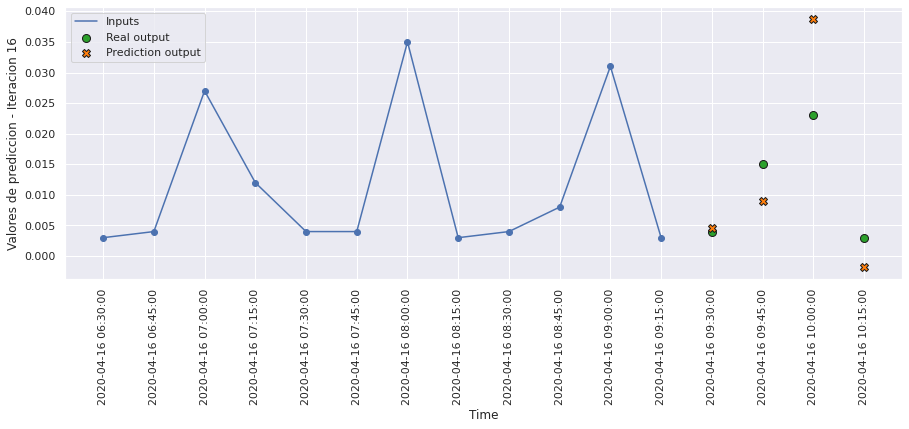

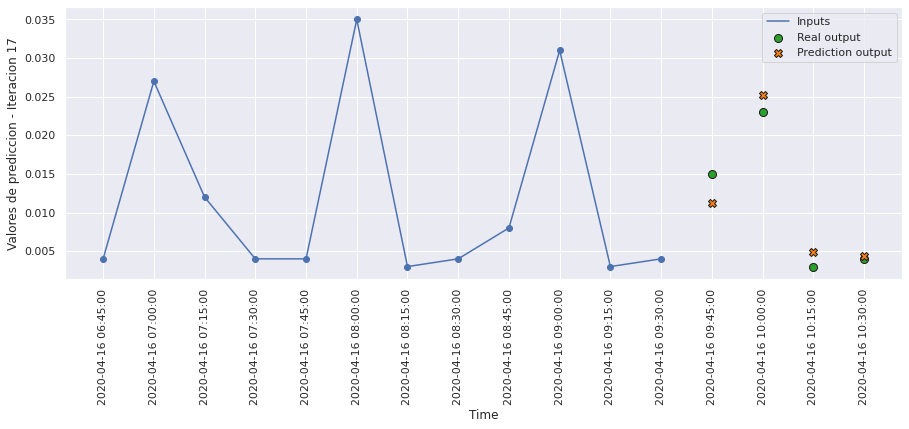

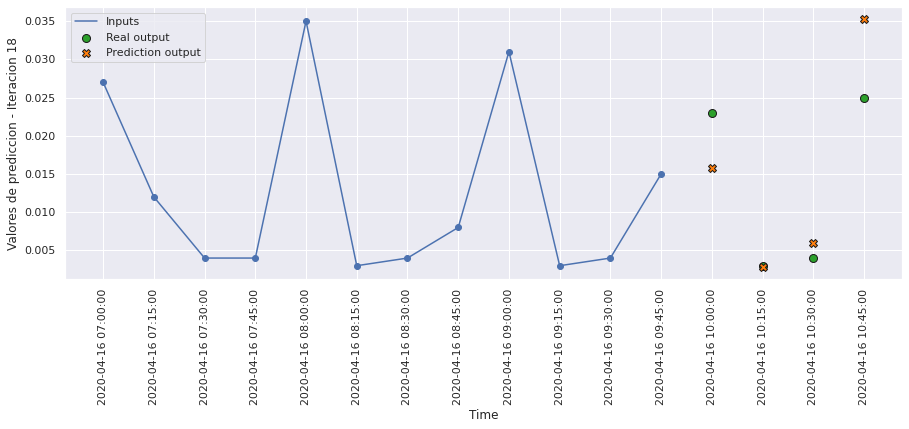

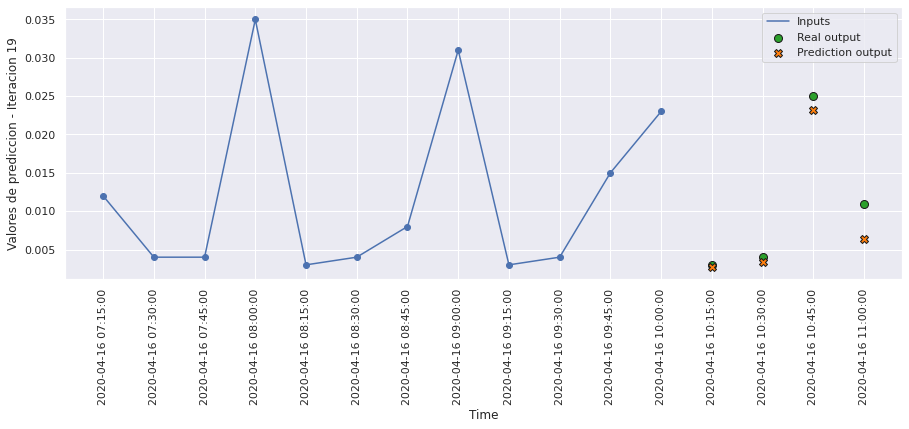

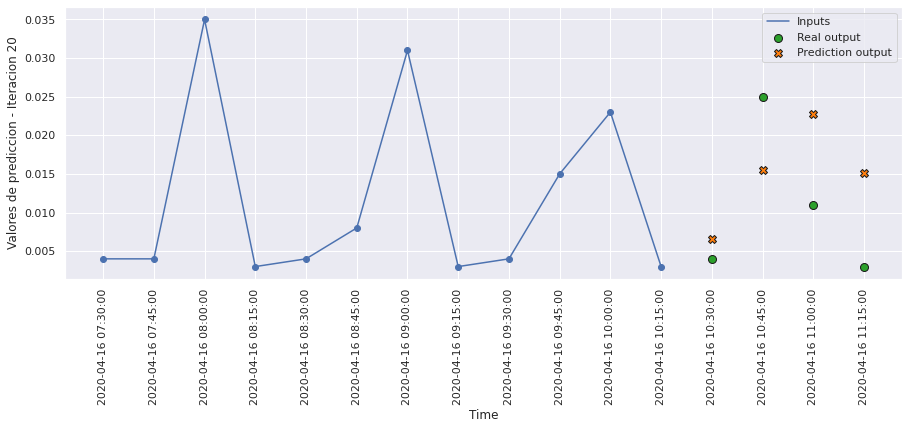

In [69]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict3, 20, 0)

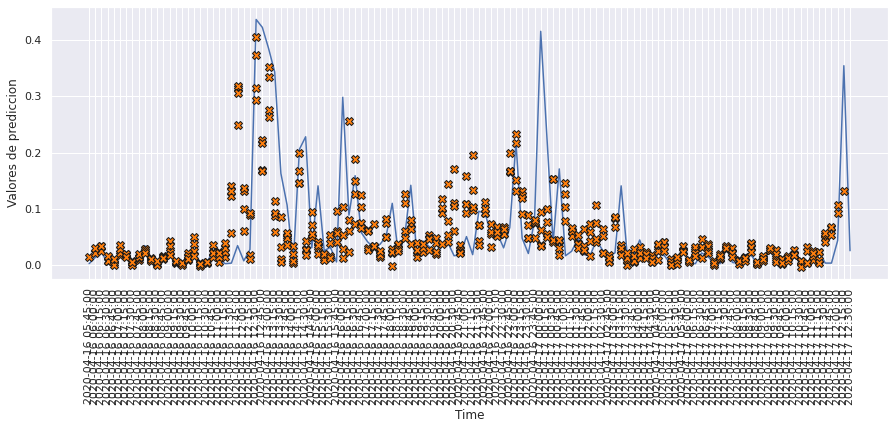

In [70]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 120)

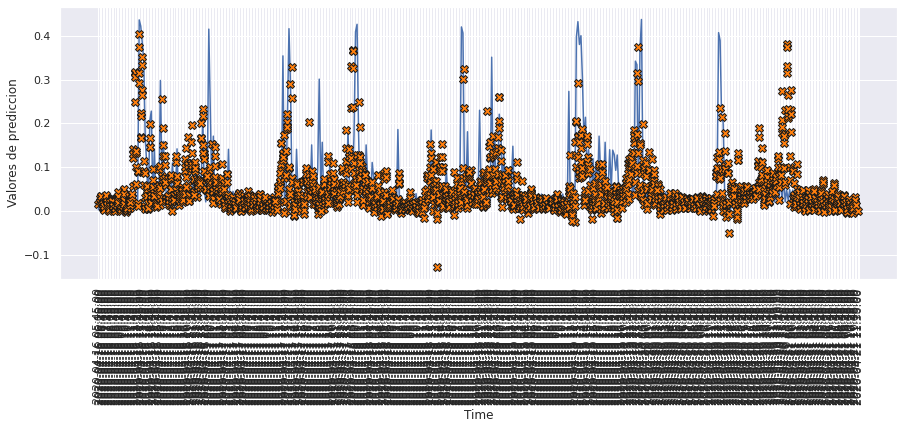

In [71]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict3, 500)

# MODELO 4: LSTM BIDIRECCIONAL

### Construimos el modelo

In [72]:
def build_model4():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, activation='tanh')),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [73]:
model4 = build_model4()
model4.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 256)              139264    
 l)                                                              
                                                                 
 dense_3 (Dense)             (None, 4)                 1028      
                                                                 
Total params: 140,292
Trainable params: 140,292
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [74]:
history4 = model4.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0063 - mae: 0.0489 - mse: 0.0063 - smape: 0.8951 - val_loss: 0.0063 - val_mae: 0.0462 - val_mse: 0.0063 - val_smape: 0.9296
Epoch 2/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0057 - mae: 0.0460 - mse: 0.0057 - smape: 0.8523 - val_loss: 0.0060 - val_mae: 0.0445 - val_mse: 0.0060 - val_smape: 0.8540
Epoch 3/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0055 - mae: 0.0447 - mse: 0.0055 - smape: 0.8291 - val_loss: 0.0062 - val_mae: 0.0459 - val_mse: 0.0062 - val_smape: 1.0127
Epoch 4/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0053 - mae: 0.0436 - mse: 0.0053 - smape: 0.8048 - val_loss: 0.0061 - val_mae: 0.0459 - val_mse: 0.0061 - val_smape: 0.9135
Epoch 5/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0052 - mae: 0.0427 - mse: 0.0052 - smape: 0.7923 - val_loss: 0.0060 - val_mae: 0.0472 - val_mse: 0.0060 - val_smap

354/354 [==============================] - 4s 12ms/step - loss: 0.0034 - mae: 0.0342 - mse: 0.0034 - smape: 0.6920 - val_loss: 0.0083 - val_mae: 0.0502 - val_mse: 0.0083 - val_smape: 0.8554
Epoch 82/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0033 - mae: 0.0340 - mse: 0.0033 - smape: 0.6920 - val_loss: 0.0085 - val_mae: 0.0509 - val_mse: 0.0085 - val_smape: 0.8584
Epoch 83/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0033 - mae: 0.0339 - mse: 0.0033 - smape: 0.6927 - val_loss: 0.0081 - val_mae: 0.0495 - val_mse: 0.0081 - val_smape: 0.8479
Epoch 84/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0033 - mae: 0.0337 - mse: 0.0033 - smape: 0.6915 - val_loss: 0.0084 - val_mae: 0.0500 - val_mse: 0.0084 - val_smape: 0.8520
Epoch 85/200
354/354 [==============================] - 4s 12ms/step - loss: 0.0032 - mae: 0.0335 - mse: 0.0032 - smape: 0.6897 - val_loss: 0.0084 - val_mae: 0.0516 - val_mse: 0.0084 - val_smape: 0.890

In [75]:
hist4 = pd.DataFrame(history4.history)
hist4['epoch'] = history4.epoch
hist4

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006262,0.048874,0.006262,0.895120,0.006340,0.046221,0.006340,0.929594,0
1,0.005723,0.045954,0.005723,0.852300,0.005972,0.044461,0.005972,0.854009,1
2,0.005508,0.044714,0.005508,0.829141,0.006157,0.045916,0.006157,1.012717,2
3,0.005298,0.043552,0.005298,0.804807,0.006058,0.045875,0.006058,0.913478,3
4,0.005168,0.042722,0.005168,0.792301,0.005988,0.047162,0.005988,0.906552,4
...,...,...,...,...,...,...,...,...,...
111,0.002197,0.028703,0.002197,0.668927,0.009484,0.052591,0.009484,0.898507,111
112,0.002132,0.028404,0.002132,0.667592,0.009159,0.052447,0.009159,0.868070,112
113,0.002097,0.028190,0.002097,0.665119,0.009029,0.051560,0.009029,0.945908,113
114,0.002063,0.028031,0.002063,0.664539,0.009107,0.051870,0.009107,0.889811,114


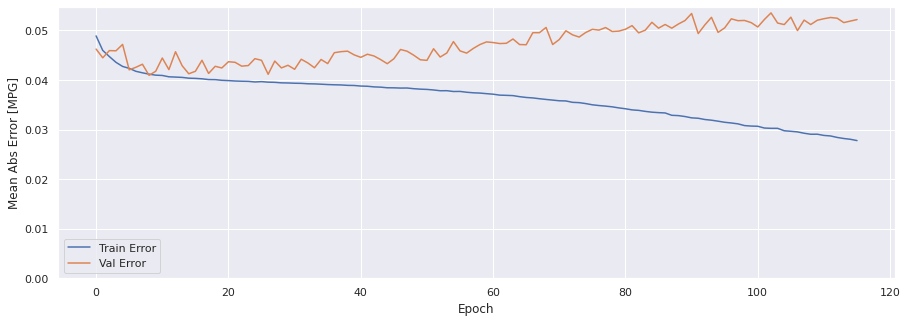

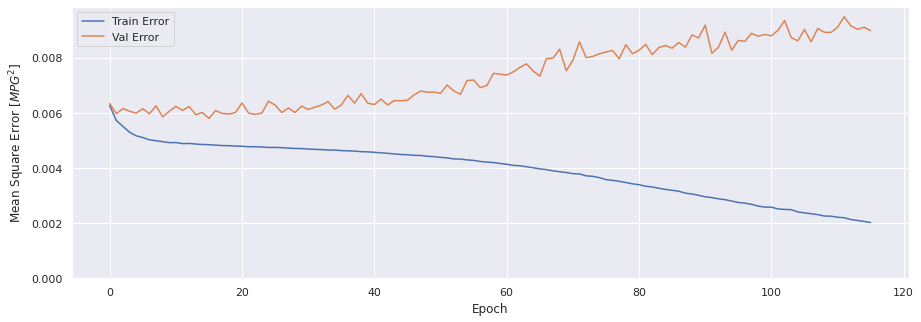

In [76]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history4)

### Evaluar predicciones

In [77]:
score_train4 = model4.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train4[0]}')
print(f'MAE:{score_train4[1]}')
print(f'MSE:{score_train4[2]}')
print(f'SMAPE:{score_train4[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0019 - mae: 0.0279 - mse: 0.0019 - smape: 0.6652
Loss:0.0019458549795672297
MAE:0.02792522870004177
MSE:0.0019458549795672297
SMAPE:0.6652048230171204


In [78]:
score_val4 = model4.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val4[0]}')
print(f'MAE:{score_val4[1]}')
print(f'MSE:{score_val4[2]}')
print(f'SMAPE:{score_val4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0090 - mae: 0.0522 - mse: 0.0090 - smape: 0.8719
Loss:0.008979376405477524
MAE:0.05217098444700241
MSE:0.008979376405477524
SMAPE:0.8719403743743896


In [79]:
score_test4 = model4.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test4[0]}')
print(f'MAE:{score_test4[1]}')
print(f'MSE:{score_test4[2]}')
print(f'SMAPE:{score_test4[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0082 - mae: 0.0534 - mse: 0.0082 - smape: 0.8605
Loss:0.008218744769692421
MAE:0.053370777517557144
MSE:0.008218744769692421
SMAPE:0.8604898452758789


### Comparativa de resultados

In [80]:
result = hist4.iloc[-1]
comparativa4 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test4[1], score_test4[2], score_test4[3], math.sqrt(score_test4[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa4.style.set_caption("Método de ventana de varios pasos - Bidireccional LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.027769,0.002021,0.661699,0.044959
VALIDACION,0.052171,0.008979,0.872326,0.094760
TEST,0.053371,0.008219,0.860490,0.090657


### Obtener predicciones

In [81]:
trainPredict4 = model4.predict(scaled_trainX)
testPredict4 = model4.predict(scaled_testX)

### Visualización de las predicciones

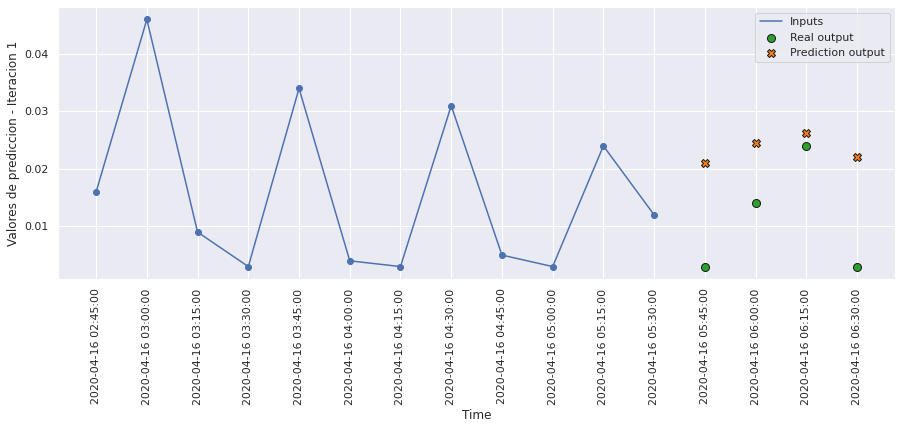

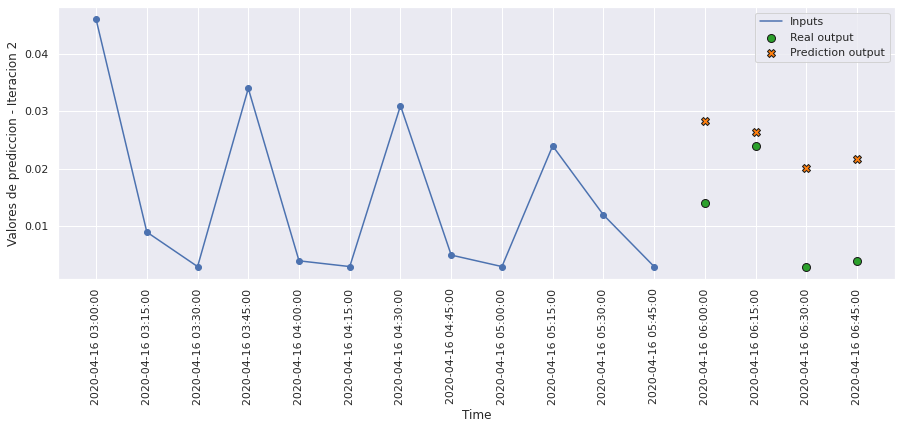

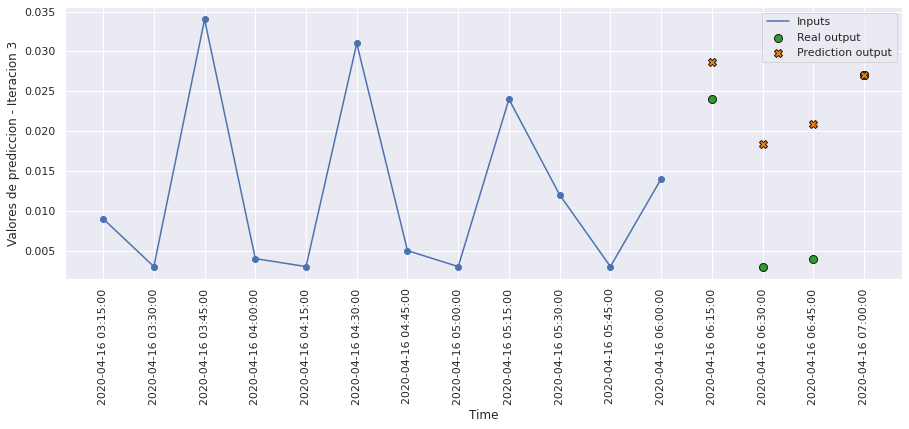

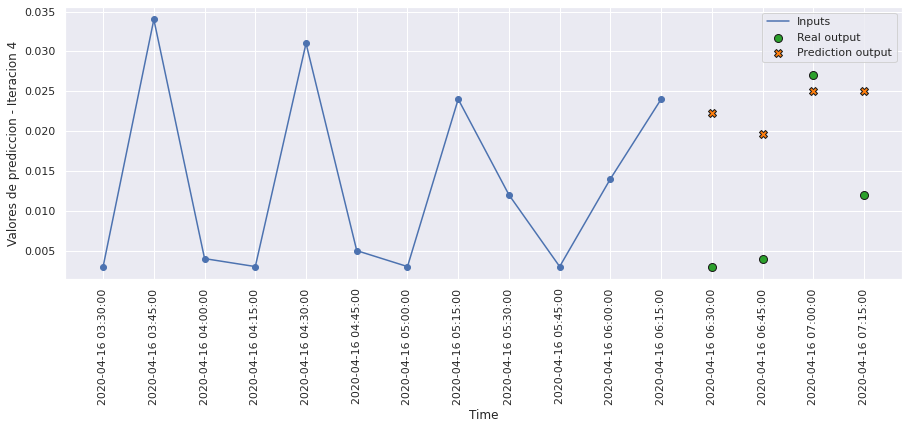

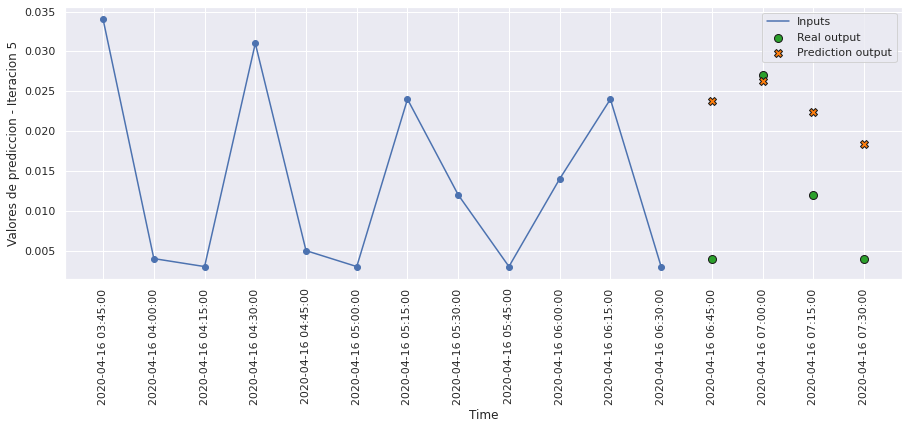

...

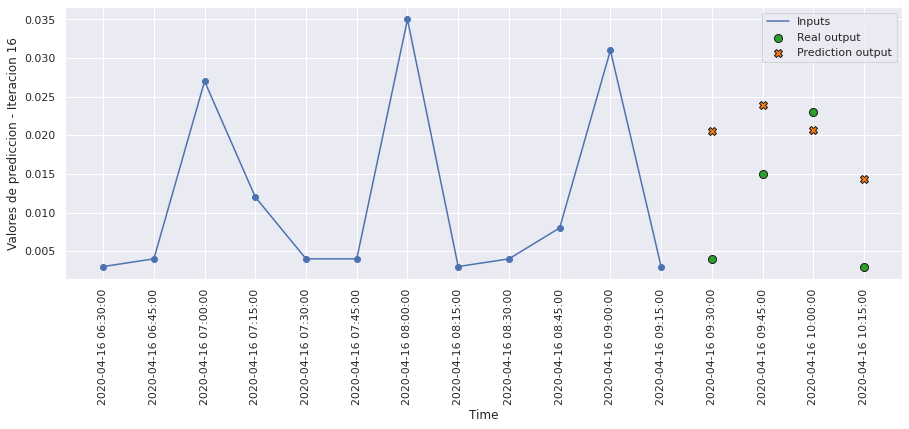

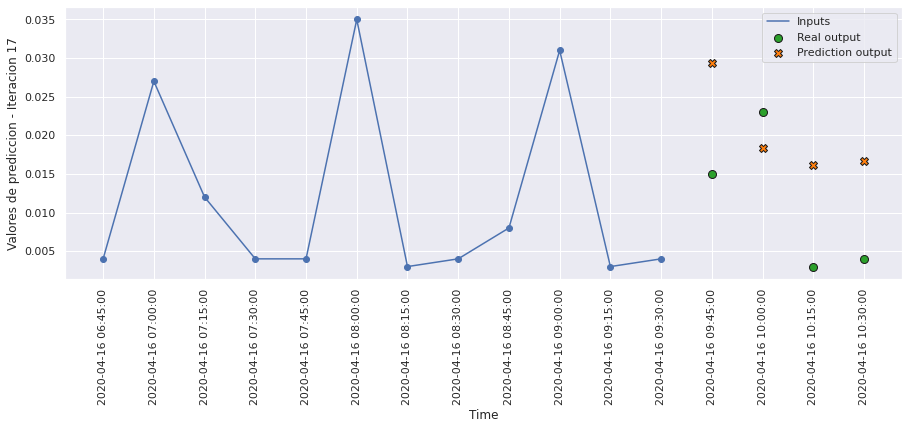

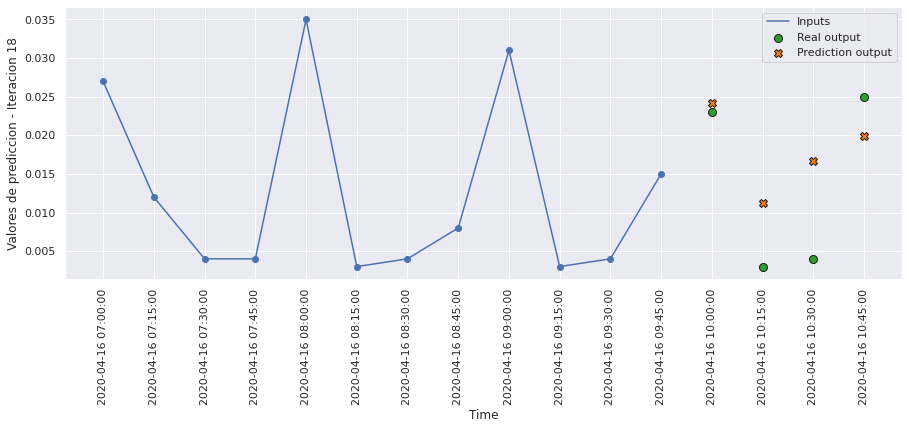

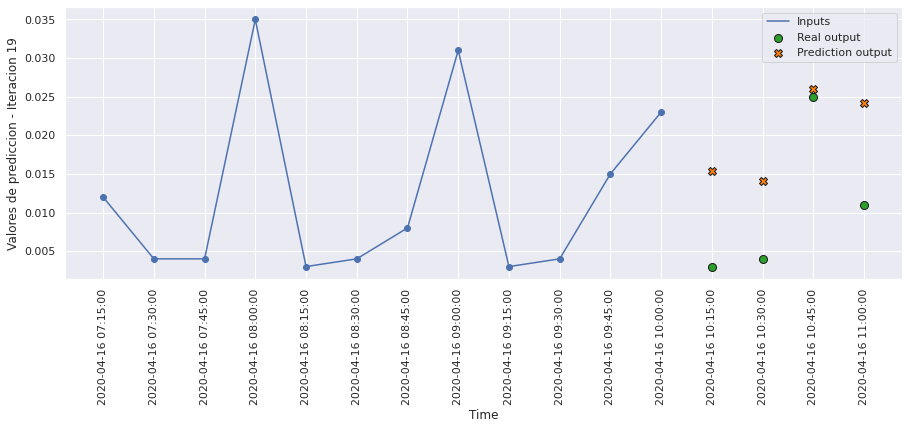

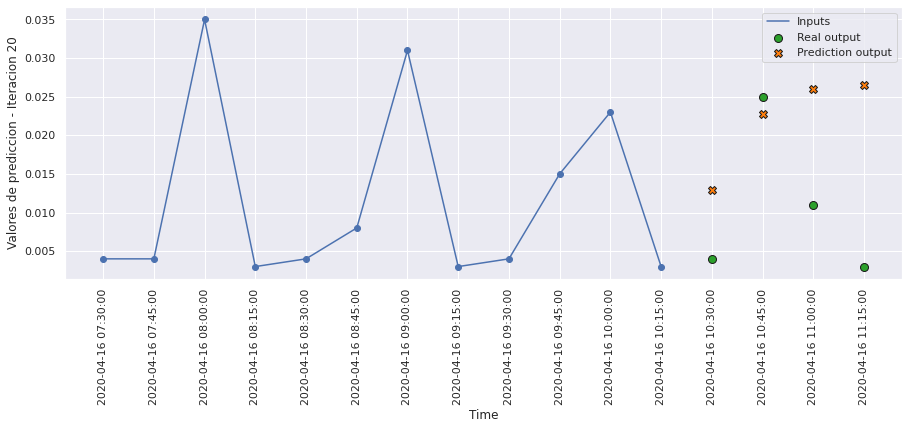

In [82]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict4, 20, 0)

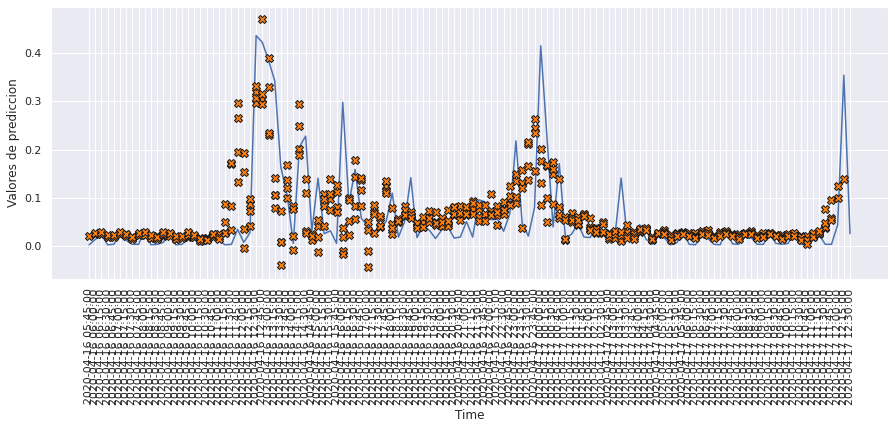

In [83]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 120)

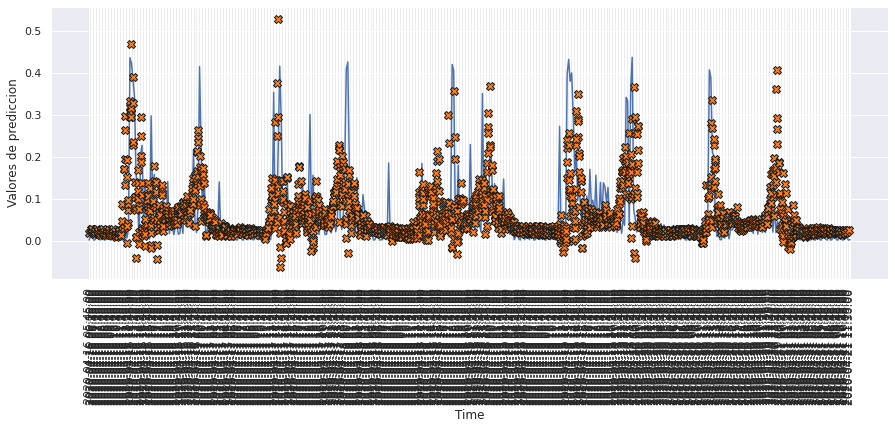

In [84]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict4, 500)

# MODELO 5: CONVOLUCIONAL 1D

### Construimos el modelo

In [85]:
def build_model5():
    model = tf.keras.Sequential([
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu'), 
                                        input_shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [86]:
model5 = build_model5()
model5.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, None, 12, 64)     512       
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, None, 6, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, None, 384)        0         
 tributed)                                                       
                                                                 
 dense_4 (Dense)             (None, None, 4)           1540      
                                                                 
Total params: 2,052
Trainable params: 2,052
Non-trainable params: 0
____________________________________________________

### Entrenamiento del modelo

In [87]:
history5 = model5.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 4s 8ms/step - loss: 0.0078 - mae: 0.0559 - mse: 0.0078 - smape: 0.9726 - val_loss: 0.0064 - val_mae: 0.0489 - val_mse: 0.0064 - val_smape: 0.9314
Epoch 2/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0060 - mae: 0.0483 - mse: 0.0060 - smape: 0.8972 - val_loss: 0.0062 - val_mae: 0.0506 - val_mse: 0.0062 - val_smape: 0.8824
Epoch 3/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0058 - mae: 0.0471 - mse: 0.0058 - smape: 0.8797 - val_loss: 0.0064 - val_mae: 0.0516 - val_mse: 0.0064 - val_smape: 0.9015
Epoch 4/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0057 - mae: 0.0464 - mse: 0.0057 - smape: 0.8668 - val_loss: 0.0061 - val_mae: 0.0430 - val_mse: 0.0061 - val_smape: 0.8183
Epoch 5/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0056 - mae: 0.0457 - mse: 0.0056 - smape: 0.8513 - val_loss: 0.0061 - val_mae: 0.0465 - val_mse: 0.0061 - val_smape: 0.

Epoch 82/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0049 - mae: 0.0409 - mse: 0.0049 - smape: 0.7534 - val_loss: 0.0063 - val_mae: 0.0453 - val_mse: 0.0063 - val_smape: 0.7968
Epoch 83/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0049 - mae: 0.0408 - mse: 0.0049 - smape: 0.7519 - val_loss: 0.0064 - val_mae: 0.0441 - val_mse: 0.0064 - val_smape: 0.8081
Epoch 84/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0049 - mae: 0.0409 - mse: 0.0049 - smape: 0.7548 - val_loss: 0.0064 - val_mae: 0.0444 - val_mse: 0.0064 - val_smape: 0.8235
Epoch 85/200
354/354 [==============================] - 3s 7ms/step - loss: 0.0049 - mae: 0.0407 - mse: 0.0049 - smape: 0.7485 - val_loss: 0.0064 - val_mae: 0.0458 - val_mse: 0.0064 - val_smape: 0.8769
Epoch 86/200
354/354 [==============================] - 2s 7ms/step - loss: 0.0049 - mae: 0.0408 - mse: 0.0049 - smape: 0.7510 - val_loss: 0.0064 - val_mae: 0.0466 - val_mse: 0.0064 - val_smap

In [88]:
hist5 = pd.DataFrame(history5.history)
hist5['epoch'] = history5.epoch
hist5

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.007786,0.055858,0.007786,0.972589,0.006414,0.048896,0.006414,0.931393,0
1,0.006029,0.048261,0.006029,0.897222,0.006249,0.050596,0.006249,0.882384,1
2,0.005841,0.047084,0.005841,0.879732,0.006403,0.051642,0.006403,0.901462,2
3,0.005715,0.046424,0.005715,0.866755,0.006091,0.042973,0.006091,0.818256,3
4,0.005599,0.045654,0.005599,0.851269,0.006109,0.046518,0.006109,0.901265,4
...,...,...,...,...,...,...,...,...,...
99,0.004846,0.040794,0.004846,0.752439,0.006454,0.046095,0.006454,0.863665,99
100,0.004844,0.040785,0.004844,0.751411,0.006405,0.043821,0.006405,0.792453,100
101,0.004839,0.040699,0.004839,0.749387,0.006435,0.047354,0.006435,0.796476,101
102,0.004855,0.040857,0.004855,0.752997,0.006446,0.046246,0.006446,0.823893,102


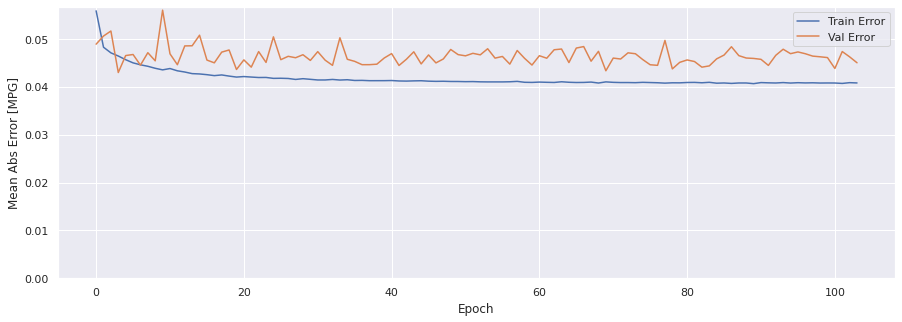

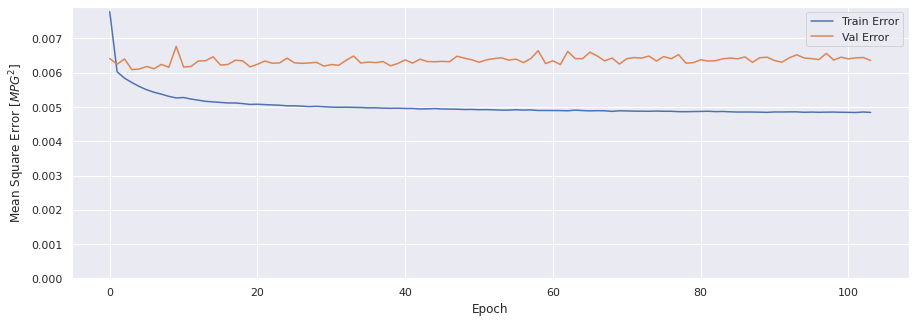

In [89]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history5)

### Evaluar predicciones

In [90]:
score_train5 = model5.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train5[0]}')
print(f'MAE:{score_train5[1]}')
print(f'MSE:{score_train5[2]}')
print(f'SMAPE:{score_train5[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0048 - mae: 0.0397 - mse: 0.0048 - smape: 0.7410
Loss:0.004782542586326599
MAE:0.03971017897129059
MSE:0.004782542586326599
SMAPE:0.7410404086112976


In [91]:
score_val5 = model5.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val5[0]}')
print(f'MAE:{score_val5[1]}')
print(f'MSE:{score_val5[2]}')
print(f'SMAPE:{score_val5[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0064 - mae: 0.0450 - mse: 0.0064 - smape: 0.7895
Loss:0.006358415354043245
MAE:0.045010458678007126
MSE:0.006358415354043245
SMAPE:0.7895377278327942


In [92]:
score_test5 = model5.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test5[0]}')
print(f'MAE:{score_test5[1]}')
print(f'MSE:{score_test5[2]}')
print(f'SMAPE:{score_test5[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0061 - mae: 0.0460 - mse: 0.0061 - smape: 0.7788
Loss:0.006120497360825539
MAE:0.04604761675000191
MSE:0.006120497360825539
SMAPE:0.7788446545600891


### Comparativa de resultados

In [93]:
result = hist5.iloc[-1]
comparativa5 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test5[1], score_test5[2], score_test5[3], math.sqrt(score_test5[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa5.style.set_caption("Método de ventana de varios pasos - Convolucional 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.040798,0.004842,0.755201,0.069586
VALIDACION,0.045010,0.006358,0.790209,0.079740
TEST,0.046048,0.006120,0.778845,0.078234


### Obtener predicciones

In [94]:
trainPredict5 = model5.predict(scaled_trainX_4D)
testPredict5 = model5.predict(scaled_testX_4D)

### Visualización de las predicciones

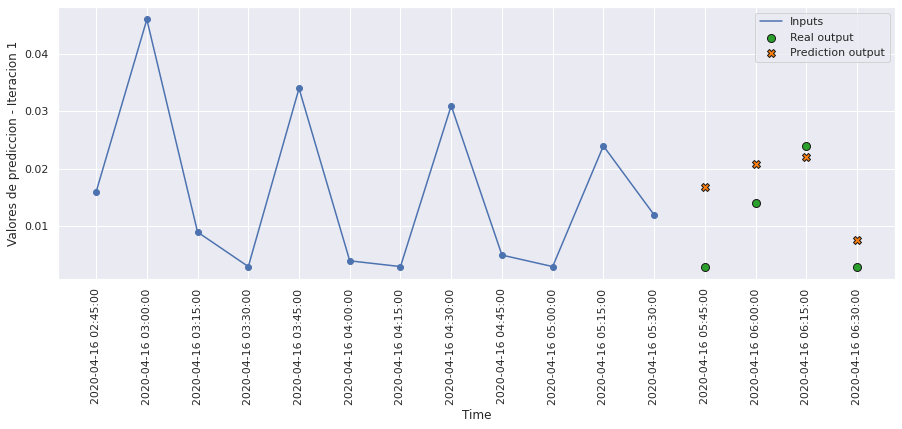

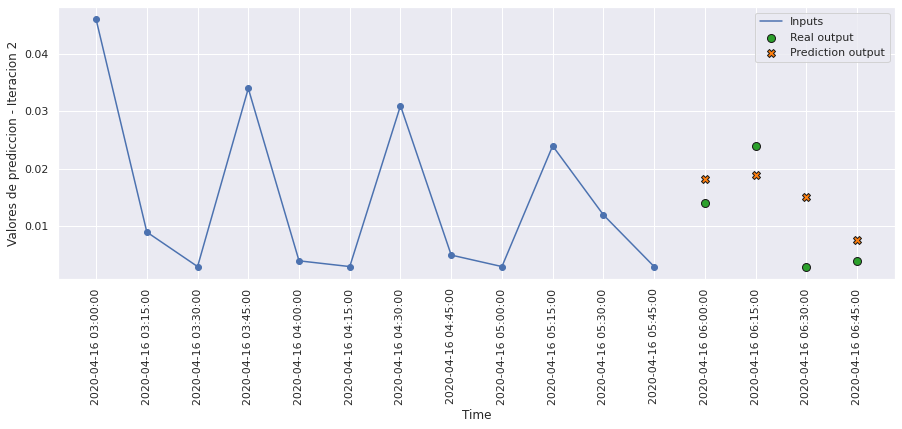

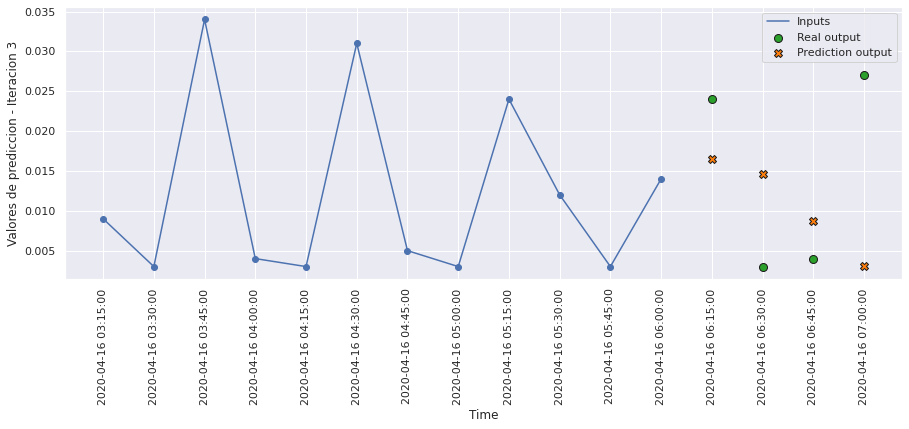

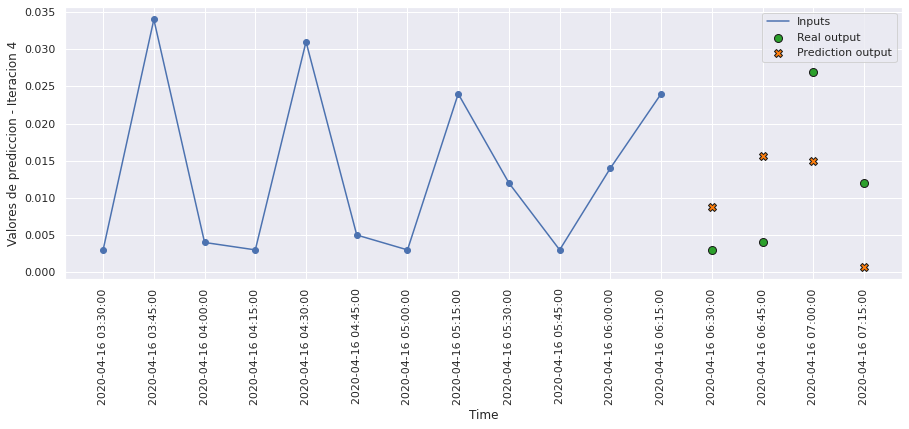

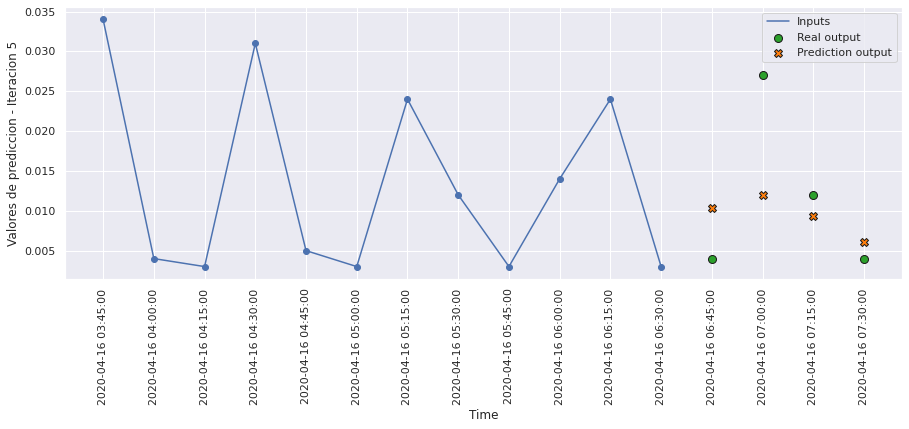

...

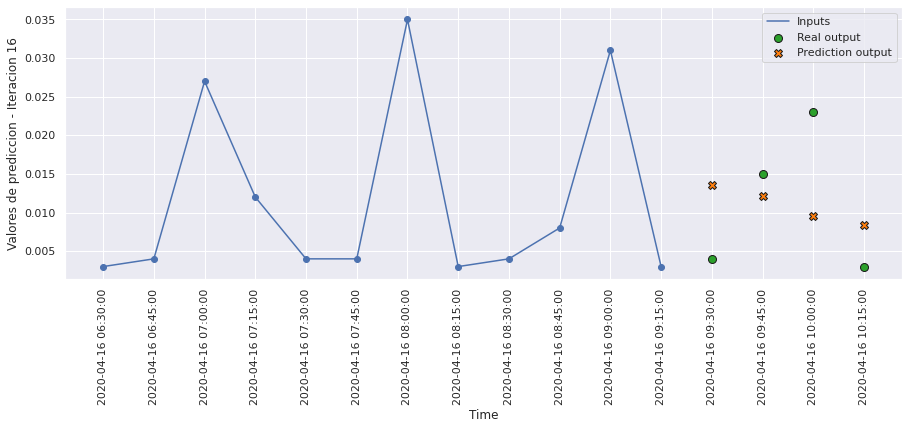

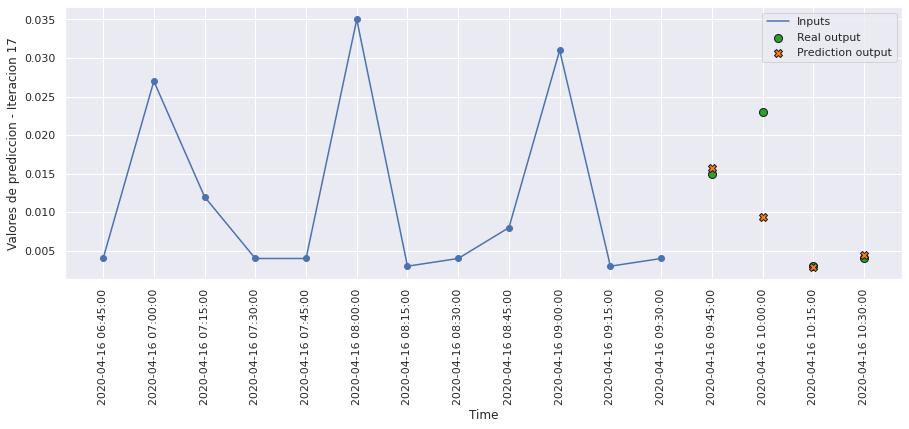

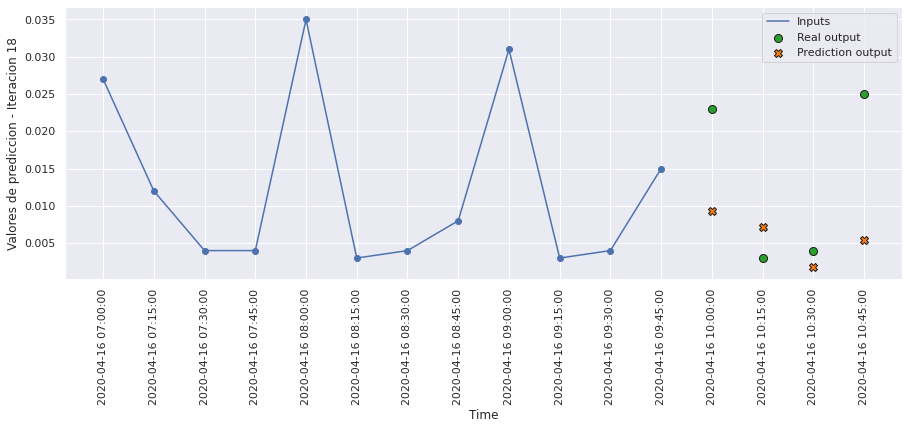

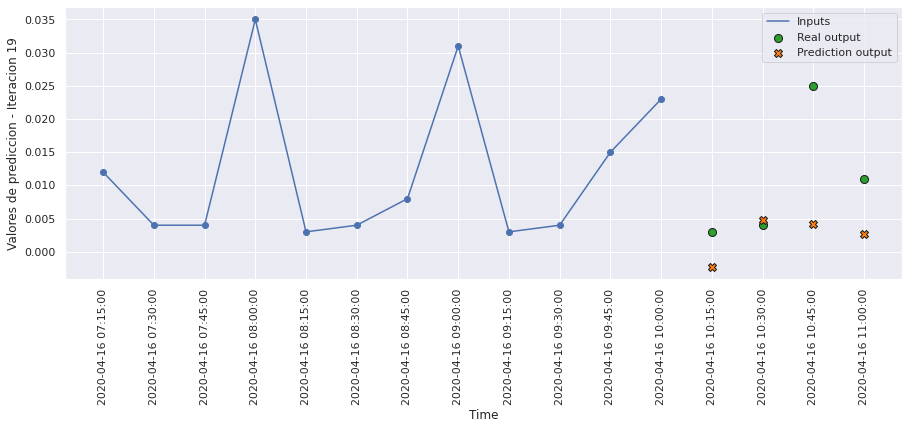

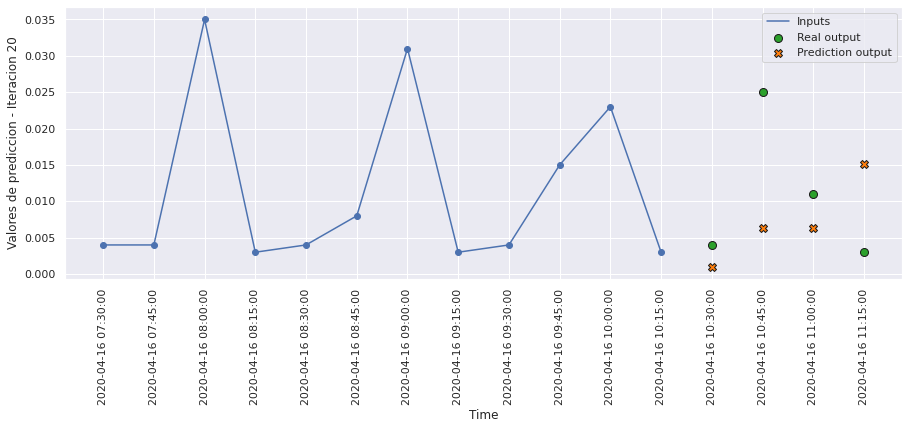

In [95]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict5.reshape(testPredict5.shape[0],n_predicciones), 20, 0)

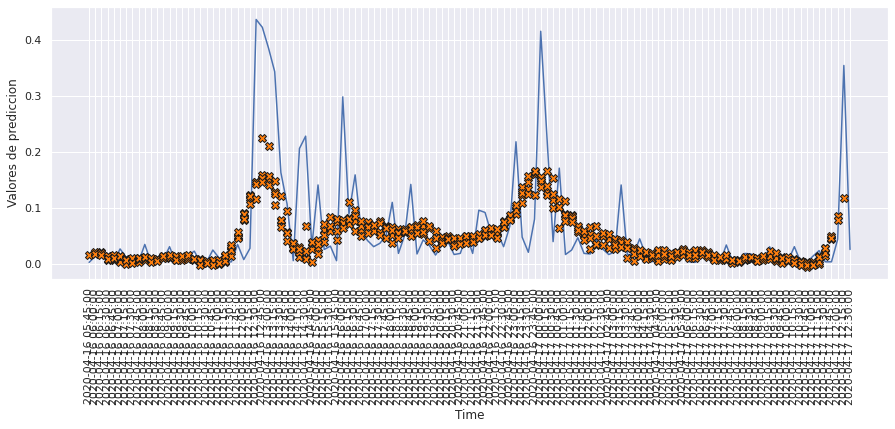

In [96]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 120)

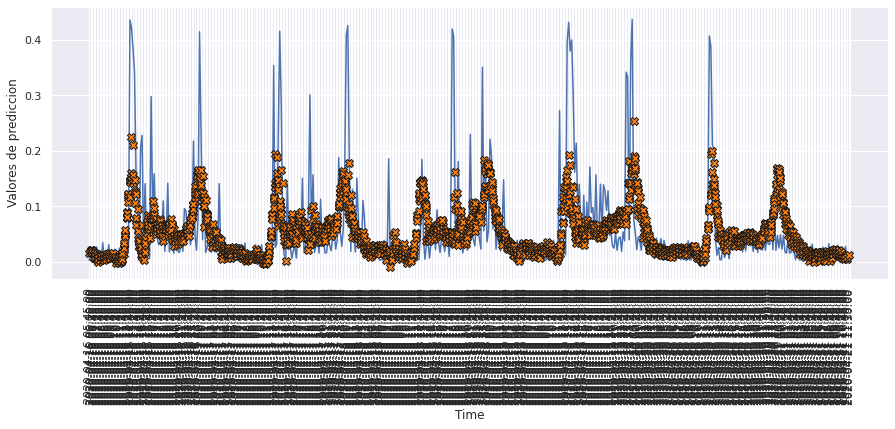

In [97]:
plot_window_predictions_values(int(test_df.iloc[0].name), 
                               testPredict5.reshape(testPredict5.shape[0],n_predicciones), 500)

# MODELO 6: CONVOLUCIONAL 1D CON LSTM 

### Construimos el modelo

In [98]:
def build_model6():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Conv1D(filters=64, kernel_size=1, activation='relu')), 
        tf.keras.layers.TimeDistributed(tf.keras.layers.MaxPooling1D(pool_size=2)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Flatten()),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [99]:
model6 = build_model6()
model6.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, None, 12, 64)     512       
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, None, 6, 64)      0         
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, None, 384)        0         
 tributed)                                                       
                                                                 
 lstm_7 (LSTM)               (None, None, 128)         262656    
                                                                 
 dense_5 (Dense)             (None, None, 4)           516       
                                                      

### Entrenamiento del modelo

In [100]:
history6 = model6.fit(scaled_trainX_4D, data_trainY_3D, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY_3D), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 5s 11ms/step - loss: 0.0060 - mae: 0.0473 - mse: 0.0060 - smape: 0.8635 - val_loss: 0.0060 - val_mae: 0.0466 - val_mse: 0.0060 - val_smape: 0.8634
Epoch 2/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0055 - mae: 0.0443 - mse: 0.0055 - smape: 0.7936 - val_loss: 0.0061 - val_mae: 0.0438 - val_mse: 0.0061 - val_smape: 0.9225
Epoch 3/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0053 - mae: 0.0427 - mse: 0.0053 - smape: 0.7602 - val_loss: 0.0060 - val_mae: 0.0438 - val_mse: 0.0060 - val_smape: 0.8149
Epoch 4/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0051 - mae: 0.0417 - mse: 0.0051 - smape: 0.7480 - val_loss: 0.0062 - val_mae: 0.0444 - val_mse: 0.0062 - val_smape: 0.7927
Epoch 5/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0050 - mae: 0.0411 - mse: 0.0050 - smape: 0.7409 - val_loss: 0.0061 - val_mae: 0.0443 - val_mse: 0.0061 - val_smap

354/354 [==============================] - 3s 10ms/step - loss: 0.0036 - mae: 0.0350 - mse: 0.0036 - smape: 0.6974 - val_loss: 0.0088 - val_mae: 0.0520 - val_mse: 0.0088 - val_smape: 0.8679
Epoch 82/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0035 - mae: 0.0350 - mse: 0.0035 - smape: 0.6969 - val_loss: 0.0095 - val_mae: 0.0551 - val_mse: 0.0095 - val_smape: 0.8651
Epoch 83/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0035 - mae: 0.0349 - mse: 0.0035 - smape: 0.6959 - val_loss: 0.0088 - val_mae: 0.0515 - val_mse: 0.0088 - val_smape: 0.8559
Epoch 84/200
354/354 [==============================] - 4s 10ms/step - loss: 0.0035 - mae: 0.0349 - mse: 0.0035 - smape: 0.6966 - val_loss: 0.0091 - val_mae: 0.0527 - val_mse: 0.0091 - val_smape: 0.8714
Epoch 85/200
354/354 [==============================] - 3s 10ms/step - loss: 0.0035 - mae: 0.0348 - mse: 0.0035 - smape: 0.6954 - val_loss: 0.0095 - val_mae: 0.0547 - val_mse: 0.0095 - val_smape: 0.871

In [101]:
hist6 = pd.DataFrame(history6.history)
hist6['epoch'] = history6.epoch
hist6

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006004,0.047278,0.006004,0.863537,0.006023,0.046606,0.006023,0.863444,0
1,0.005542,0.044311,0.005542,0.793614,0.006104,0.043833,0.006104,0.922466,1
2,0.005299,0.042683,0.005299,0.760188,0.006015,0.043824,0.006015,0.814896,2
3,0.005130,0.041723,0.005130,0.748044,0.006160,0.044398,0.006160,0.792746,3
4,0.005026,0.041092,0.005026,0.740921,0.006112,0.044319,0.006112,0.787314,4
...,...,...,...,...,...,...,...,...,...
104,0.003222,0.033725,0.003222,0.691142,0.010351,0.055862,0.010351,0.886991,104
105,0.003209,0.033692,0.003209,0.691322,0.010434,0.056928,0.010434,0.888928,105
106,0.003200,0.033678,0.003200,0.692021,0.010434,0.056219,0.010434,0.884427,106
107,0.003190,0.033580,0.003190,0.690834,0.011067,0.058027,0.011067,0.901909,107


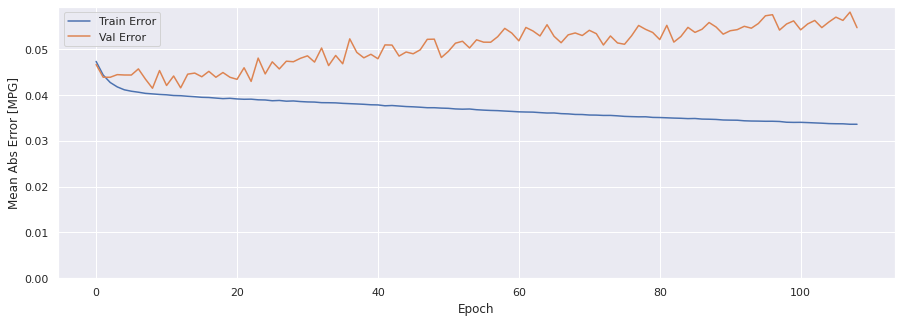

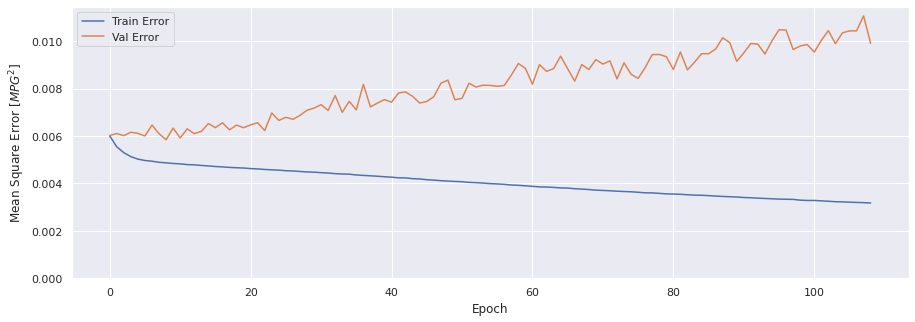

In [102]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history6)

### Evaluar predicciones

In [103]:
score_train6 = model6.evaluate(scaled_trainX_4D, data_trainY_3D, verbose=1)
print(f'Loss:{score_train6[0]}')
print(f'MAE:{score_train6[1]}')
print(f'MSE:{score_train6[2]}')
print(f'SMAPE:{score_train6[3]}')

1413/1413 [==============================] - 8s 5ms/step - loss: 0.0031 - mae: 0.0327 - mse: 0.0031 - smape: 0.6846
Loss:0.00306228781118989
MAE:0.03274529054760933
MSE:0.00306228781118989
SMAPE:0.6845936179161072


In [104]:
score_val6 = model6.evaluate(scaled_valX_4D, data_valY_3D, verbose=1)
print(f'Loss:{score_val6[0]}')
print(f'MAE:{score_val6[1]}')
print(f'MSE:{score_val6[2]}')
print(f'SMAPE:{score_val6[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0099 - mae: 0.0546 - mse: 0.0099 - smape: 0.8801
Loss:0.009908681735396385
MAE:0.05463176965713501
MSE:0.009908681735396385
SMAPE:0.8800719380378723


In [105]:
score_test6 = model6.evaluate(scaled_testX_4D, data_testY_3D, verbose=1)
print(f'Loss:{score_test6[0]}')
print(f'MAE:{score_test6[1]}')
print(f'MSE:{score_test6[2]}')
print(f'SMAPE:{score_test6[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0082 - mae: 0.0517 - mse: 0.0082 - smape: 0.8318
Loss:0.008221390657126904
MAE:0.051682017743587494
MSE:0.008221390657126904
SMAPE:0.8317914009094238


### Comparativa de resultados

In [106]:
result = hist6.iloc[-1]
comparativa6 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test6[1], score_test6[2], score_test6[3], math.sqrt(score_test6[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa6.style.set_caption("Método de ventana de varios pasos - Convolucional 1D con LSTM")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.033579,0.003175,0.690736,0.056349
VALIDACION,0.054632,0.009909,0.880665,0.099542
TEST,0.051682,0.008221,0.831791,0.090672


### Obtener predicciones

In [107]:
trainPredict6 = model6.predict(scaled_trainX_4D)
testPredict6 = model6.predict(scaled_testX_4D)

### Visualización de las predicciones

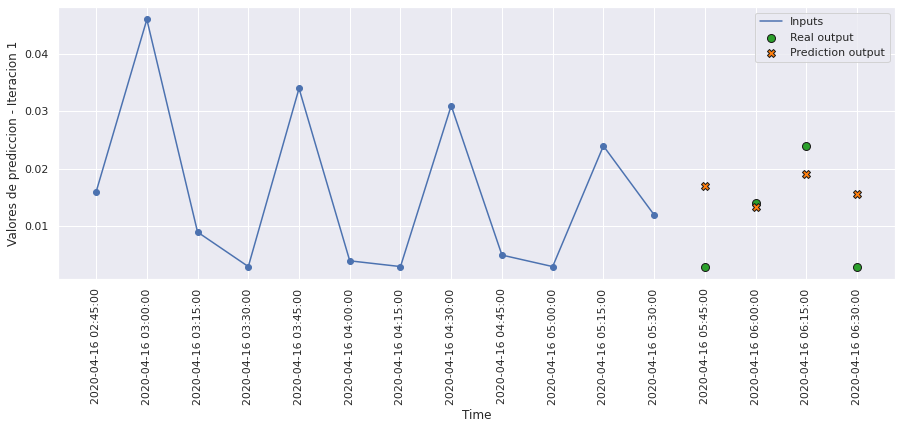

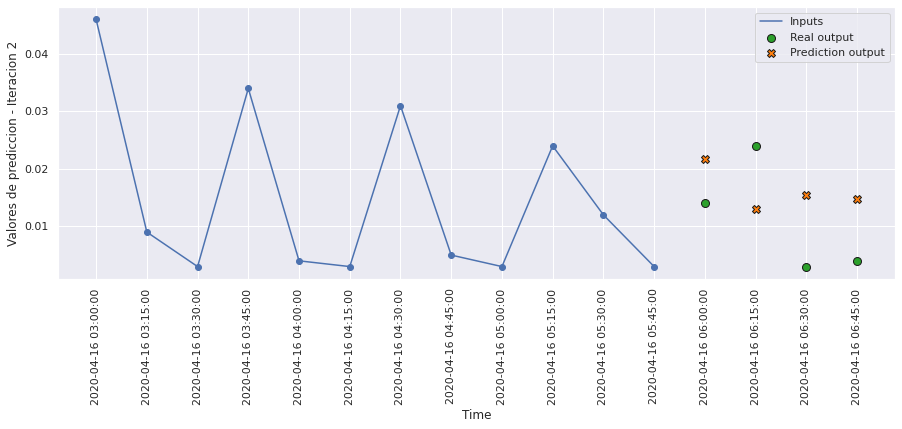

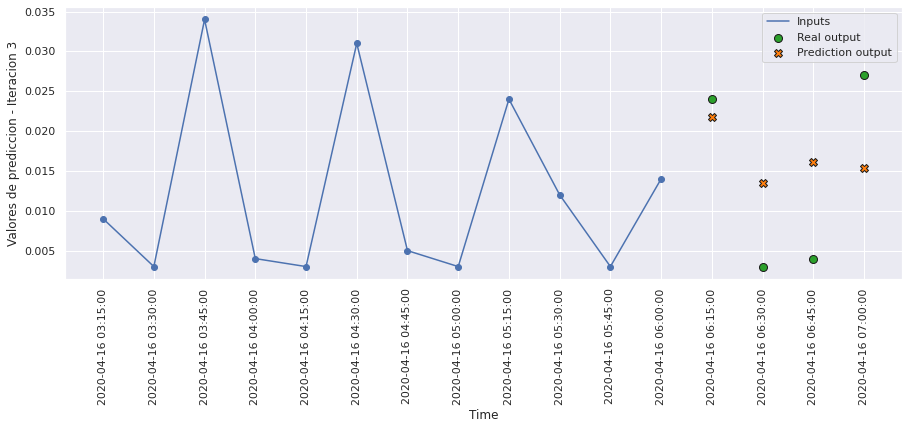

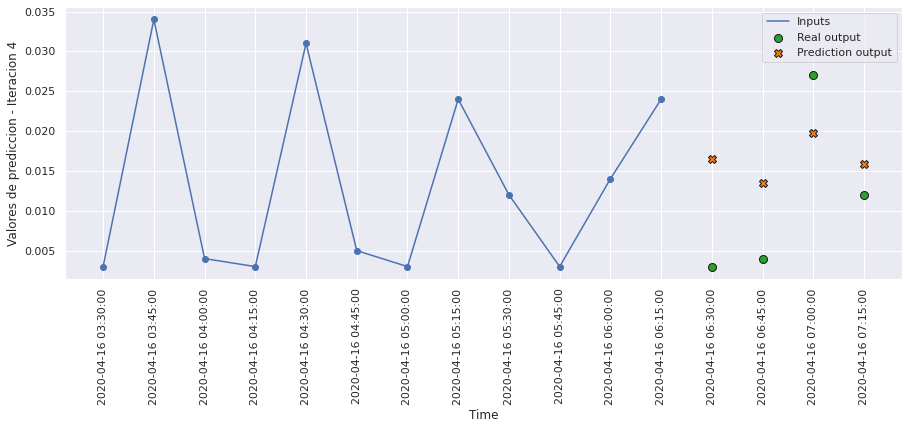

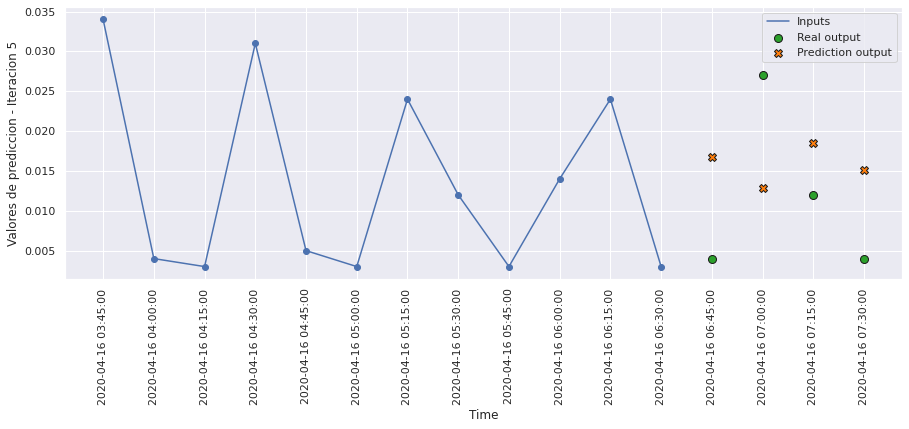

...

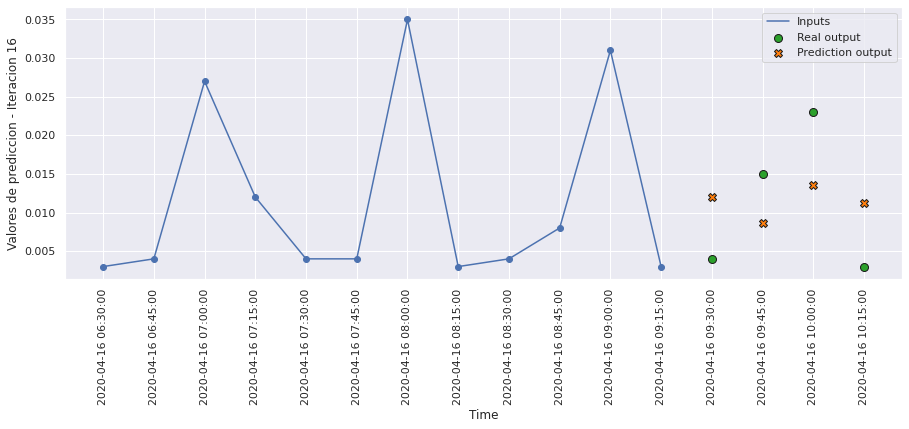

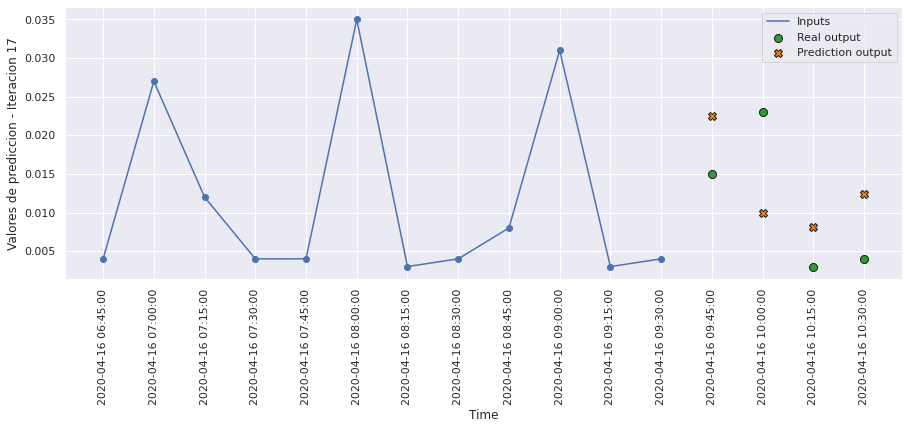

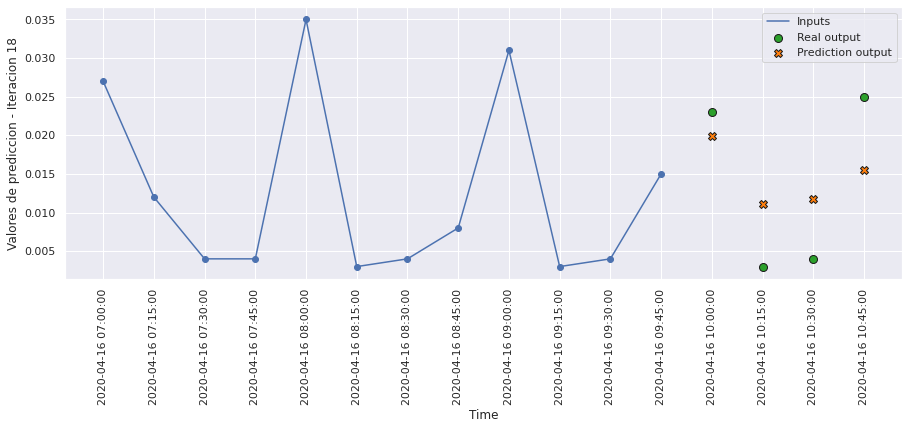

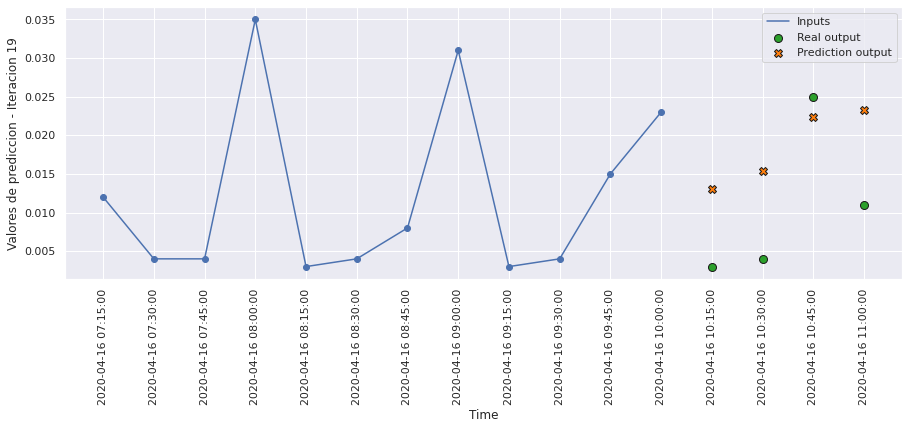

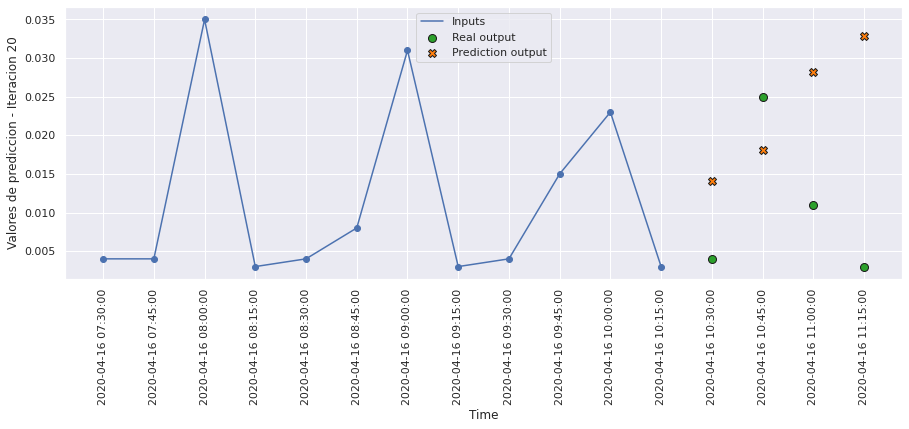

In [108]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict6.reshape(testPredict6.shape[0],n_predicciones), 20, 0)

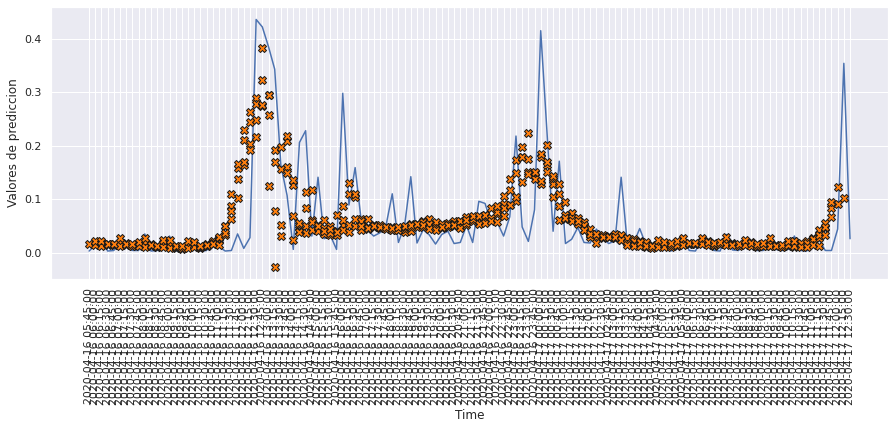

In [109]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 120)

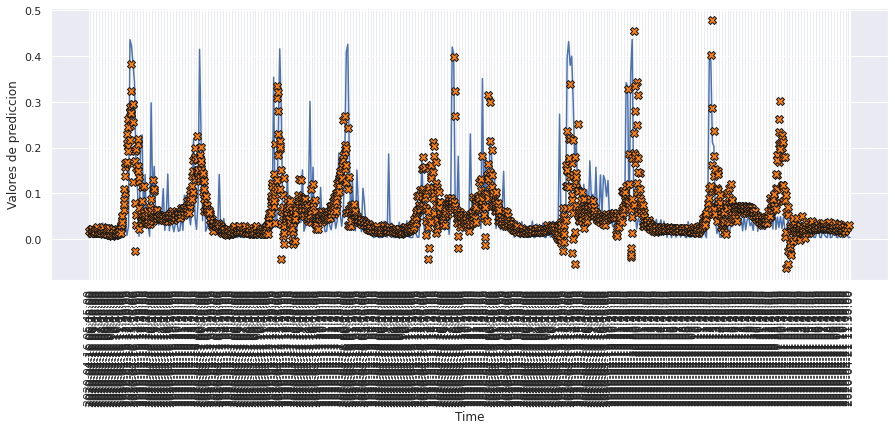

In [110]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict6.reshape(testPredict6.shape[0],n_predicciones), 500)

# MODELO 7: CONVLSTM1D

### Construimos el modelo

In [111]:
def build_model7():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM1D(filters=64, kernel_size=1, activation='tanh'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [112]:
model7 = build_model7()
model7.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm1d (ConvLSTM1D)    (None, 12, 64)            18432     
                                                                 
 flatten_2 (Flatten)         (None, 768)               0         
                                                                 
 dense_6 (Dense)             (None, 4)                 3076      
                                                                 
Total params: 21,508
Trainable params: 21,508
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [113]:
history7 = model7.fit(scaled_trainX_4D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_4D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 10s 22ms/step - loss: 0.0060 - mae: 0.0459 - mse: 0.0060 - smape: 0.8293 - val_loss: 0.0059 - val_mae: 0.0483 - val_mse: 0.0059 - val_smape: 0.8514
Epoch 2/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0056 - mae: 0.0449 - mse: 0.0056 - smape: 0.8249 - val_loss: 0.0058 - val_mae: 0.0443 - val_mse: 0.0058 - val_smape: 0.9407
Epoch 3/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0056 - mae: 0.0449 - mse: 0.0056 - smape: 0.8298 - val_loss: 0.0057 - val_mae: 0.0435 - val_mse: 0.0057 - val_smape: 0.8022
Epoch 4/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0056 - mae: 0.0448 - mse: 0.0056 - smape: 0.8268 - val_loss: 0.0057 - val_mae: 0.0413 - val_mse: 0.0057 - val_smape: 0.8458
Epoch 5/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0056 - mae: 0.0446 - mse: 0.0056 - smape: 0.8251 - val_loss: 0.0058 - val_mae: 0.0451 - val_mse: 0.0058 - val_sma

354/354 [==============================] - 7s 21ms/step - loss: 0.0049 - mae: 0.0403 - mse: 0.0049 - smape: 0.7329 - val_loss: 0.0060 - val_mae: 0.0455 - val_mse: 0.0060 - val_smape: 0.8088
Epoch 82/200
354/354 [==============================] - 7s 21ms/step - loss: 0.0049 - mae: 0.0403 - mse: 0.0049 - smape: 0.7308 - val_loss: 0.0062 - val_mae: 0.0454 - val_mse: 0.0062 - val_smape: 0.7884
Epoch 83/200
354/354 [==============================] - 8s 22ms/step - loss: 0.0049 - mae: 0.0403 - mse: 0.0049 - smape: 0.7322 - val_loss: 0.0061 - val_mae: 0.0456 - val_mse: 0.0061 - val_smape: 0.8091
Epoch 84/200
354/354 [==============================] - 8s 21ms/step - loss: 0.0048 - mae: 0.0403 - mse: 0.0048 - smape: 0.7304 - val_loss: 0.0060 - val_mae: 0.0441 - val_mse: 0.0060 - val_smape: 0.8200
Epoch 85/200
354/354 [==============================] - 8s 21ms/step - loss: 0.0048 - mae: 0.0402 - mse: 0.0048 - smape: 0.7289 - val_loss: 0.0061 - val_mae: 0.0453 - val_mse: 0.0061 - val_smape: 0.791

In [114]:
hist7 = pd.DataFrame(history7.history)
hist7['epoch'] = history7.epoch
hist7

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006017,0.045853,0.006017,0.829258,0.005948,0.048328,0.005948,0.851399,0
1,0.005637,0.044910,0.005637,0.824855,0.005814,0.044295,0.005814,0.940675,1
2,0.005601,0.044922,0.005601,0.829775,0.005720,0.043504,0.005720,0.802153,2
3,0.005584,0.044767,0.005584,0.826812,0.005726,0.041309,0.005726,0.845773,3
4,0.005559,0.044630,0.005559,0.825122,0.005766,0.045150,0.005766,0.881110,4
...,...,...,...,...,...,...,...,...,...
101,0.004740,0.039656,0.004740,0.719953,0.006131,0.044598,0.006131,0.832832,101
102,0.004734,0.039692,0.004734,0.721774,0.006176,0.045248,0.006176,0.816576,102
103,0.004734,0.039691,0.004734,0.721220,0.006154,0.043262,0.006154,0.795458,103
104,0.004726,0.039608,0.004726,0.720425,0.006071,0.045362,0.006071,0.832134,104


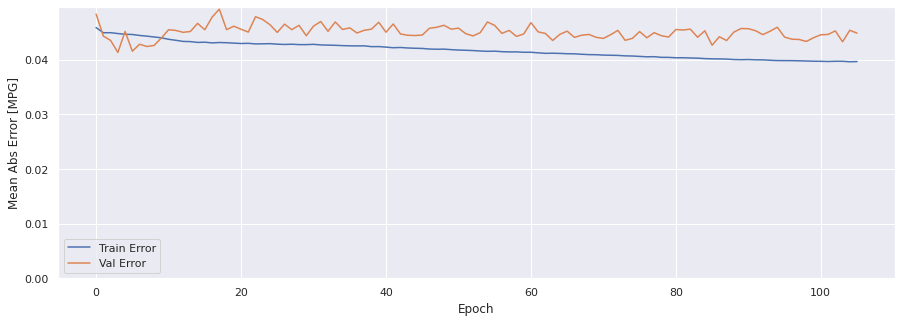

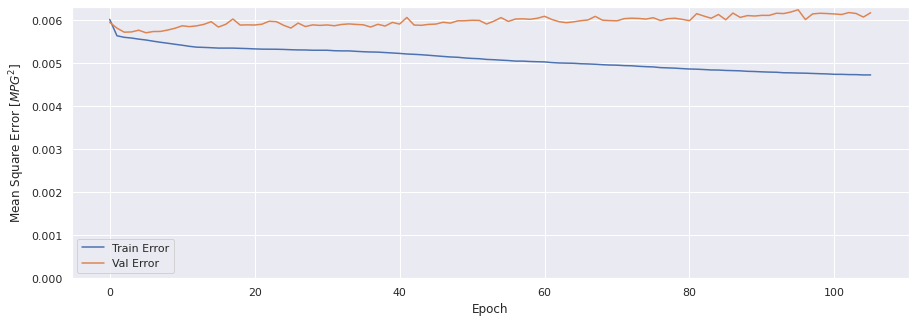

In [115]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history7)

### Evaluar predicciones

In [116]:
score_train7 = model7.evaluate(scaled_trainX_4D, data_trainY, verbose=1)
print(f'Loss:{score_train7[0]}')
print(f'MAE:{score_train7[1]}')
print(f'MSE:{score_train7[2]}')
print(f'SMAPE:{score_train7[3]}')

1413/1413 [==============================] - 9s 7ms/step - loss: 0.0047 - mae: 0.0409 - mse: 0.0047 - smape: 0.7353
Loss:0.004714952781796455
MAE:0.04086900129914284
MSE:0.004714952781796455
SMAPE:0.7353388667106628


In [117]:
score_val7 = model7.evaluate(scaled_valX_4D, data_valY, verbose=1)
print(f'Loss:{score_val7[0]}')
print(f'MAE:{score_val7[1]}')
print(f'MSE:{score_val7[2]}')
print(f'SMAPE:{score_val7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0062 - mae: 0.0448 - mse: 0.0062 - smape: 0.7893
Loss:0.00617212476208806
MAE:0.04484475031495094
MSE:0.00617212476208806
SMAPE:0.7893267869949341


In [118]:
score_test7 = model7.evaluate(scaled_testX_4D, data_testY, verbose=1)
print(f'Loss:{score_test7[0]}')
print(f'MAE:{score_test7[1]}')
print(f'MSE:{score_test7[2]}')
print(f'SMAPE:{score_test7[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0061 - mae: 0.0477 - mse: 0.0061 - smape: 0.7960
Loss:0.0060647292993962765
MAE:0.04770626500248909
MSE:0.0060647292993962765
SMAPE:0.7960060834884644


### Comparativa de resultados

In [119]:
result = hist7.iloc[-1]
comparativa7 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test7[1], score_test7[2], score_test7[3], math.sqrt(score_test7[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa7.style.set_caption("Método de ventana de varios pasos - CONVLSTM 1D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.039642,0.004727,0.720918,0.068753
VALIDACION,0.044845,0.006172,0.790586,0.078563
TEST,0.047706,0.006065,0.796006,0.077876


### Obtener predicciones

In [120]:
trainPredict7 = model7.predict(scaled_trainX_4D)
testPredict7 = model7.predict(scaled_testX_4D)

### Visualización de las predicciones

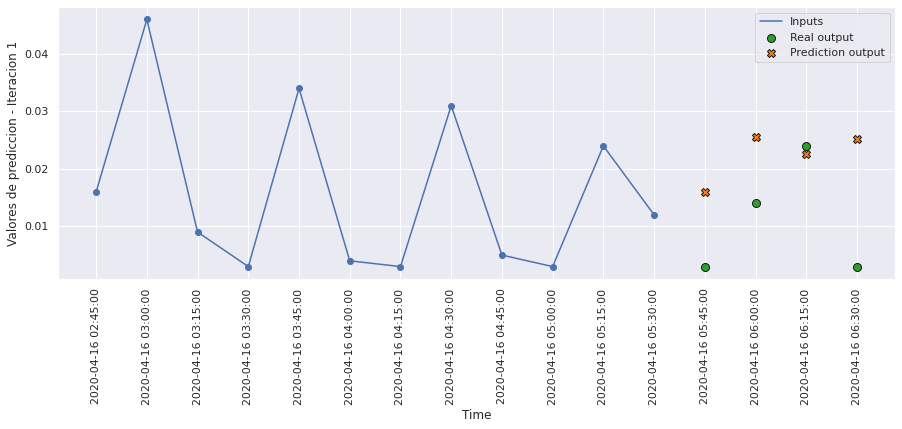

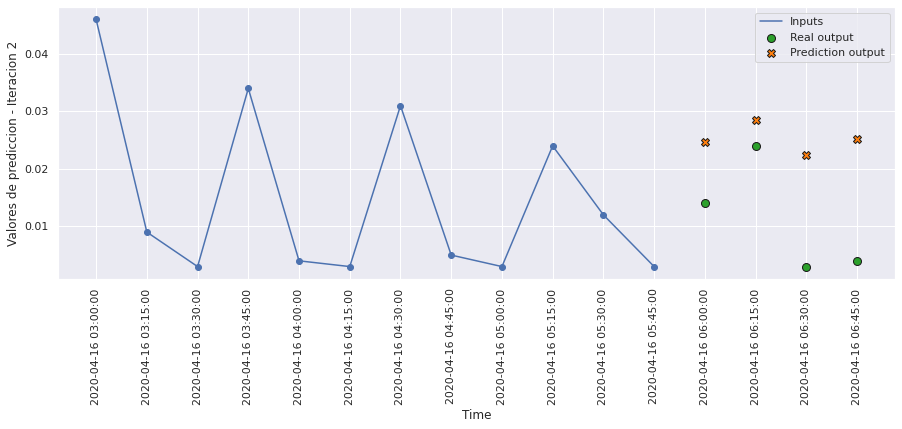

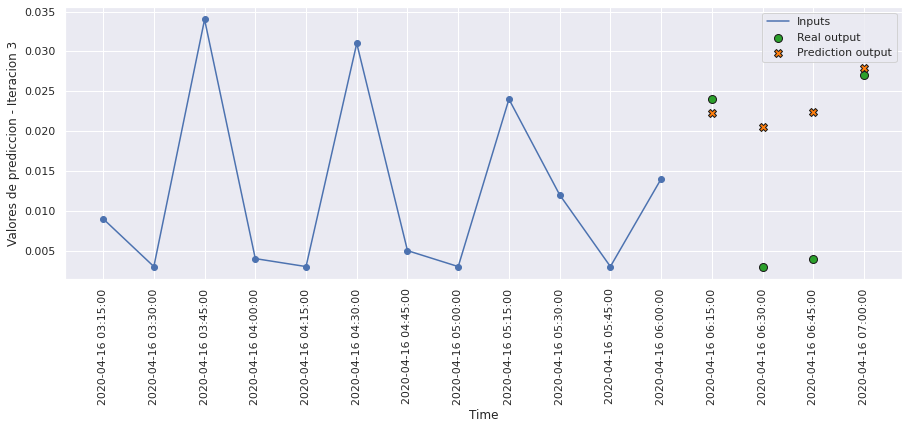

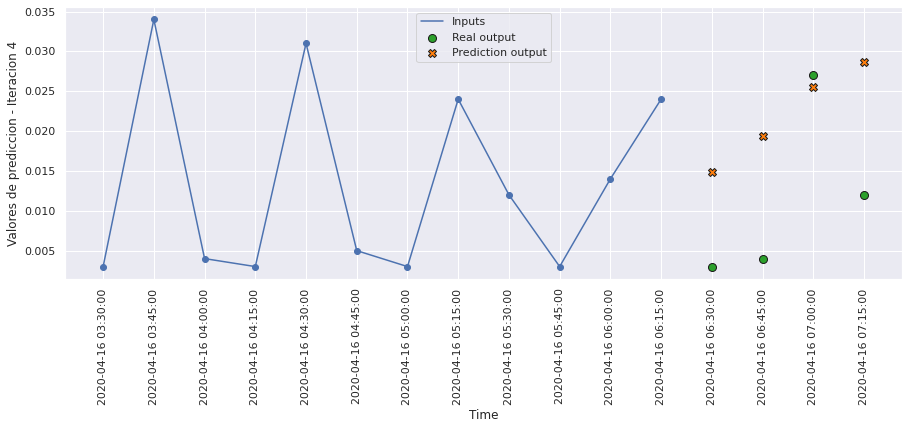

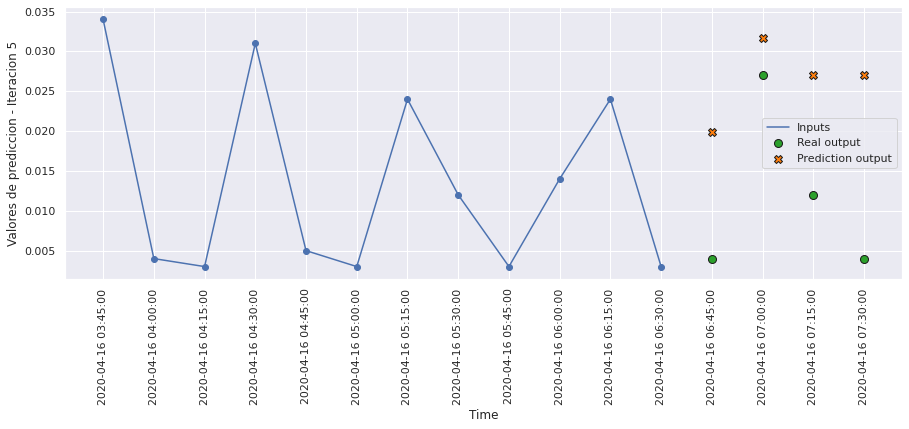

...

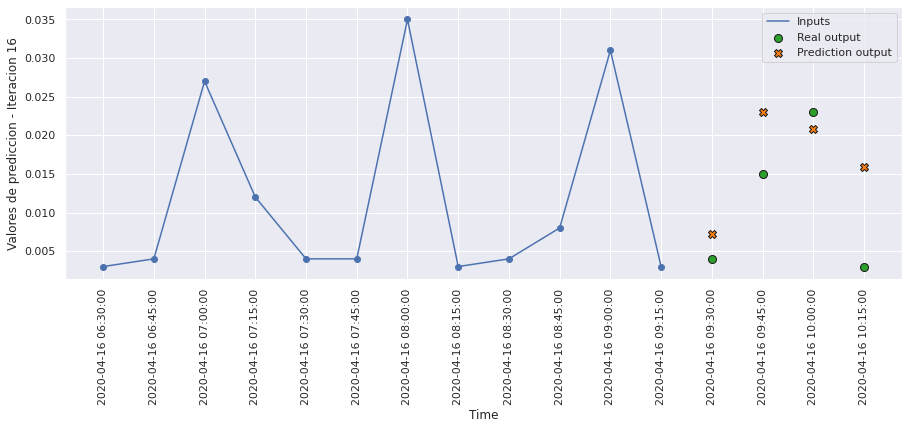

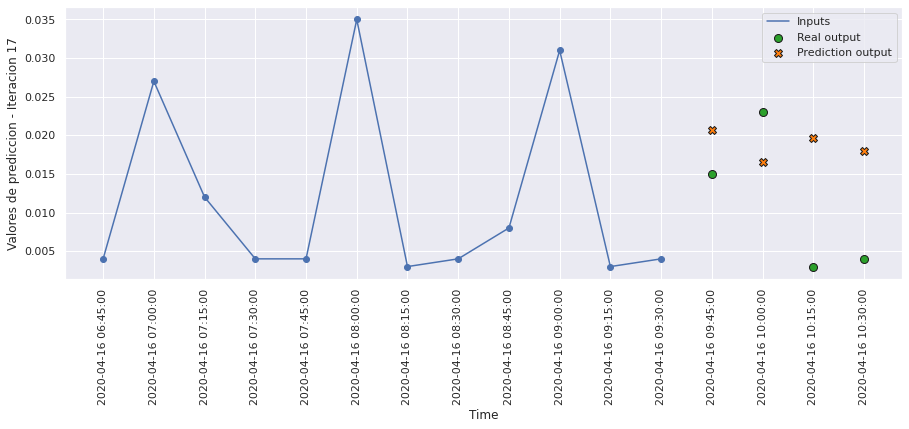

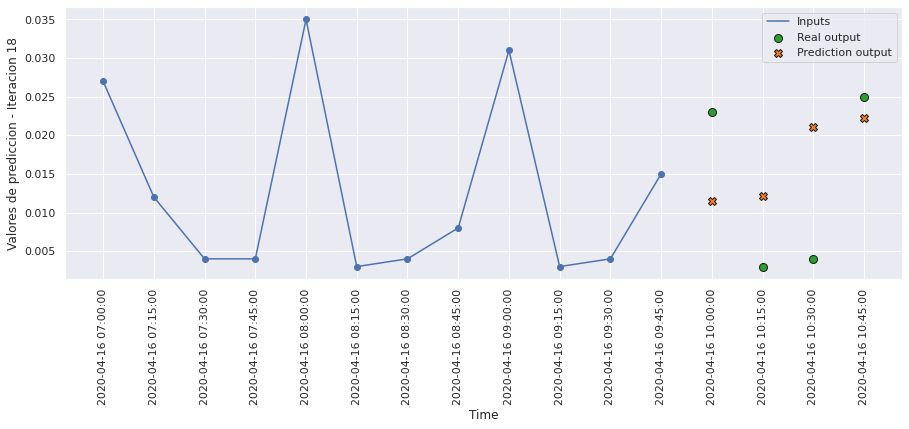

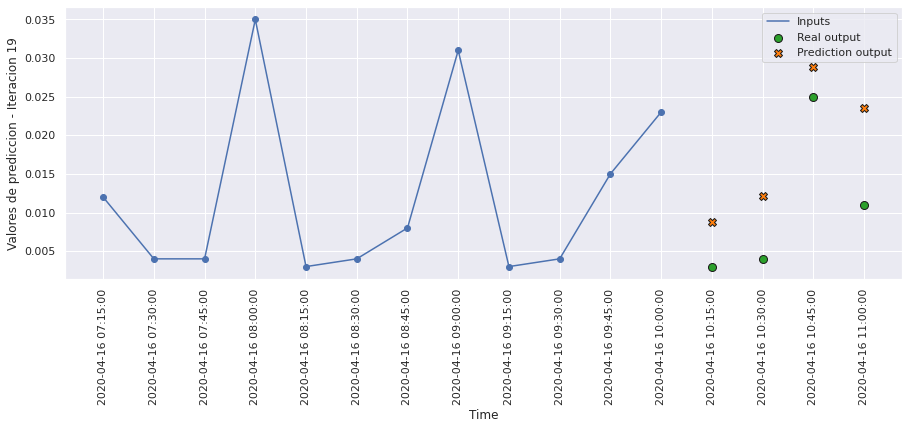

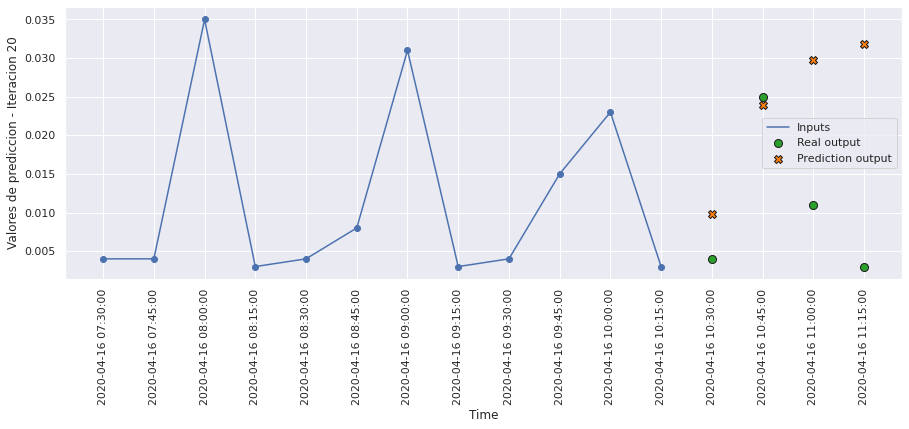

In [121]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict7, 20, 0)

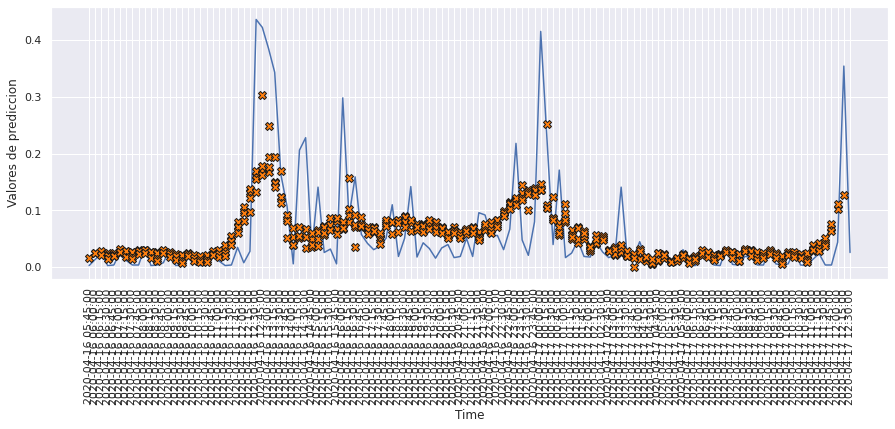

In [122]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 120)

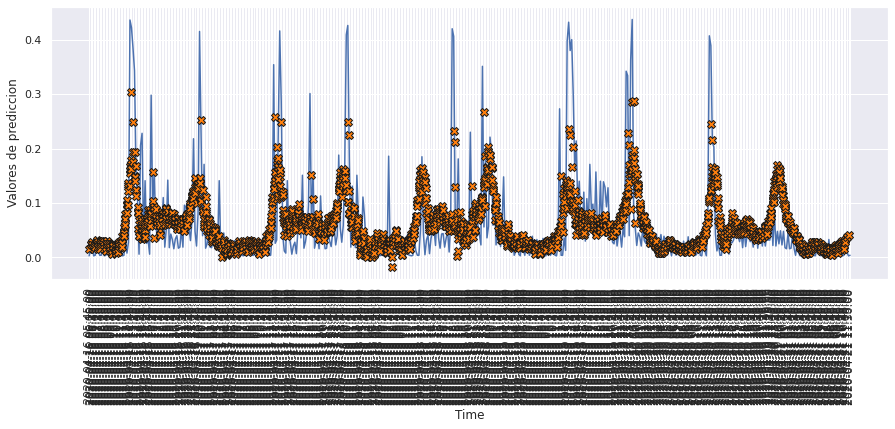

In [123]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict7, 500)

# MODELO 8: CONVLSTM2D

### Construimos el modelo

In [124]:
def build_model8():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(1, 1, n_entrada, n_features)),
        tf.keras.layers.ConvLSTM2D(filters=64, kernel_size=(1,1), activation='relu'),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones),
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [125]:
model8 = build_model8()
model8.summary()

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv_lstm2d (ConvLSTM2D)    (None, 1, 12, 64)         18432     
                                                                 
 flatten_3 (Flatten)         (None, 768)               0         
                                                                 
 dense_7 (Dense)             (None, 4)                 3076      
                                                                 
Total params: 21,508
Trainable params: 21,508
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [126]:
history8 = model8.fit(scaled_trainX_5D, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX_5D, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 9s 21ms/step - loss: 0.0059 - mae: 0.0463 - mse: 0.0059 - smape: 0.8452 - val_loss: 0.0059 - val_mae: 0.0447 - val_mse: 0.0059 - val_smape: 0.9045
Epoch 2/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0054 - mae: 0.0436 - mse: 0.0054 - smape: 0.7981 - val_loss: 0.0058 - val_mae: 0.0447 - val_mse: 0.0058 - val_smape: 0.8071
Epoch 3/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0051 - mae: 0.0423 - mse: 0.0051 - smape: 0.7686 - val_loss: 0.0060 - val_mae: 0.0460 - val_mse: 0.0060 - val_smape: 0.8511
Epoch 4/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0051 - mae: 0.0419 - mse: 0.0051 - smape: 0.7686 - val_loss: 0.0061 - val_mae: 0.0466 - val_mse: 0.0061 - val_smape: 0.8771
Epoch 5/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0050 - mae: 0.0416 - mse: 0.0050 - smape: 0.7636 - val_loss: 0.0061 - val_mae: 0.0453 - val_mse: 0.0061 - val_smap

354/354 [==============================] - 7s 20ms/step - loss: 0.0045 - mae: 0.0391 - mse: 0.0045 - smape: 0.7238 - val_loss: 0.0065 - val_mae: 0.0455 - val_mse: 0.0065 - val_smape: 0.8360
Epoch 82/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0045 - mae: 0.0390 - mse: 0.0045 - smape: 0.7239 - val_loss: 0.0066 - val_mae: 0.0471 - val_mse: 0.0066 - val_smape: 0.8095
Epoch 83/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0045 - mae: 0.0391 - mse: 0.0045 - smape: 0.7238 - val_loss: 0.0065 - val_mae: 0.0447 - val_mse: 0.0065 - val_smape: 0.8485
Epoch 84/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0045 - mae: 0.0390 - mse: 0.0045 - smape: 0.7223 - val_loss: 0.0065 - val_mae: 0.0459 - val_mse: 0.0065 - val_smape: 0.8103
Epoch 85/200
354/354 [==============================] - 7s 20ms/step - loss: 0.0045 - mae: 0.0390 - mse: 0.0045 - smape: 0.7206 - val_loss: 0.0068 - val_mae: 0.0473 - val_mse: 0.0068 - val_smape: 0.854

In [127]:
hist8 = pd.DataFrame(history8.history)
hist8['epoch'] = history8.epoch
hist8

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005902,0.046302,0.005902,0.845241,0.005933,0.044681,0.005933,0.904513,0
1,0.005363,0.043593,0.005363,0.798139,0.005797,0.044748,0.005797,0.807062,1
2,0.005143,0.042257,0.005143,0.768650,0.006009,0.046047,0.006009,0.851123,2
3,0.005061,0.041879,0.005061,0.768556,0.006134,0.046615,0.006134,0.877069,3
4,0.005015,0.041582,0.005015,0.763585,0.006075,0.045260,0.006075,0.877904,4
...,...,...,...,...,...,...,...,...,...
97,0.004508,0.039011,0.004508,0.723644,0.006742,0.047233,0.006742,0.892605,97
98,0.004511,0.039000,0.004511,0.725284,0.006682,0.046481,0.006682,0.836428,98
99,0.004505,0.038981,0.004505,0.723222,0.006585,0.045127,0.006585,0.894525,99
100,0.004500,0.038887,0.004500,0.720804,0.006727,0.046792,0.006727,0.883543,100


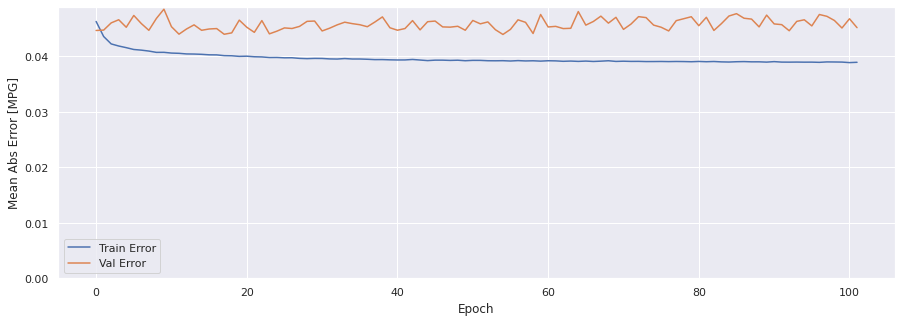

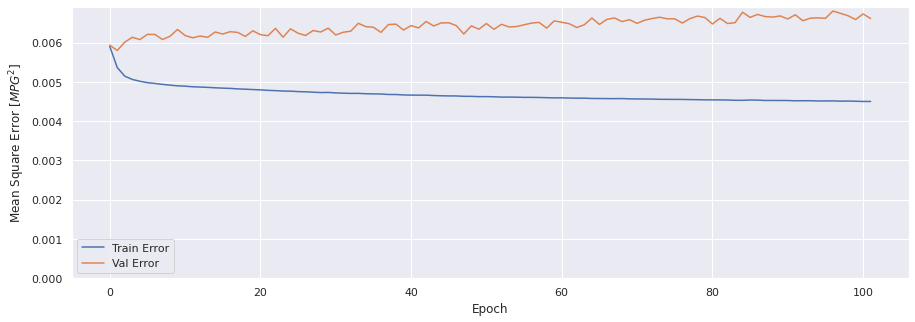

In [128]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history8)

### Evaluar predicciones

In [129]:
score_train8 = model8.evaluate(scaled_trainX_5D, data_trainY, verbose=1)
print(f'Loss:{score_train8[0]}')
print(f'MAE:{score_train8[1]}')
print(f'MSE:{score_train8[2]}')
print(f'SMAPE:{score_train8[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0045 - mae: 0.0375 - mse: 0.0045 - smape: 0.7171
Loss:0.004478816408663988
MAE:0.03748810291290283
MSE:0.004478816408663988
SMAPE:0.7171411514282227


In [130]:
score_val8 = model8.evaluate(scaled_valX_5D, data_valY, verbose=1)
print(f'Loss:{score_val8[0]}')
print(f'MAE:{score_val8[1]}')
print(f'MSE:{score_val8[2]}')
print(f'SMAPE:{score_val8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0066 - mae: 0.0452 - mse: 0.0066 - smape: 0.8589
Loss:0.006610978860408068
MAE:0.04518763720989227
MSE:0.006610978860408068
SMAPE:0.8589023351669312


In [131]:
score_test8 = model8.evaluate(scaled_testX_5D, data_testY, verbose=1)
print(f'Loss:{score_test8[0]}')
print(f'MAE:{score_test8[1]}')
print(f'MSE:{score_test8[2]}')
print(f'SMAPE:{score_test8[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0063 - mae: 0.0469 - mse: 0.0063 - smape: 0.8304
Loss:0.0062921056523919106
MAE:0.046903785318136215
MSE:0.0062921056523919106
SMAPE:0.8303649425506592


### Comparativa de resultados

In [132]:
result = hist8.iloc[-1]
comparativa8 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test8[1], score_test8[2], score_test8[3], math.sqrt(score_test8[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa8.style.set_caption("Método de ventana de varios pasos - CONVLSTM 2D")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.038944,0.004500,0.723209,0.067085
VALIDACION,0.045188,0.006611,0.859776,0.081308
TEST,0.046904,0.006292,0.830365,0.079323


### Obtener predicciones

In [133]:
trainPredict8 = model8.predict(scaled_trainX_5D)
testPredict8 = model8.predict(scaled_testX_5D)

### Visualización de las predicciones

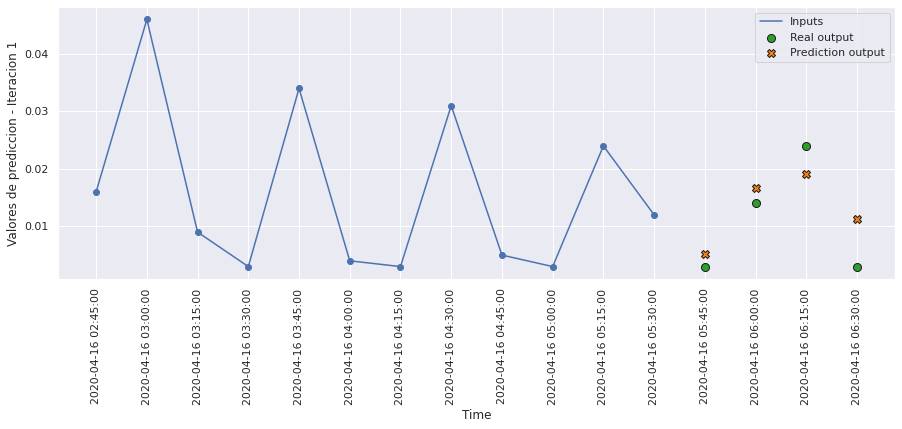

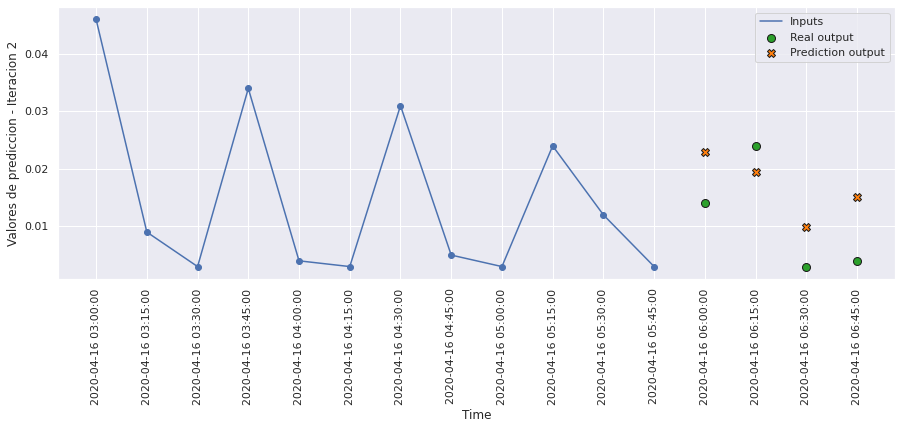

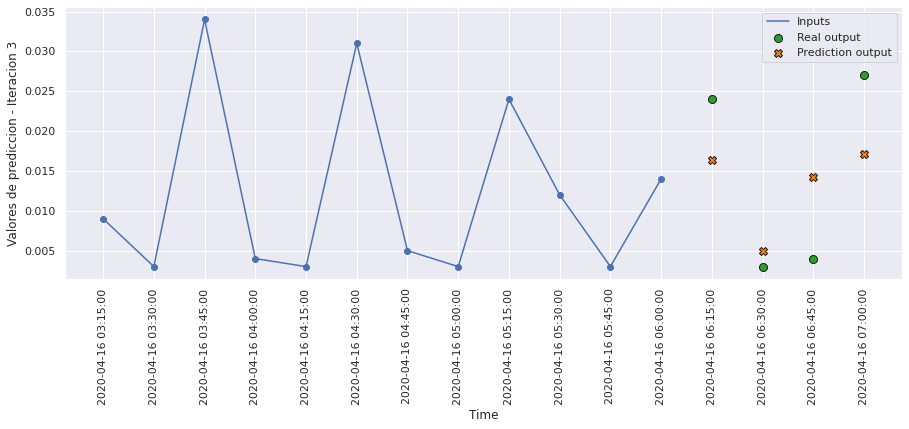

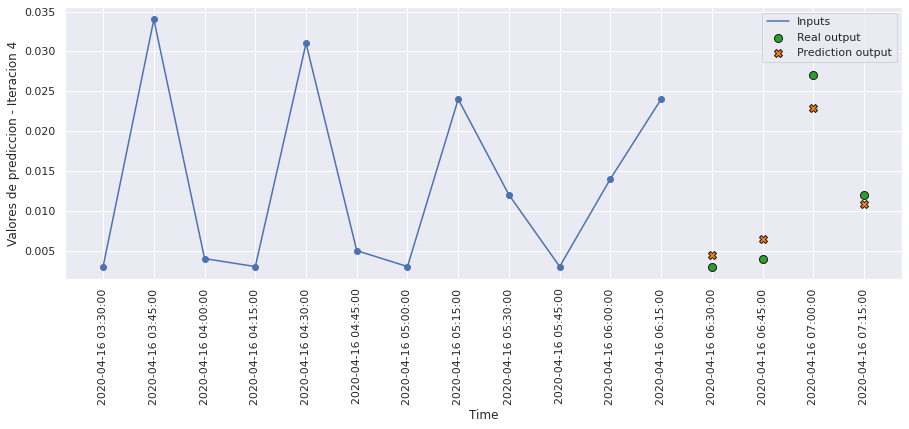

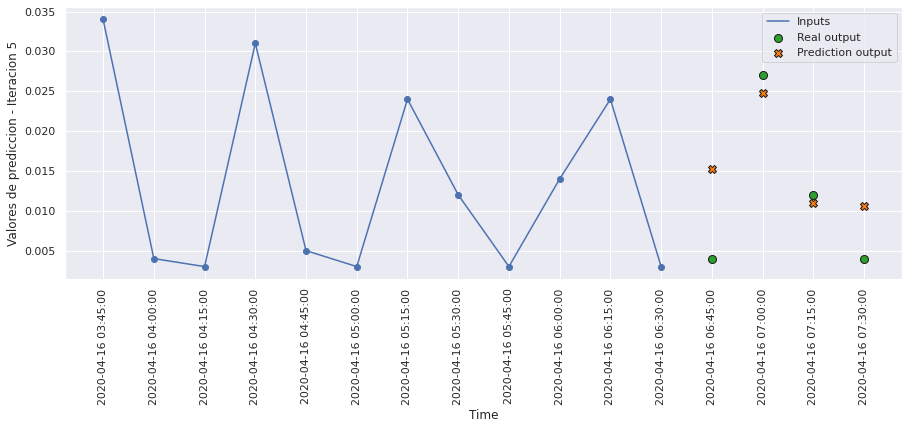

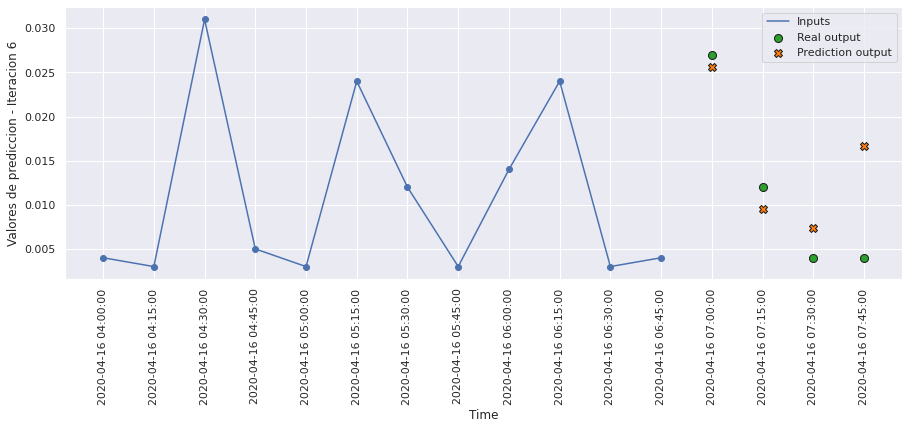

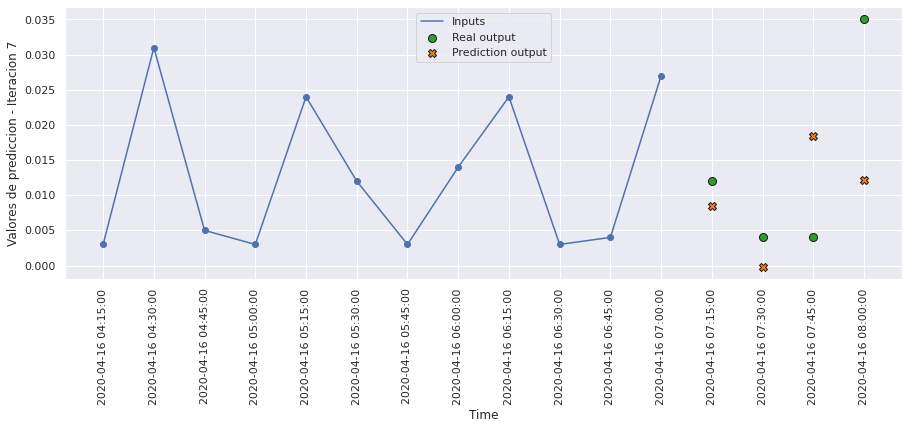

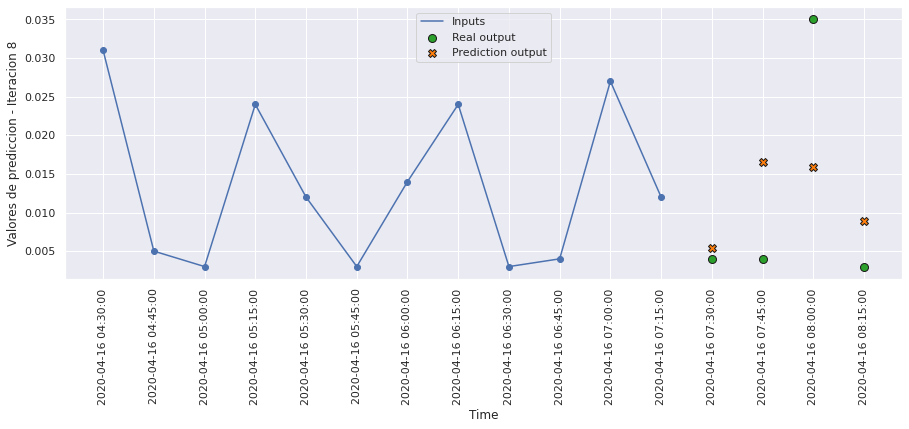

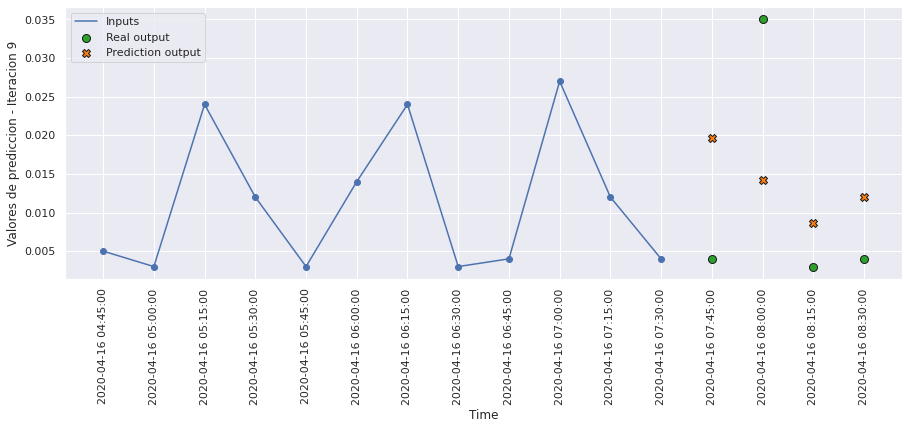

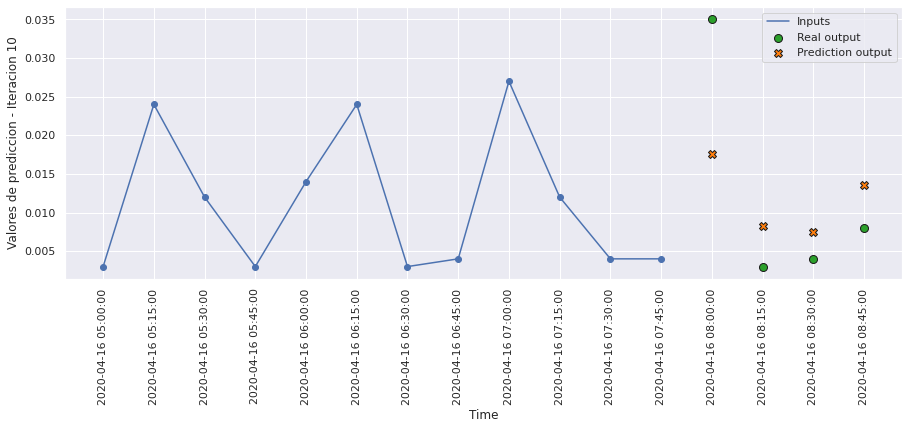

In [134]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict8, 10, 0)

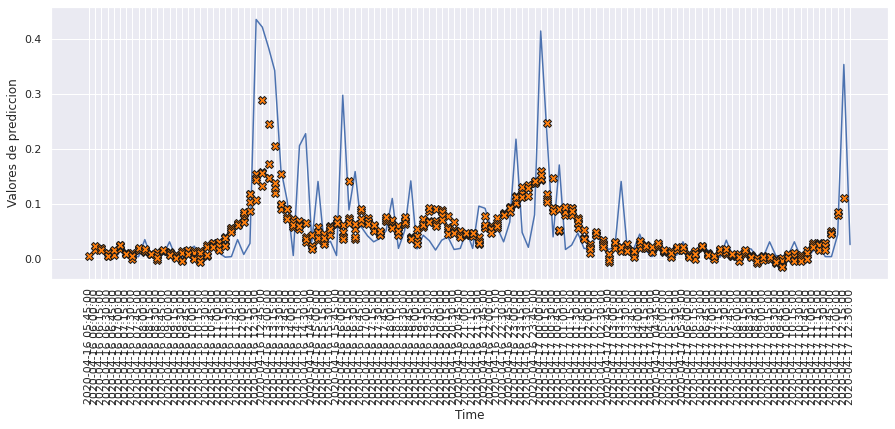

In [135]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 120)

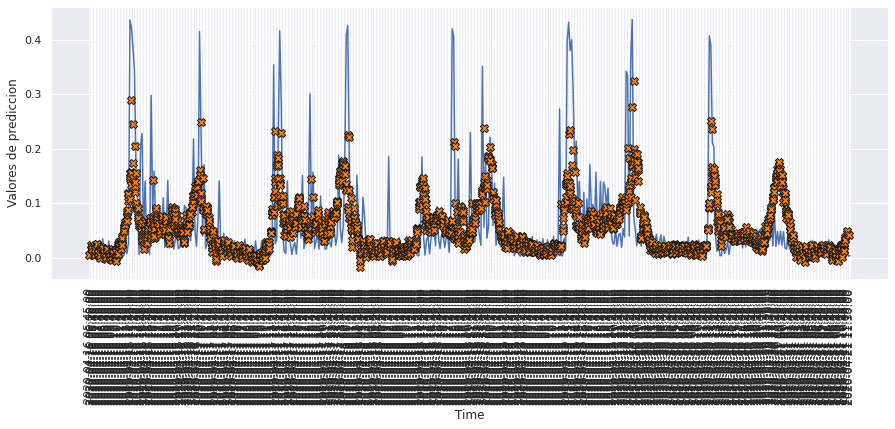

In [136]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict8, 500)

# MODELO 9: LSTM ENCODE DECODE

### Construimos el modelo

In [137]:
def build_model9():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh'),
        tf.keras.layers.RepeatVector(n_predicciones),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(100)),
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1))
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [138]:
model9 = build_model9()
model9.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 128)               69632     
                                                                 
 repeat_vector (RepeatVector  (None, 4, 128)           0         
 )                                                               
                                                                 
 lstm_9 (LSTM)               (None, 4, 128)            131584    
                                                                 
 time_distributed_6 (TimeDis  (None, 4, 100)           12900     
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 4, 1)             101       
 tributed)                                                       
                                                      

### Entrenamiento del modelo

In [139]:
history9 = model9.fit(scaled_trainX, data_trainY_3D_2, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY_3D_2), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.0060 - mae: 0.0466 - mse: 0.0060 - smape: 0.8419 - val_loss: 0.0060 - val_mae: 0.0450 - val_mse: 0.0060 - val_smape: 0.8692
Epoch 2/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0053 - mae: 0.0426 - mse: 0.0053 - smape: 0.7701 - val_loss: 0.0061 - val_mae: 0.0425 - val_mse: 0.0061 - val_smape: 0.8754
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0412 - mse: 0.0050 - smape: 0.7444 - val_loss: 0.0061 - val_mae: 0.0418 - val_mse: 0.0061 - val_smape: 0.7495
Epoch 4/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0409 - mse: 0.0050 - smape: 0.7400 - val_loss: 0.0061 - val_mae: 0.0428 - val_mse: 0.0061 - val_smape: 0.7729
Epoch 5/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0408 - mse: 0.0050 - smape: 0.7396 - val_loss: 0.0060 - val_mae: 0.0430 - val_mse: 0.0060 - val_smap

354/354 [==============================] - 5s 13ms/step - loss: 0.0022 - mae: 0.0275 - mse: 0.0022 - smape: 0.6296 - val_loss: 0.0101 - val_mae: 0.0514 - val_mse: 0.0101 - val_smape: 0.8020
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0022 - mae: 0.0276 - mse: 0.0022 - smape: 0.6284 - val_loss: 0.0108 - val_mae: 0.0538 - val_mse: 0.0108 - val_smape: 0.8501
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0022 - mae: 0.0275 - mse: 0.0022 - smape: 0.6273 - val_loss: 0.0101 - val_mae: 0.0521 - val_mse: 0.0101 - val_smape: 0.8004
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0020 - mae: 0.0268 - mse: 0.0020 - smape: 0.6230 - val_loss: 0.0101 - val_mae: 0.0517 - val_mse: 0.0101 - val_smape: 0.7961
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0021 - mae: 0.0270 - mse: 0.0021 - smape: 0.6243 - val_loss: 0.0100 - val_mae: 0.0514 - val_mse: 0.0100 - val_smape: 0.790

In [140]:
hist9 = pd.DataFrame(history9.history)
hist9['epoch'] = history9.epoch
hist9

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.005987,0.046557,0.005987,0.841921,0.005991,0.045009,0.005991,0.869209,0
1,0.005257,0.042632,0.005257,0.770082,0.006110,0.042524,0.006110,0.875450,1
2,0.005047,0.041245,0.005047,0.744406,0.006103,0.041833,0.006103,0.749514,2
3,0.004989,0.040919,0.004989,0.740045,0.006089,0.042783,0.006089,0.772926,3
4,0.004963,0.040801,0.004963,0.739598,0.006040,0.043003,0.006040,0.915727,4
...,...,...,...,...,...,...,...,...,...
102,0.001601,0.024217,0.001601,0.602909,0.009925,0.051117,0.009925,0.796628,102
103,0.001603,0.024186,0.001603,0.601102,0.010457,0.052818,0.010457,0.807280,103
104,0.001521,0.023753,0.001521,0.597756,0.010666,0.053320,0.010666,0.839940,104
105,0.001531,0.023740,0.001531,0.597782,0.010395,0.052083,0.010395,0.840120,105


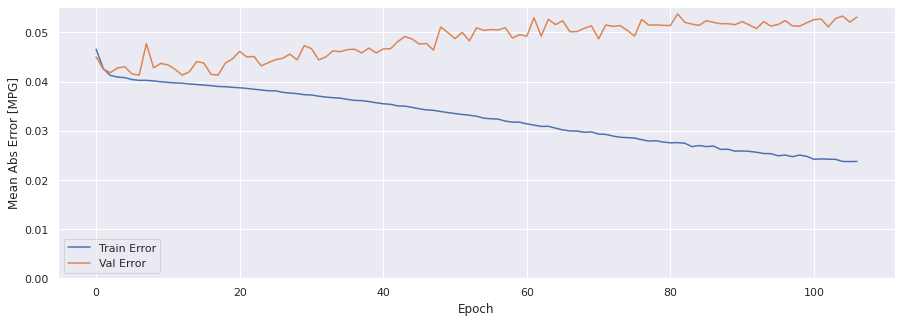

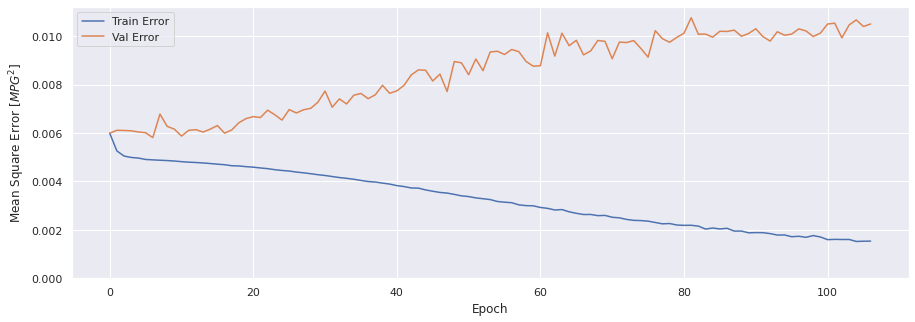

In [141]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history9)

### Evaluar predicciones

In [142]:
score_train9 = model9.evaluate(scaled_trainX, data_trainY_3D_2, verbose=1)
print(f'Loss:{score_train9[0]}')
print(f'MAE:{score_train9[1]}')
print(f'MSE:{score_train9[2]}')
print(f'SMAPE:{score_train9[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 0.0015 - mae: 0.0236 - mse: 0.0015 - smape: 0.5954
Loss:0.0014952004421502352
MAE:0.023550663143396378
MSE:0.0014952004421502352
SMAPE:0.5953637957572937


In [143]:
score_val9 = model9.evaluate(scaled_valX, data_valY_3D_2, verbose=1)
print(f'Loss:{score_val9[0]}')
print(f'MAE:{score_val9[1]}')
print(f'MSE:{score_val9[2]}')
print(f'SMAPE:{score_val9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0105 - mae: 0.0531 - mse: 0.0105 - smape: 0.8156
Loss:0.010499786585569382
MAE:0.05311672389507294
MSE:0.010499786585569382
SMAPE:0.8156152963638306


In [144]:
score_test9 = model9.evaluate(scaled_testX, data_testY_3D_2, verbose=1)
print(f'Loss:{score_test9[0]}')
print(f'MAE:{score_test9[1]}')
print(f'MSE:{score_test9[2]}')
print(f'SMAPE:{score_test9[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0089 - mae: 0.0522 - mse: 0.0089 - smape: 0.8012
Loss:0.008866693824529648
MAE:0.052237506955862045
MSE:0.008866693824529648
SMAPE:0.8012472987174988


### Comparativa de resultados

In [145]:
result = hist9.iloc[-1]
comparativa9 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test9[1], score_test9[2], score_test9[3], math.sqrt(score_test9[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa9.style.set_caption("Método de ventana de varios pasos - LSTM ENCODE DECODE")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.023763,0.001534,0.598587,0.039172
VALIDACION,0.053117,0.010500,0.816415,0.102468
TEST,0.052238,0.008867,0.801247,0.094163


### Obtener predicciones

In [146]:
trainPredict9 = model9.predict(scaled_trainX)
testPredict9 = model9.predict(scaled_testX)

### Visualización de las predicciones

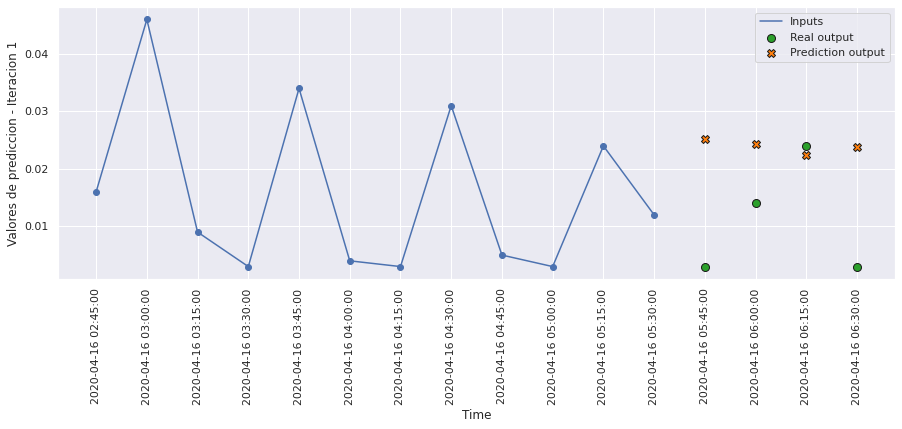

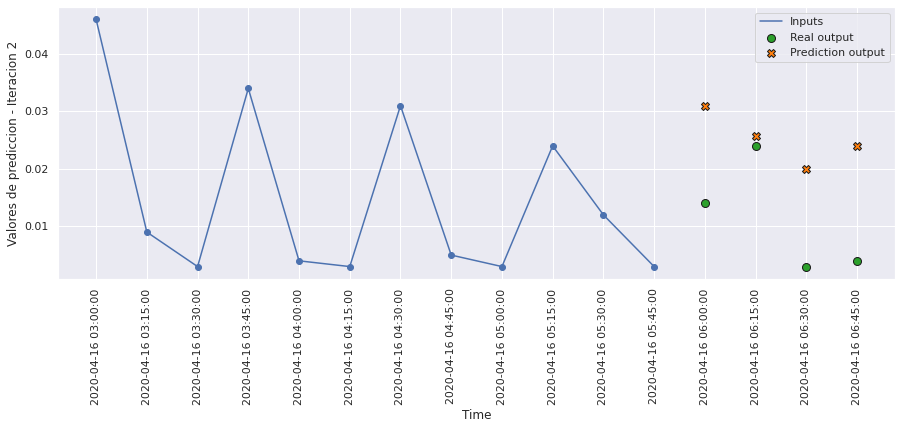

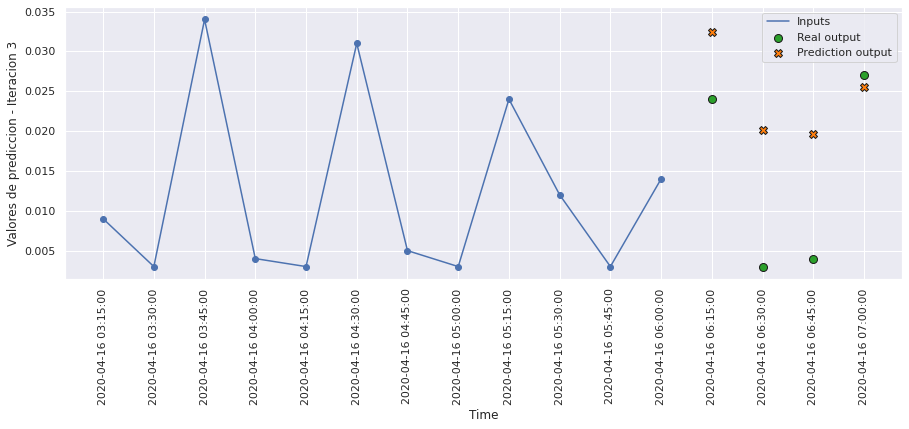

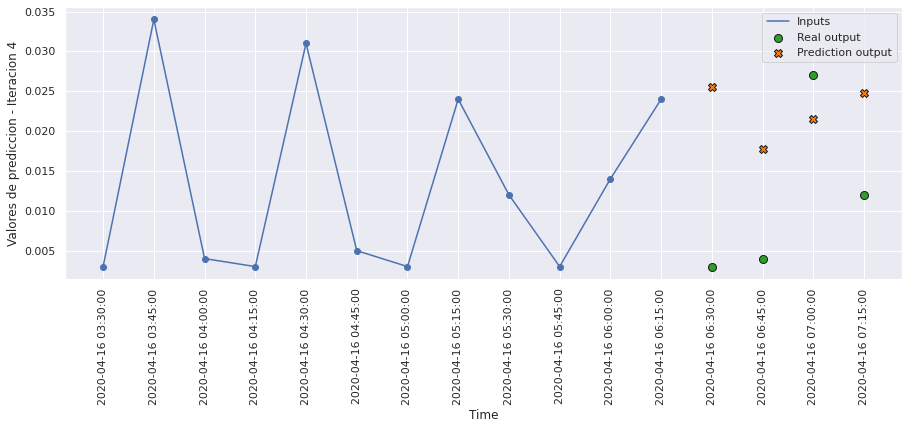

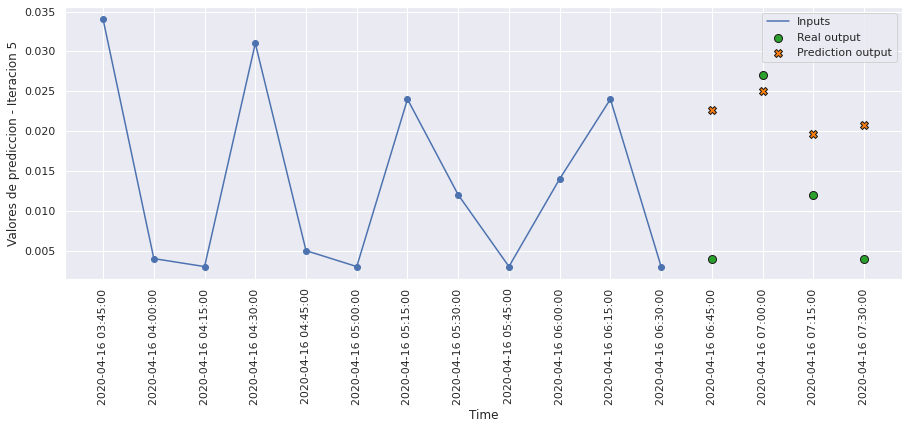

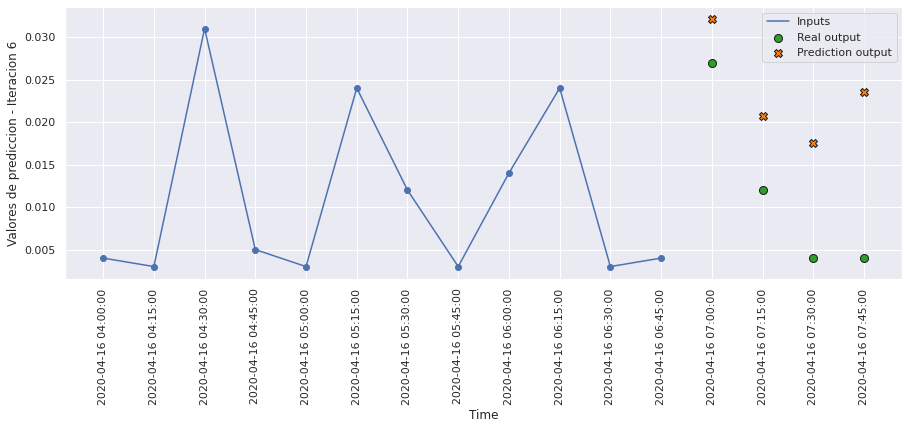

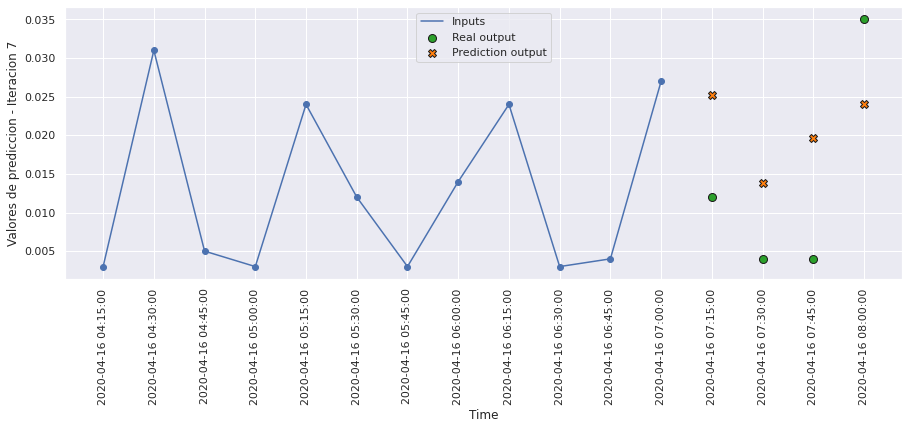

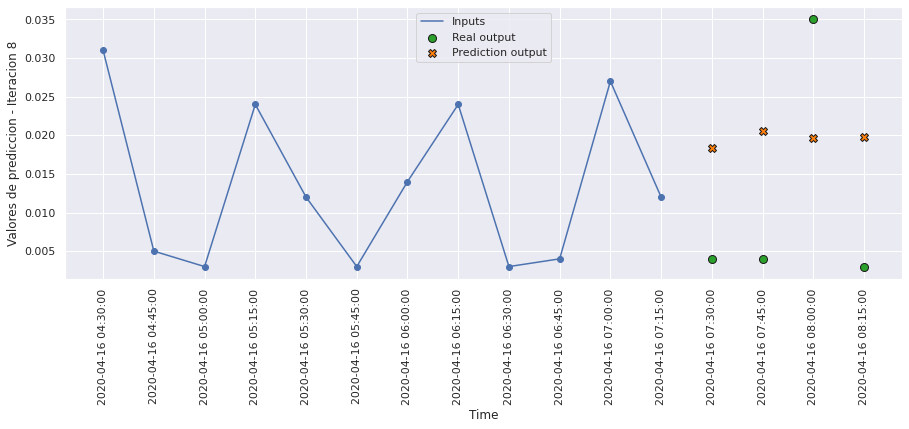

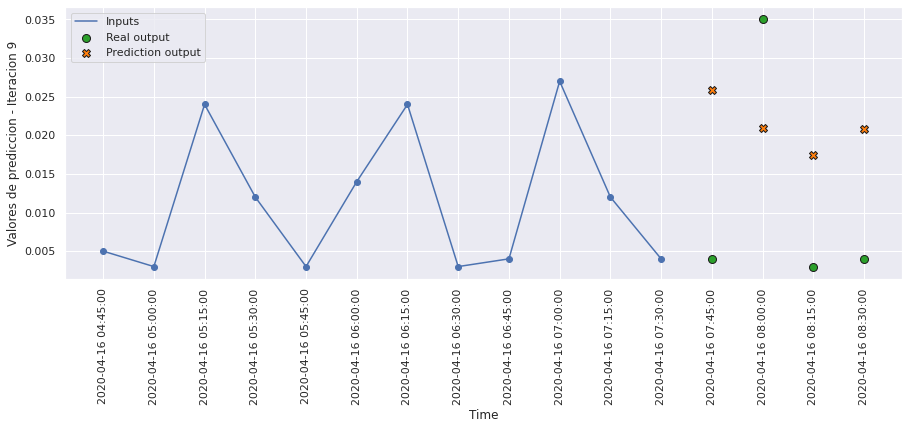

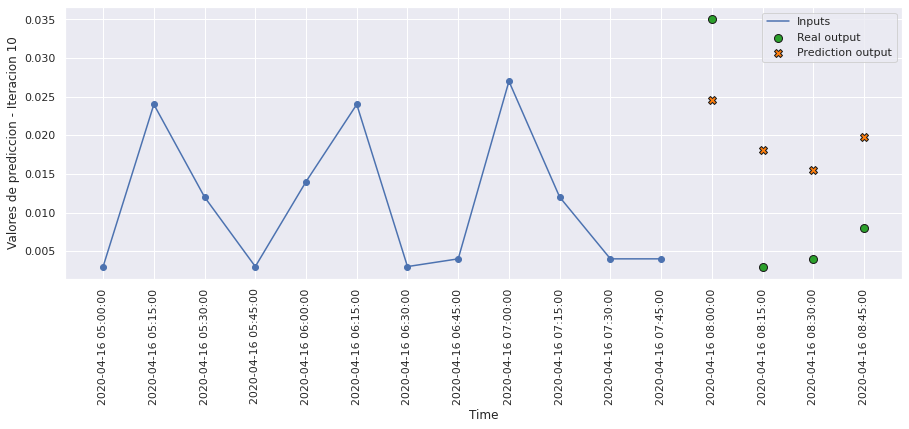

In [147]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 10, 0)

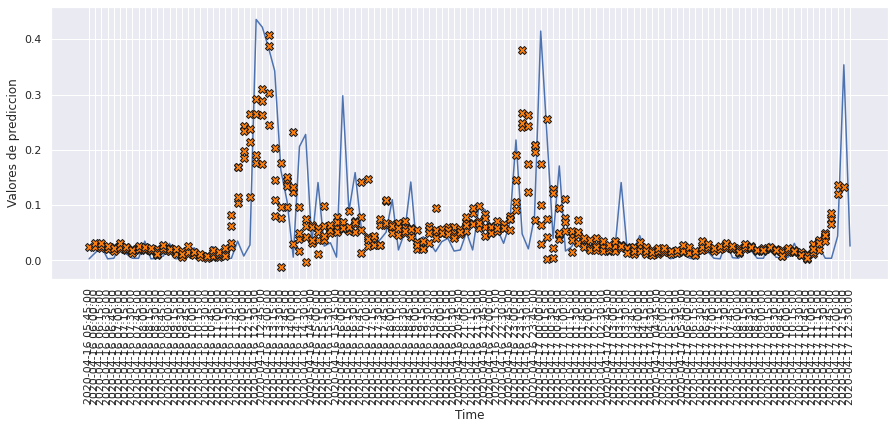

In [148]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 120)

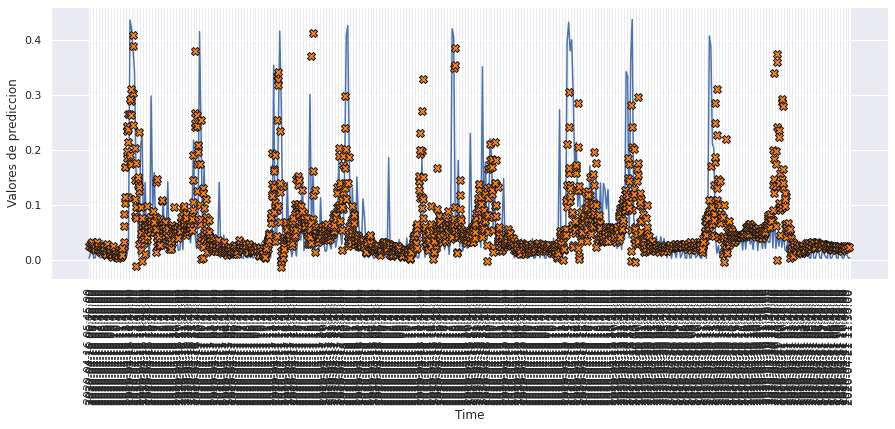

In [149]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_window_predictions_values(int(test_df.iloc[0].name), 
                        testPredict9.reshape(testPredict9.shape[0],n_predicciones), 500)

# MODELO 10: GRU UNA CAPA

### Construimos el modelo

In [150]:
def build_model10():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [151]:
model10 = build_model10()
model10.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 128)               52608     
                                                                 
 dense_10 (Dense)            (None, 4)                 516       
                                                                 
Total params: 53,124
Trainable params: 53,124
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [152]:
history10 = model10.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 5s 10ms/step - loss: 0.0063 - mae: 0.0479 - mse: 0.0063 - smape: 0.8610 - val_loss: 0.0059 - val_mae: 0.0456 - val_mse: 0.0059 - val_smape: 0.9392
Epoch 2/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0057 - mae: 0.0460 - mse: 0.0057 - smape: 0.8561 - val_loss: 0.0058 - val_mae: 0.0453 - val_mse: 0.0058 - val_smape: 0.8405
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0056 - mae: 0.0455 - mse: 0.0056 - smape: 0.8462 - val_loss: 0.0058 - val_mae: 0.0454 - val_mse: 0.0058 - val_smape: 0.9443
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0449 - mse: 0.0055 - smape: 0.8372 - val_loss: 0.0058 - val_mae: 0.0422 - val_mse: 0.0058 - val_smape: 0.8192
Epoch 5/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0053 - mae: 0.0440 - mse: 0.0053 - smape: 0.8209 - val_loss: 0.0061 - val_mae: 0.0479 - val_mse: 0.0061 - val_smape: 0

Epoch 82/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0029 - mae: 0.0325 - mse: 0.0029 - smape: 0.7044 - val_loss: 0.0093 - val_mae: 0.0537 - val_mse: 0.0093 - val_smape: 0.9383
Epoch 83/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0029 - mae: 0.0322 - mse: 0.0029 - smape: 0.7011 - val_loss: 0.0093 - val_mae: 0.0535 - val_mse: 0.0093 - val_smape: 0.8669
Epoch 84/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0029 - mae: 0.0321 - mse: 0.0029 - smape: 0.7017 - val_loss: 0.0094 - val_mae: 0.0553 - val_mse: 0.0094 - val_smape: 0.9714
Epoch 85/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0028 - mae: 0.0320 - mse: 0.0028 - smape: 0.7038 - val_loss: 0.0092 - val_mae: 0.0528 - val_mse: 0.0092 - val_smape: 0.9275
Epoch 86/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0028 - mae: 0.0318 - mse: 0.0028 - smape: 0.7009 - val_loss: 0.0092 - val_mae: 0.0534 - val_mse: 0.0092 - val_smap

In [153]:
hist10 = pd.DataFrame(history10.history)
hist10['epoch'] = history10.epoch
hist10

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006255,0.047870,0.006255,0.860954,0.005897,0.045634,0.005897,0.939176,0
1,0.005705,0.045959,0.005705,0.856095,0.005829,0.045348,0.005829,0.840510,1
2,0.005636,0.045510,0.005636,0.846159,0.005804,0.045370,0.005804,0.944314,2
3,0.005511,0.044935,0.005511,0.837162,0.005764,0.042155,0.005764,0.819214,3
4,0.005331,0.043997,0.005331,0.820881,0.006141,0.047878,0.006141,0.902278,4
...,...,...,...,...,...,...,...,...,...
99,0.002365,0.029840,0.002365,0.695874,0.010410,0.056750,0.010410,0.961393,99
100,0.002325,0.029667,0.002325,0.692897,0.009620,0.055066,0.009620,0.962699,100
101,0.002306,0.029566,0.002306,0.692599,0.009369,0.053271,0.009369,0.924030,101
102,0.002277,0.029427,0.002277,0.691228,0.009740,0.054775,0.009740,0.938003,102


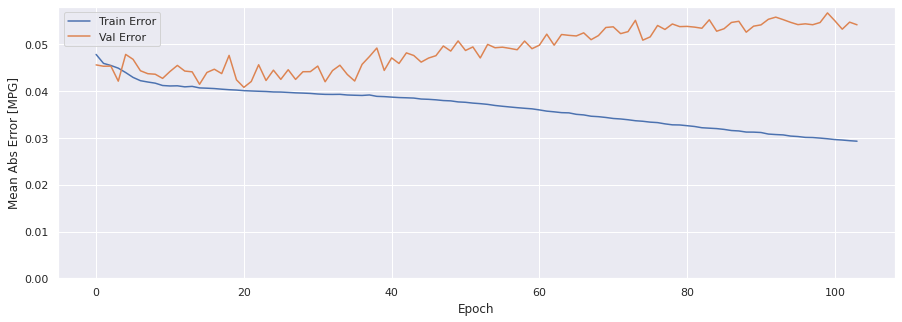

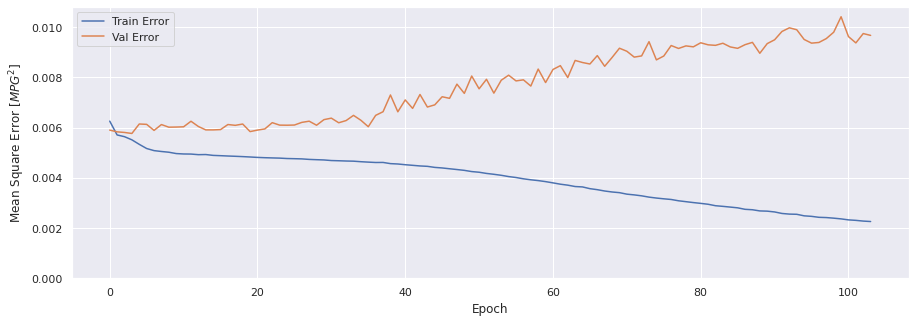

In [154]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history10)

### Evaluar predicciones

In [155]:
score_train10 = model10.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train10[0]}')
print(f'MAE:{score_train10[1]}')
print(f'MSE:{score_train10[2]}')
print(f'SMAPE:{score_train10[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0022 - mae: 0.0287 - mse: 0.0022 - smape: 0.6826
Loss:0.0021508438512682915
MAE:0.02870924398303032
MSE:0.0021508438512682915
SMAPE:0.6825740933418274


In [156]:
score_val10 = model10.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val10[0]}')
print(f'MAE:{score_val10[1]}')
print(f'MSE:{score_val10[2]}')
print(f'SMAPE:{score_val10[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0097 - mae: 0.0542 - mse: 0.0097 - smape: 0.9220
Loss:0.009667200036346912
MAE:0.05420909449458122
MSE:0.009667200036346912
SMAPE:0.9220153093338013


In [157]:
score_test10 = model10.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test10[0]}')
print(f'MAE:{score_test10[1]}')
print(f'MSE:{score_test10[2]}')
print(f'SMAPE:{score_test10[3]}')

303/303 [==============================] - 1s 5ms/step - loss: 0.0090 - mae: 0.0555 - mse: 0.0090 - smape: 0.8845
Loss:0.008983219042420387
MAE:0.05547312647104263
MSE:0.008983219042420387
SMAPE:0.8844852447509766


### Comparativa de resultados

In [158]:
result = hist10.iloc[-1]
comparativa10 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test10[1], score_test10[2], score_test10[3], math.sqrt(score_test10[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa10.style.set_caption("Método de ventana de varios pasos - GRU una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.029318,0.002260,0.690710,0.047536
VALIDACION,0.054209,0.009667,0.922483,0.098322
TEST,0.055473,0.008983,0.884485,0.094780


### Obtener predicciones

In [159]:
trainPredict10 = model10.predict(scaled_trainX)
testPredict10 = model10.predict(scaled_testX)

### Visualización de las predicciones

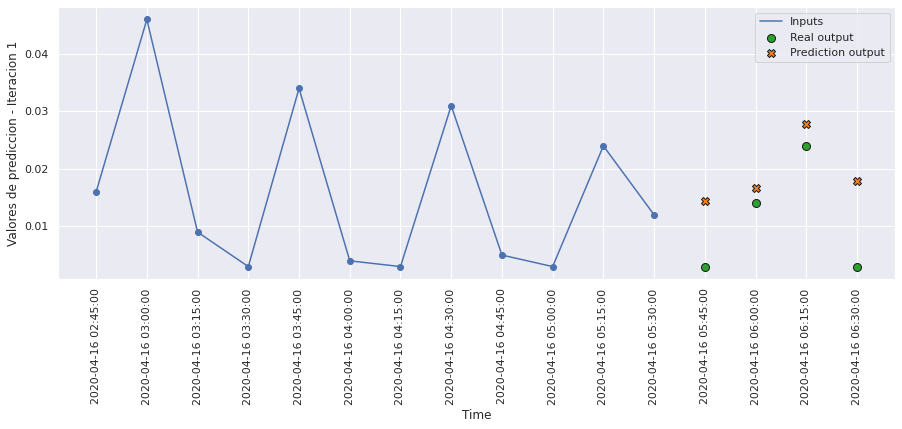

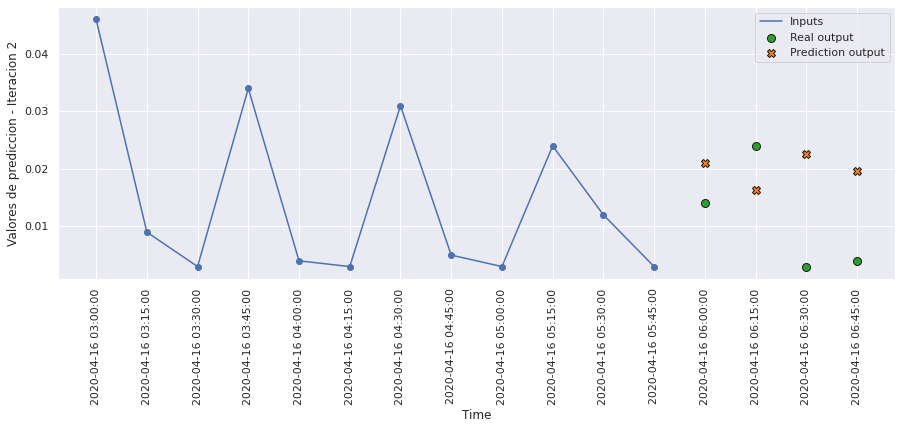

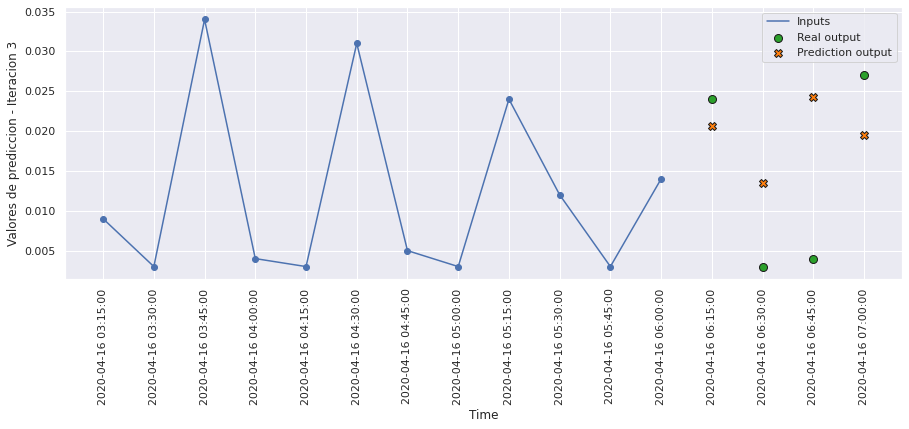

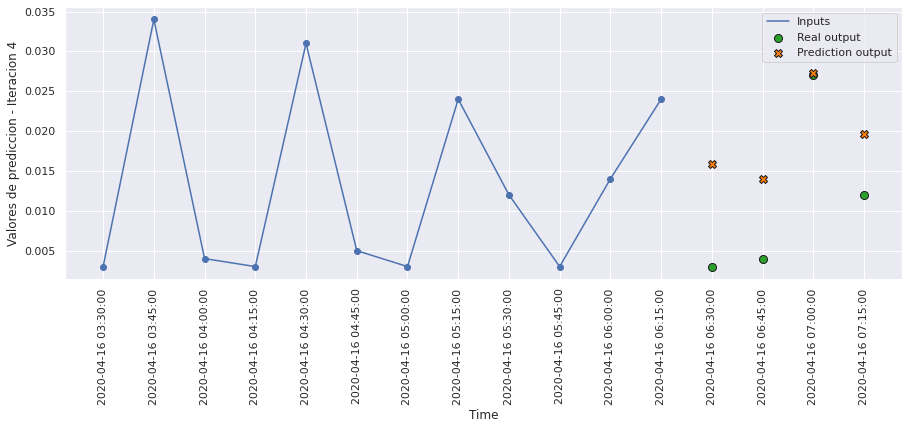

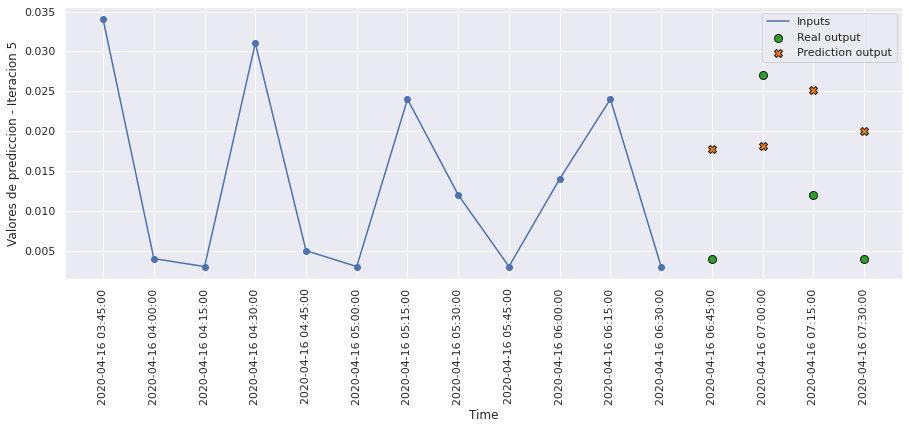

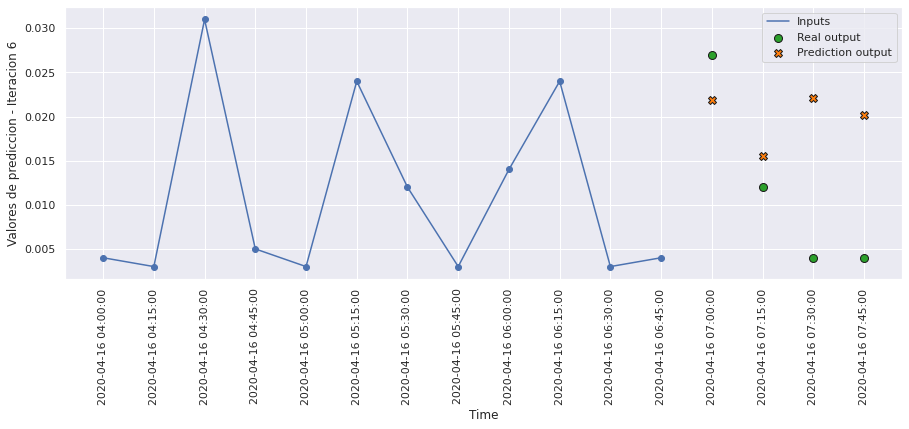

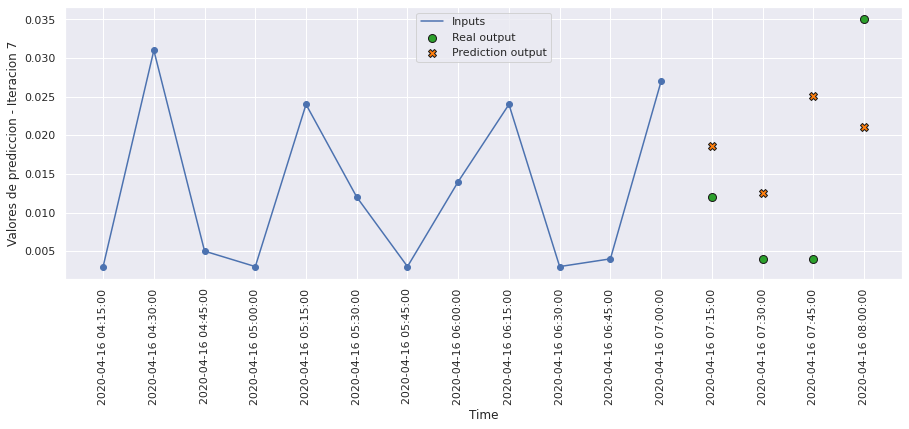

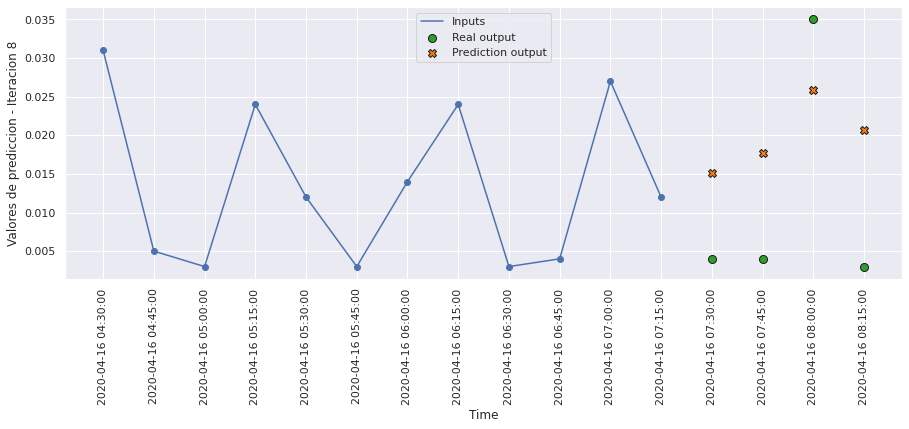

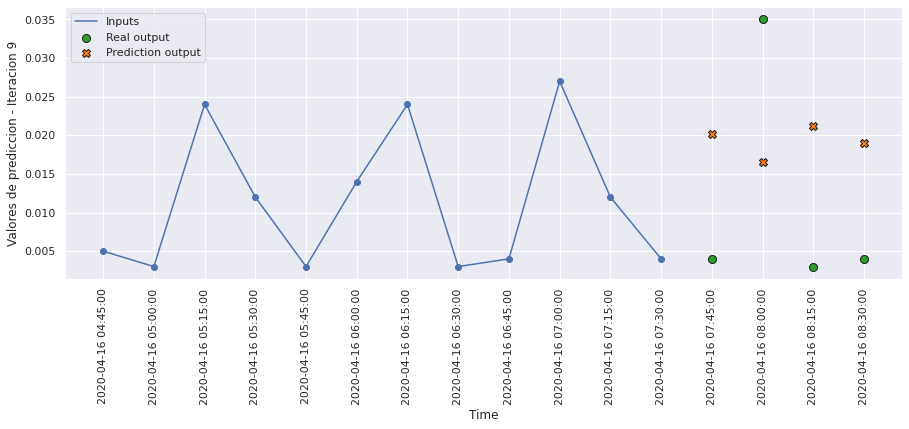

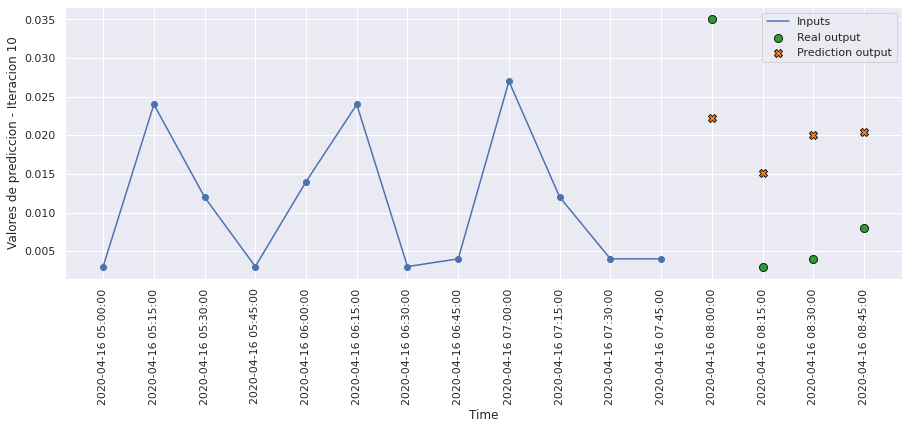

In [160]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict10, 10, 0)

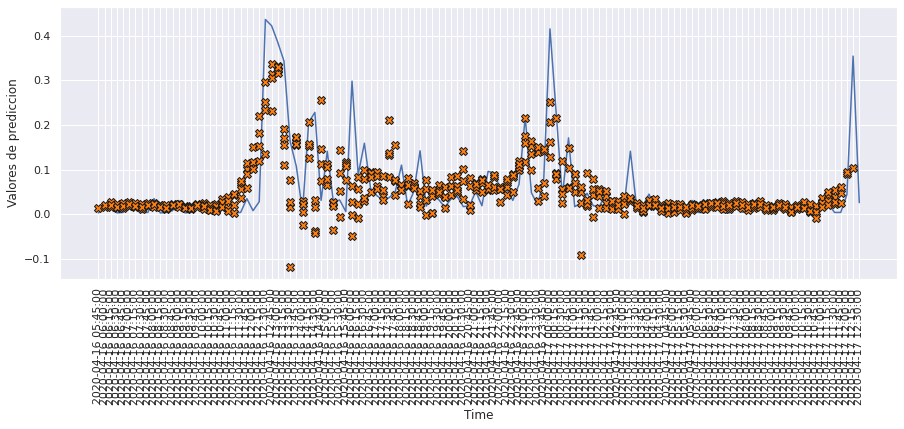

In [161]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 120)

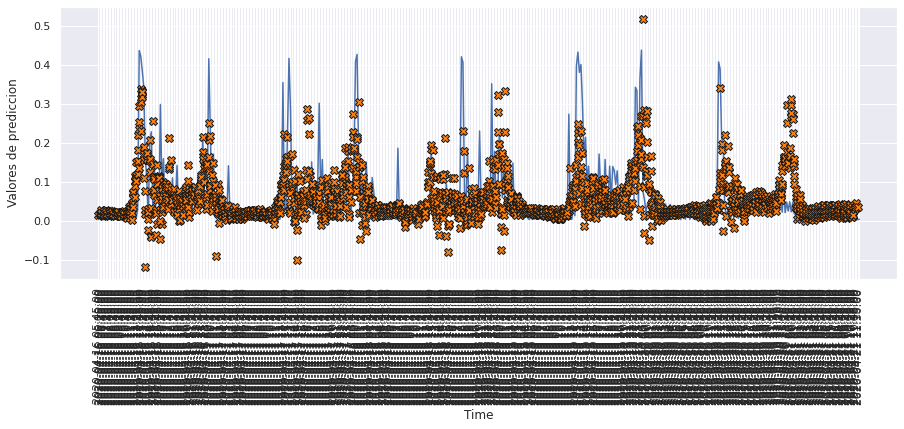

In [162]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict10, 500)

# MODELO 11: GRU DOS CAPAS

### Construimos el modelo

In [163]:
def build_model11():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.GRU(128, activation='tanh', return_sequences=True),
        tf.keras.layers.GRU(128, activation='tanh'),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [164]:
model11 = build_model11()
model11.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_1 (GRU)                 (None, 12, 128)           52608     
                                                                 
 gru_2 (GRU)                 (None, 128)               99072     
                                                                 
 dense_11 (Dense)            (None, 4)                 516       
                                                                 
Total params: 152,196
Trainable params: 152,196
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [165]:
history11 = model11.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 14ms/step - loss: 0.0062 - mae: 0.0481 - mse: 0.0062 - smape: 0.8758 - val_loss: 0.0059 - val_mae: 0.0430 - val_mse: 0.0059 - val_smape: 0.8349
Epoch 2/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0057 - mae: 0.0456 - mse: 0.0057 - smape: 0.8465 - val_loss: 0.0059 - val_mae: 0.0411 - val_mse: 0.0059 - val_smape: 0.8477
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0055 - mae: 0.0447 - mse: 0.0055 - smape: 0.8302 - val_loss: 0.0058 - val_mae: 0.0479 - val_mse: 0.0058 - val_smape: 0.9371
Epoch 4/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0053 - mae: 0.0437 - mse: 0.0053 - smape: 0.8120 - val_loss: 0.0059 - val_mae: 0.0447 - val_mse: 0.0059 - val_smape: 0.8563
Epoch 5/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0051 - mae: 0.0422 - mse: 0.0051 - smape: 0.7799 - val_loss: 0.0062 - val_mae: 0.0493 - val_mse: 0.0062 - val_smap

354/354 [==============================] - 5s 13ms/step - loss: 9.3722e-04 - mae: 0.0202 - mse: 9.3722e-04 - smape: 0.6055 - val_loss: 0.0092 - val_mae: 0.0516 - val_mse: 0.0092 - val_smape: 0.8996
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 9.5585e-04 - mae: 0.0204 - mse: 9.5585e-04 - smape: 0.6075 - val_loss: 0.0094 - val_mae: 0.0527 - val_mse: 0.0094 - val_smape: 0.8916
Epoch 83/200
354/354 [==============================] - 5s 13ms/step - loss: 8.9137e-04 - mae: 0.0198 - mse: 8.9137e-04 - smape: 0.6015 - val_loss: 0.0092 - val_mae: 0.0521 - val_mse: 0.0092 - val_smape: 0.9051
Epoch 84/200
354/354 [==============================] - 5s 13ms/step - loss: 8.7356e-04 - mae: 0.0196 - mse: 8.7356e-04 - smape: 0.5987 - val_loss: 0.0092 - val_mae: 0.0518 - val_mse: 0.0092 - val_smape: 0.8987
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 8.6179e-04 - mae: 0.0195 - mse: 8.6179e-04 - smape: 0.5986 - val_loss: 0.0091 - val_mae: 0.0

In [166]:
hist11 = pd.DataFrame(history11.history)
hist11['epoch'] = history11.epoch
hist11

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006200,0.048098,0.006200,0.875847,0.005854,0.042956,0.005854,0.834925,0
1,0.005673,0.045583,0.005673,0.846527,0.005885,0.041119,0.005885,0.847666,1
2,0.005487,0.044705,0.005487,0.830239,0.005842,0.047918,0.005842,0.937079,2
3,0.005293,0.043658,0.005293,0.811963,0.005871,0.044713,0.005871,0.856261,3
4,0.005102,0.042226,0.005102,0.779876,0.006240,0.049280,0.006240,0.843548,4
...,...,...,...,...,...,...,...,...,...
98,0.000672,0.017540,0.000672,0.571625,0.009470,0.052621,0.009470,0.939331,98
99,0.000673,0.017578,0.000673,0.572877,0.009214,0.051604,0.009214,0.904120,99
100,0.000657,0.017445,0.000657,0.569770,0.009339,0.052385,0.009339,0.898628,100
101,0.000644,0.017254,0.000644,0.568179,0.009199,0.051533,0.009199,0.903957,101


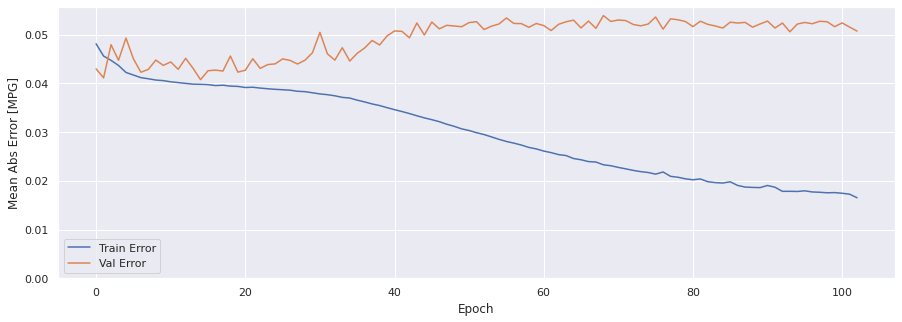

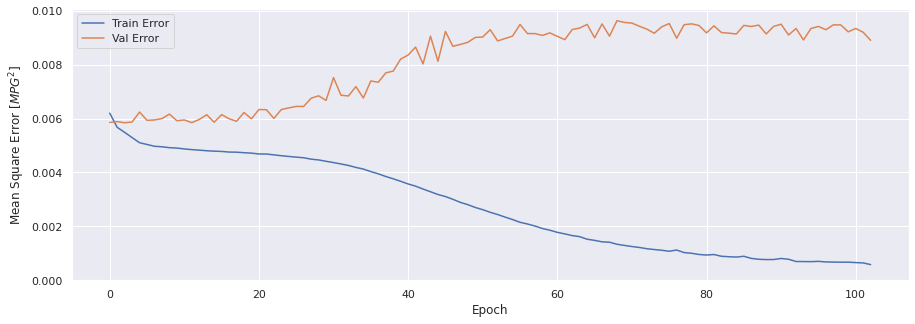

In [167]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [168]:
score_train11 = model11.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train11[0]}')
print(f'MAE:{score_train11[1]}')
print(f'MSE:{score_train11[2]}')
print(f'SMAPE:{score_train11[3]}')

1413/1413 [==============================] - 9s 6ms/step - loss: 5.8984e-04 - mae: 0.0166 - mse: 5.8984e-04 - smape: 0.5524
Loss:0.0005898424424231052
MAE:0.01655193604528904
MSE:0.0005898424424231052
SMAPE:0.5524201393127441


In [169]:
score_val11 = model11.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val11[0]}')
print(f'MAE:{score_val11[1]}')
print(f'MSE:{score_val11[2]}')
print(f'SMAPE:{score_val11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0089 - mae: 0.0507 - mse: 0.0089 - smape: 0.8704
Loss:0.008899210020899773
MAE:0.05071178451180458
MSE:0.008899210020899773
SMAPE:0.870367169380188


In [170]:
score_test11 = model11.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test11[0]}')
print(f'MAE:{score_test11[1]}')
print(f'MSE:{score_test11[2]}')
print(f'SMAPE:{score_test11[3]}')

303/303 [==============================] - 2s 6ms/step - loss: 0.0084 - mae: 0.0537 - mse: 0.0084 - smape: 0.8943
Loss:0.008428791537880898
MAE:0.05367517098784447
MSE:0.008428791537880898
SMAPE:0.894317626953125


### Comparativa de resultados

In [171]:
result = hist11.iloc[-1]
comparativa11 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test11[1], score_test11[2], score_test11[3], math.sqrt(score_test11[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa11.style.set_caption("Método de ventana de varios pasos - GRU dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.016526,0.000583,0.556455,0.024145
VALIDACION,0.050712,0.008899,0.871069,0.094336
TEST,0.053675,0.008429,0.894318,0.091808


### Obtener predicciones

In [172]:
trainPredict11 = model11.predict(scaled_trainX)
testPredict11 = model11.predict(scaled_testX)

### Visualización de las predicciones

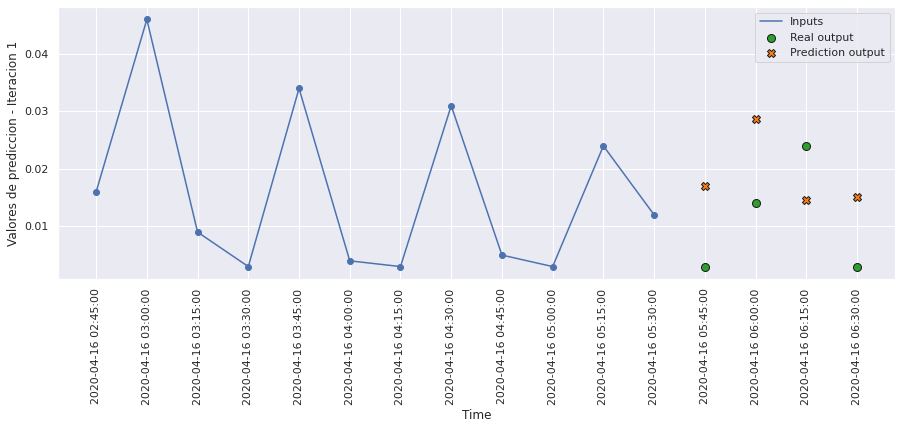

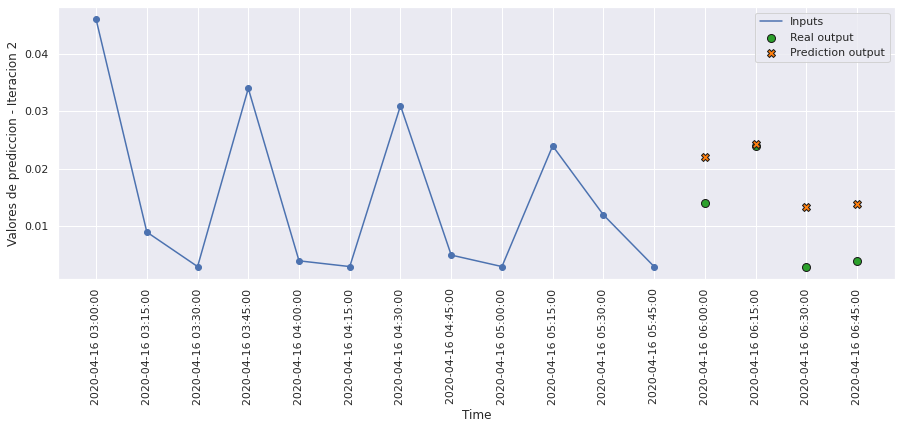

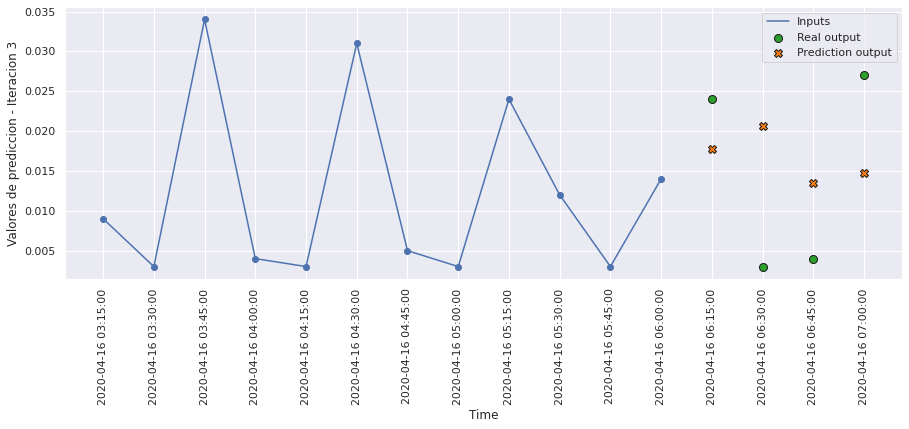

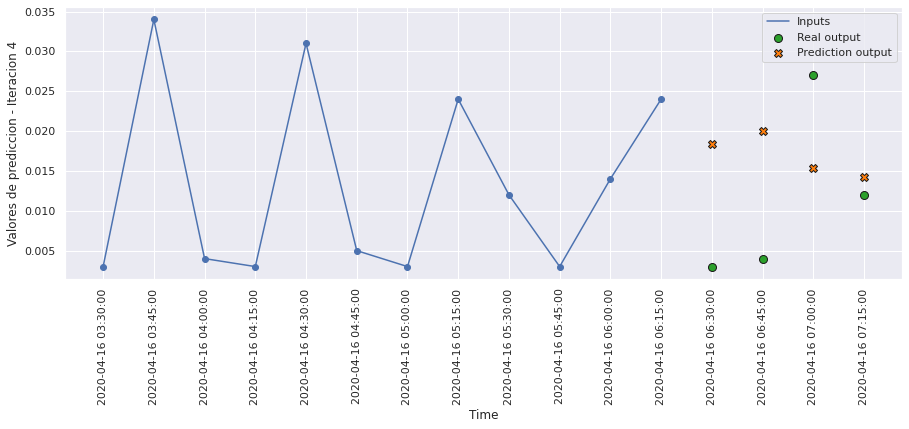

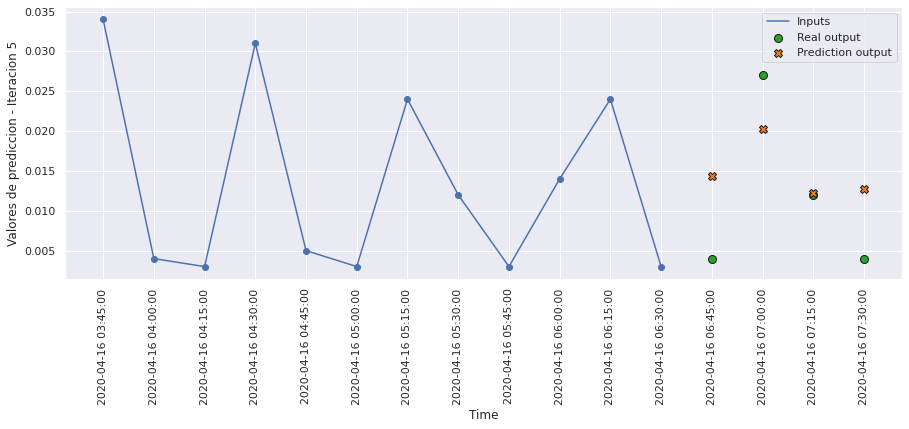

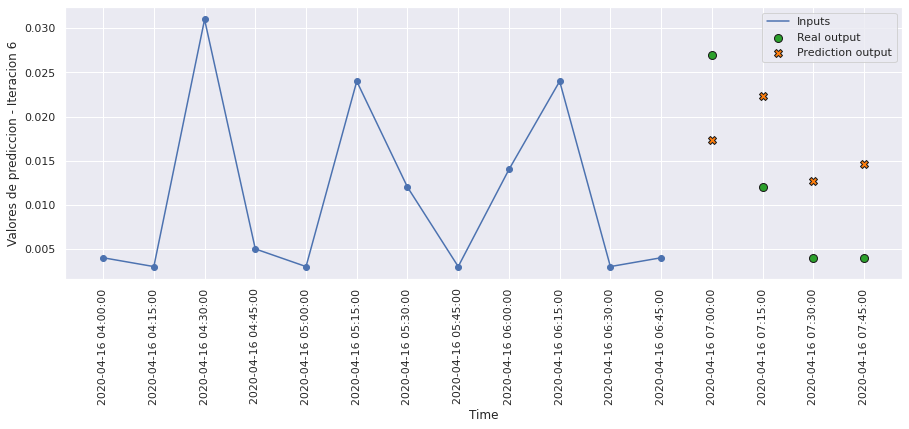

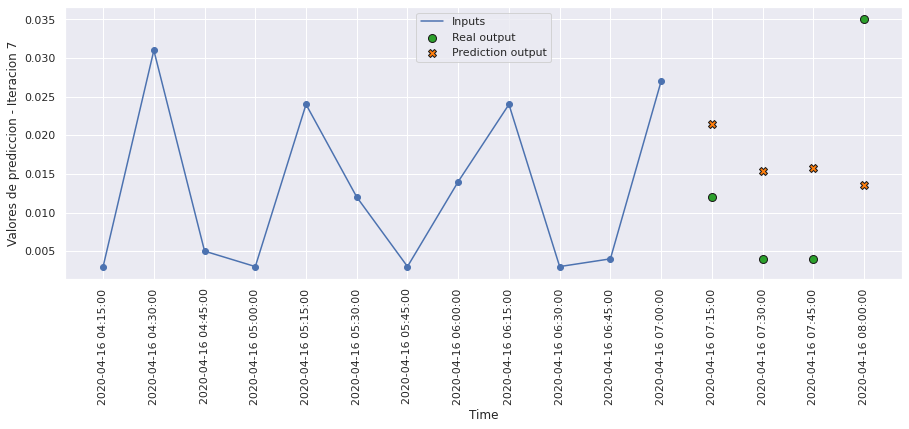

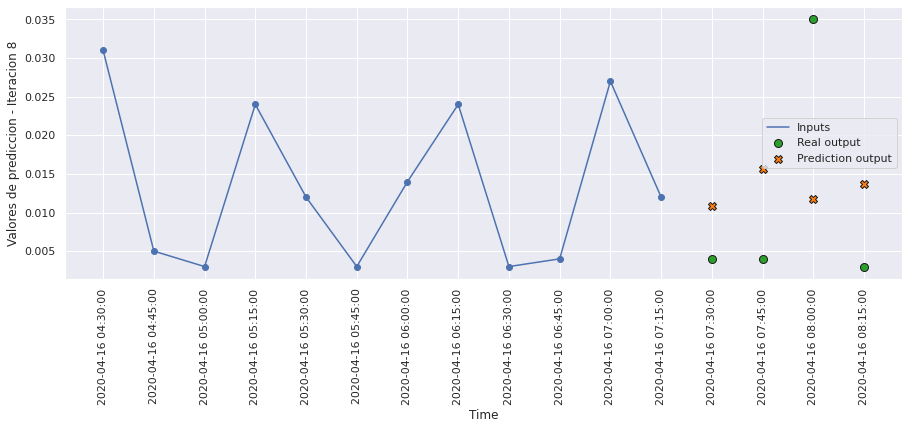

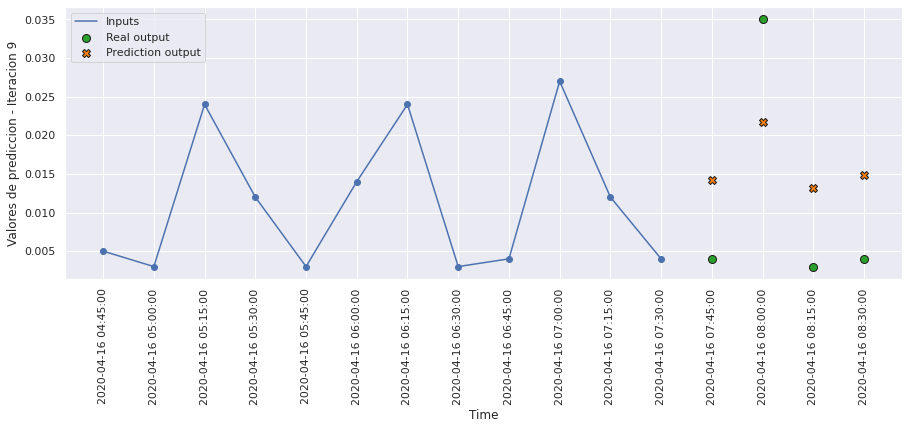

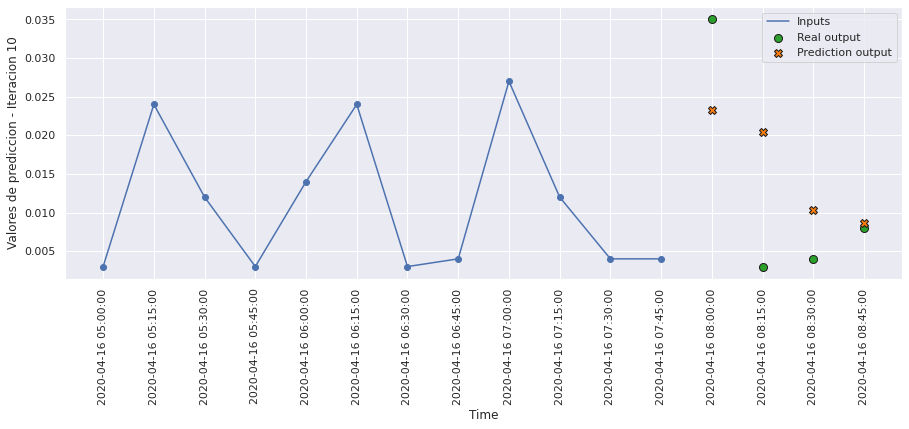

In [173]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict11, 10, 0)

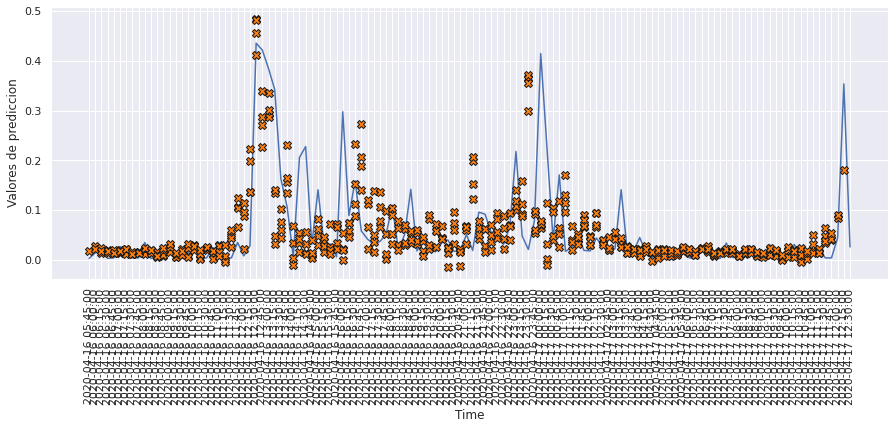

In [174]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 120)

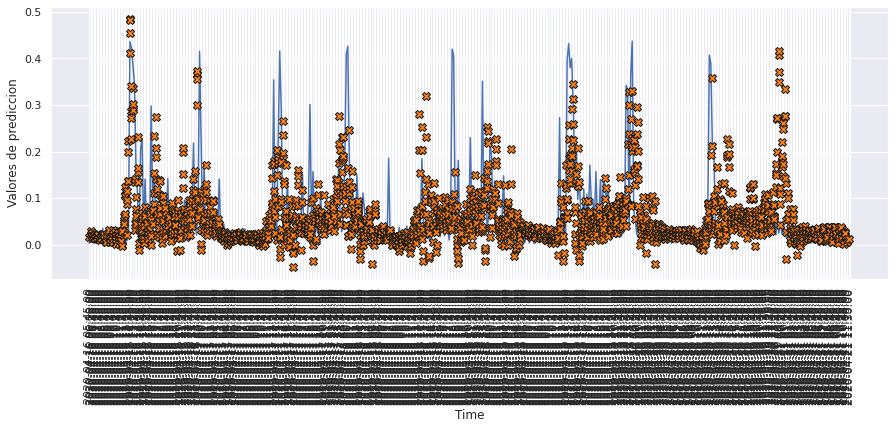

In [175]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict11, 500)

# MODELO 12: LSTM UNRESTRICTED UNA CAPA

### Construimos el modelo

In [176]:
def build_model12():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [177]:
model12 = build_model12()
model12.summary()

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 12, 128)           69632     
                                                                 
 flatten_4 (Flatten)         (None, 1536)              0         
                                                                 
 dense_12 (Dense)            (None, 4)                 6148      
                                                                 
Total params: 75,780
Trainable params: 75,780
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [178]:
history12 = model12.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 5s 10ms/step - loss: 0.0063 - mae: 0.0489 - mse: 0.0063 - smape: 0.8978 - val_loss: 0.0064 - val_mae: 0.0496 - val_mse: 0.0064 - val_smape: 0.9251
Epoch 2/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0058 - mae: 0.0464 - mse: 0.0058 - smape: 0.8594 - val_loss: 0.0061 - val_mae: 0.0423 - val_mse: 0.0061 - val_smape: 0.9098
Epoch 3/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0056 - mae: 0.0449 - mse: 0.0056 - smape: 0.8300 - val_loss: 0.0062 - val_mae: 0.0504 - val_mse: 0.0062 - val_smape: 0.9668
Epoch 4/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0055 - mae: 0.0443 - mse: 0.0055 - smape: 0.8178 - val_loss: 0.0058 - val_mae: 0.0442 - val_mse: 0.0058 - val_smape: 0.8295
Epoch 5/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0053 - mae: 0.0433 - mse: 0.0053 - smape: 0.8006 - val_loss: 0.0060 - val_mae: 0.0432 - val_mse: 0.0060 - val_smape: 0

Epoch 82/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0042 - mae: 0.0377 - mse: 0.0042 - smape: 0.7164 - val_loss: 0.0076 - val_mae: 0.0490 - val_mse: 0.0076 - val_smape: 0.8453
Epoch 83/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0042 - mae: 0.0376 - mse: 0.0042 - smape: 0.7188 - val_loss: 0.0077 - val_mae: 0.0472 - val_mse: 0.0077 - val_smape: 0.8237
Epoch 84/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0042 - mae: 0.0375 - mse: 0.0042 - smape: 0.7146 - val_loss: 0.0078 - val_mae: 0.0475 - val_mse: 0.0078 - val_smape: 0.7928
Epoch 85/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0042 - mae: 0.0374 - mse: 0.0042 - smape: 0.7147 - val_loss: 0.0074 - val_mae: 0.0478 - val_mse: 0.0074 - val_smape: 0.8411
Epoch 86/200
354/354 [==============================] - 3s 9ms/step - loss: 0.0042 - mae: 0.0375 - mse: 0.0042 - smape: 0.7178 - val_loss: 0.0078 - val_mae: 0.0486 - val_mse: 0.0078 - val_smap

In [179]:
hist12 = pd.DataFrame(history12.history)
hist12['epoch'] = history12.epoch
hist12

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006297,0.048941,0.006297,0.897778,0.006428,0.049605,0.006428,0.925076,0
1,0.005805,0.046363,0.005805,0.859402,0.006090,0.042254,0.006090,0.909772,1
2,0.005562,0.044892,0.005562,0.829999,0.006171,0.050402,0.006171,0.966827,2
3,0.005458,0.044269,0.005458,0.817776,0.005784,0.044156,0.005784,0.829478,3
4,0.005272,0.043266,0.005272,0.800635,0.005967,0.043216,0.005967,0.776132,4
...,...,...,...,...,...,...,...,...,...
105,0.003822,0.036085,0.003822,0.714265,0.008855,0.052564,0.008855,0.911931,105
106,0.003821,0.036095,0.003821,0.713470,0.008576,0.049966,0.008576,0.852074,106
107,0.003817,0.036097,0.003817,0.716620,0.009224,0.052307,0.009224,0.862966,107
108,0.003771,0.035827,0.003771,0.710651,0.008677,0.050652,0.008677,0.897271,108


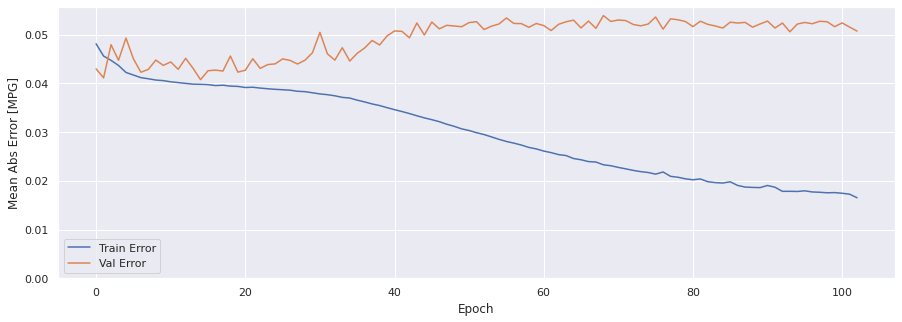

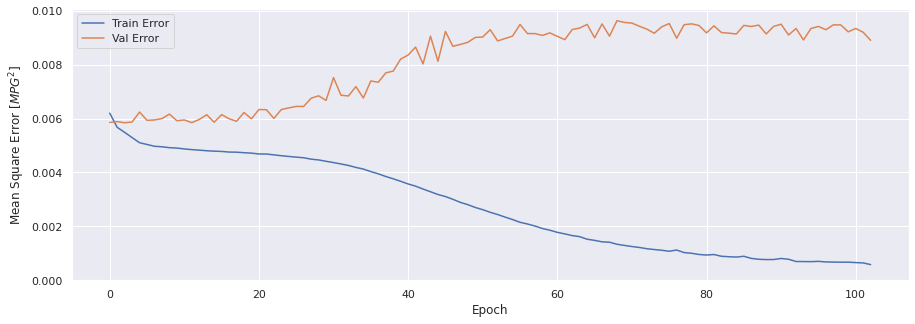

In [180]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history11)

### Evaluar predicciones

In [181]:
score_train12 = model12.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train12[0]}')
print(f'MAE:{score_train12[1]}')
print(f'MSE:{score_train12[2]}')
print(f'SMAPE:{score_train12[3]}')

1413/1413 [==============================] - 7s 5ms/step - loss: 0.0037 - mae: 0.0367 - mse: 0.0037 - smape: 0.7182
Loss:0.003685237606987357
MAE:0.03668798506259918
MSE:0.003685237606987357
SMAPE:0.7181779742240906


In [182]:
score_val12 = model12.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val12[0]}')
print(f'MAE:{score_val12[1]}')
print(f'MSE:{score_val12[2]}')
print(f'SMAPE:{score_val12[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0086 - mae: 0.0517 - mse: 0.0086 - smape: 0.8594
Loss:0.008643409237265587
MAE:0.05171146243810654
MSE:0.008643409237265587
SMAPE:0.8594353199005127


In [183]:
score_test12 = model12.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test12[0]}')
print(f'MAE:{score_test12[1]}')
print(f'MSE:{score_test12[2]}')
print(f'SMAPE:{score_test12[3]}')

303/303 [==============================] - 2s 5ms/step - loss: 0.0079 - mae: 0.0531 - mse: 0.0079 - smape: 0.8367
Loss:0.00791989080607891
MAE:0.05314670130610466
MSE:0.00791989080607891
SMAPE:0.836711049079895


### Comparativa de resultados

In [184]:
result = hist12.iloc[-1]
comparativa12 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test12[1], score_test12[2], score_test12[3], math.sqrt(score_test12[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa12.style.set_caption("Método de ventana de varios pasos - LSTM UNRESTRICTED una capa")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.035871,0.003757,0.715204,0.061291
VALIDACION,0.051711,0.008643,0.860497,0.092970
TEST,0.053147,0.007920,0.836711,0.088994


### Obtener predicciones

In [185]:
trainPredict12 = model12.predict(scaled_trainX)
testPredict12 = model12.predict(scaled_testX)

### Visualización de las predicciones

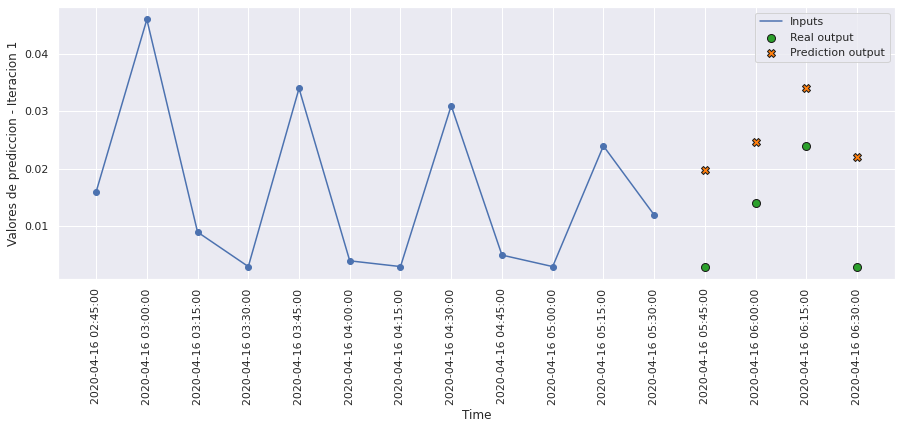

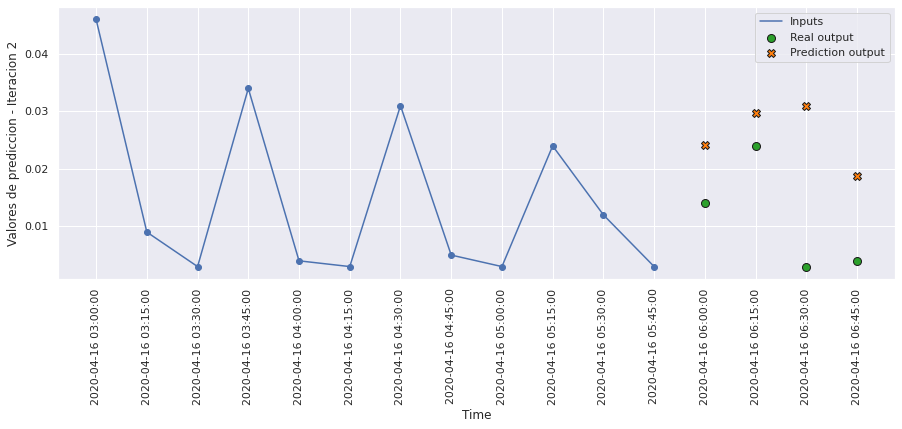

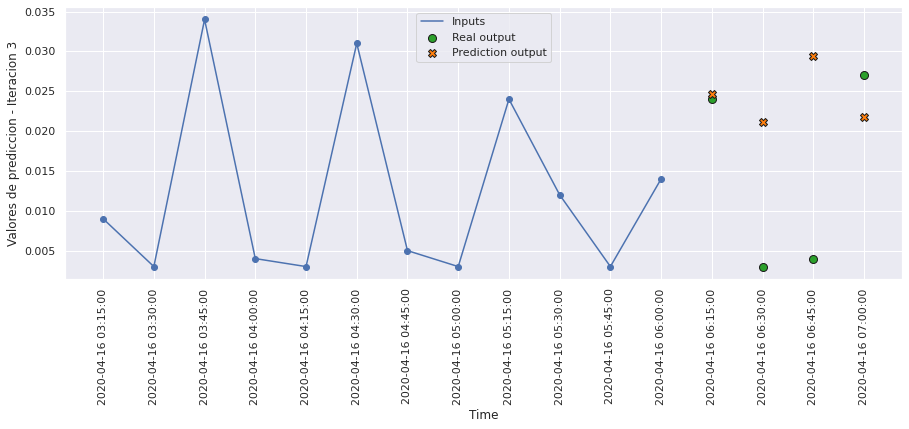

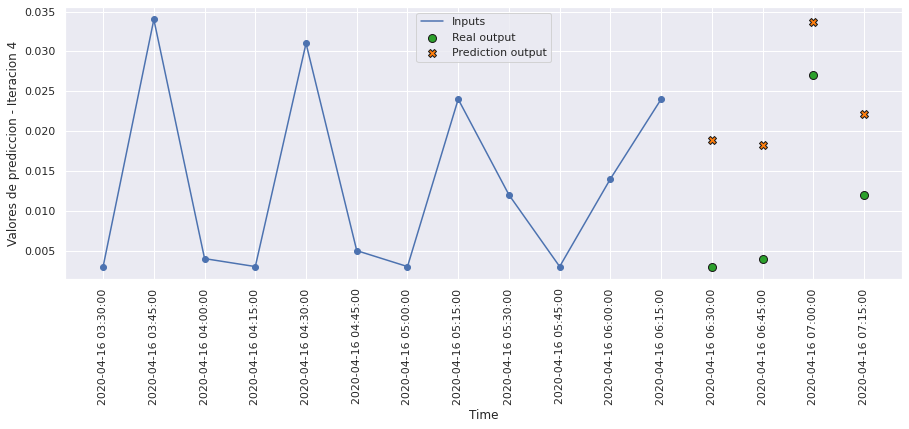

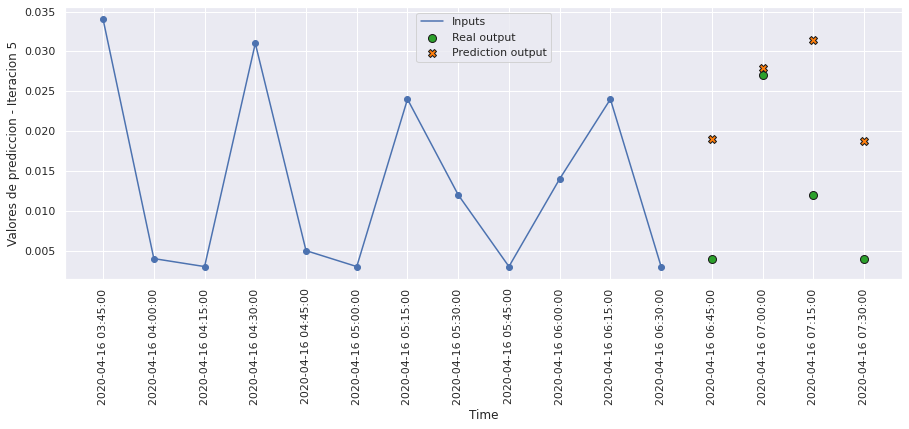

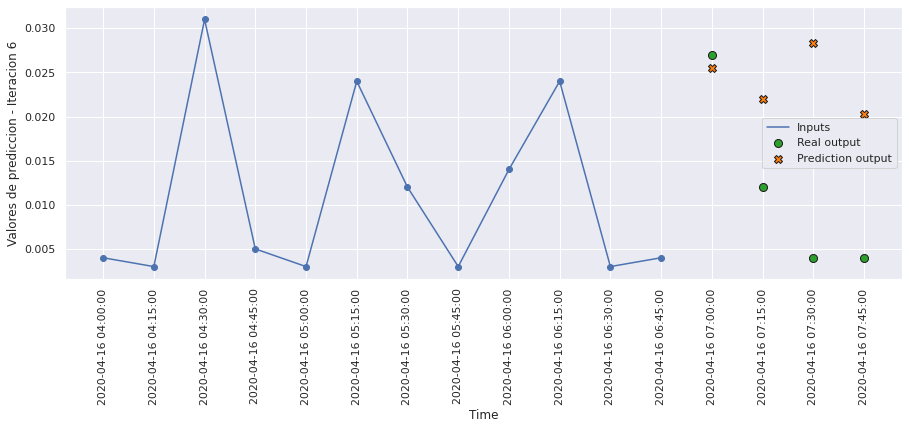

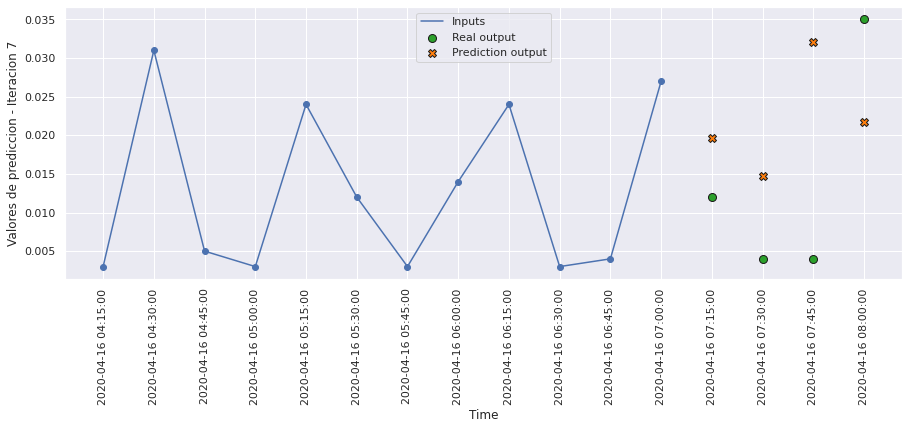

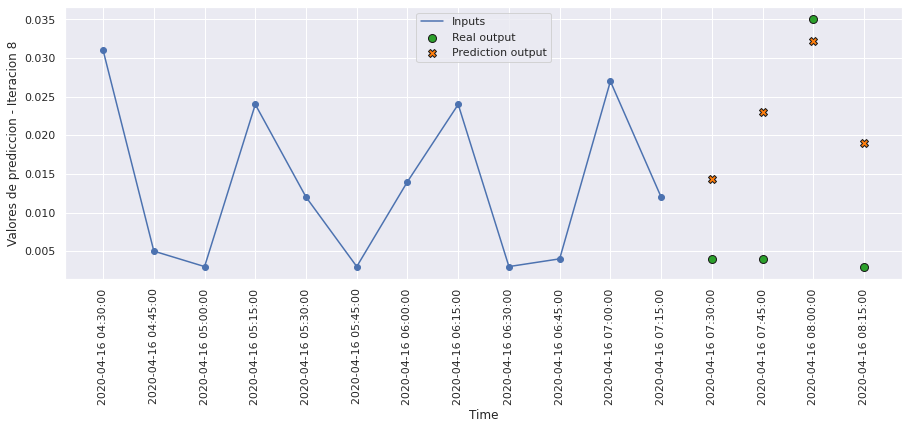

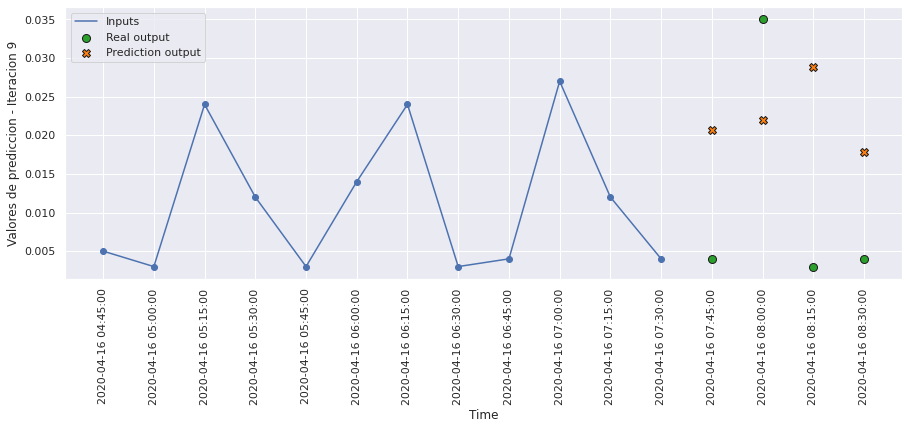

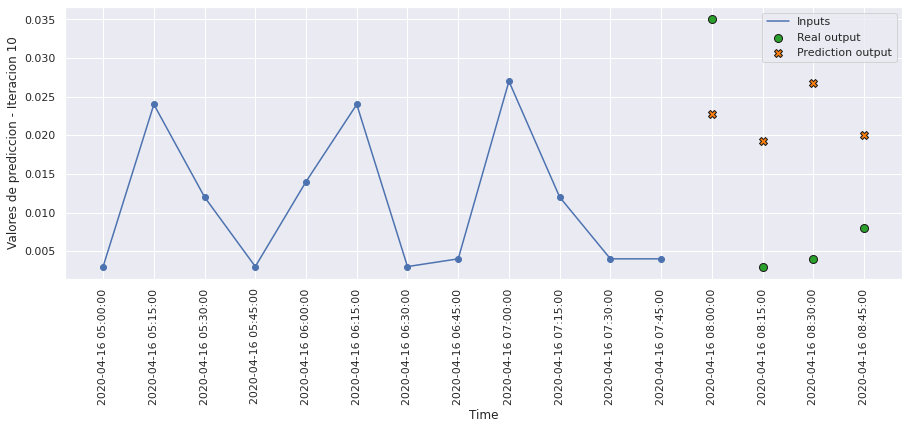

In [186]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict12, 10, 0)

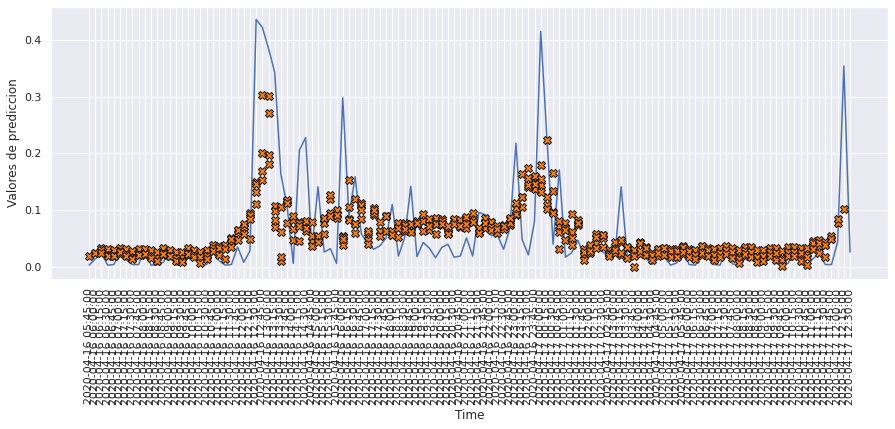

In [187]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 120)

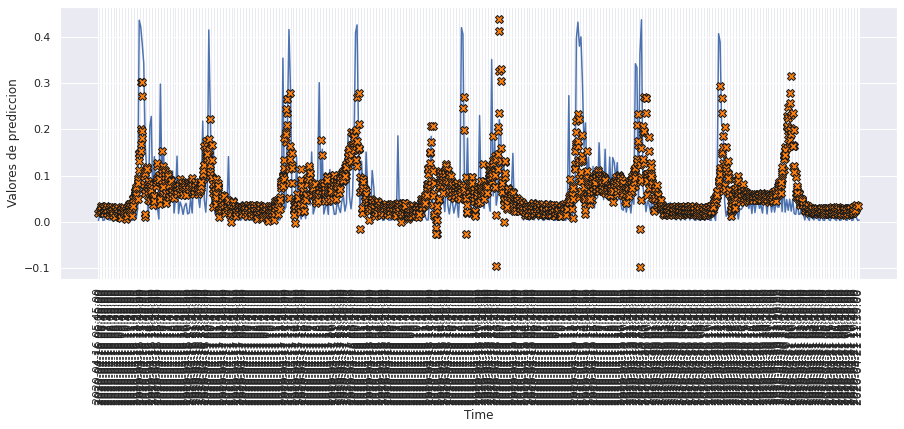

In [188]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict12, 500)

# MODELO 13: LSTM UNRESTRICTED DOS CAPAS

### Construimos el modelo

In [189]:
def build_model13():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(n_entrada, n_features)),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.LSTM(128, activation='tanh', return_sequences=True),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(n_predicciones)
    ])

    optimizer = tf.keras.optimizers.Adam()

    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse', smape])

    return model

In [190]:
model13 = build_model13()
model13.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_11 (LSTM)              (None, 12, 128)           69632     
                                                                 
 lstm_12 (LSTM)              (None, 12, 128)           131584    
                                                                 
 flatten_5 (Flatten)         (None, 1536)              0         
                                                                 
 dense_13 (Dense)            (None, 4)                 6148      
                                                                 
Total params: 207,364
Trainable params: 207,364
Non-trainable params: 0
_________________________________________________________________


### Entrenamiento del modelo

In [191]:
history13 = model13.fit(scaled_trainX, data_trainY, epochs=n_epochs, batch_size = batch_size, 
                    validation_data=(scaled_valX, data_valY), verbose = 1, callbacks=[early_stop])

Epoch 1/200
354/354 [==============================] - 7s 15ms/step - loss: 0.0061 - mae: 0.0470 - mse: 0.0061 - smape: 0.8491 - val_loss: 0.0062 - val_mae: 0.0466 - val_mse: 0.0062 - val_smape: 0.8613
Epoch 2/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0054 - mae: 0.0432 - mse: 0.0054 - smape: 0.7792 - val_loss: 0.0059 - val_mae: 0.0416 - val_mse: 0.0059 - val_smape: 0.7518
Epoch 3/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0051 - mae: 0.0415 - mse: 0.0051 - smape: 0.7499 - val_loss: 0.0060 - val_mae: 0.0405 - val_mse: 0.0060 - val_smape: 0.7122
Epoch 4/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0050 - mae: 0.0408 - mse: 0.0050 - smape: 0.7397 - val_loss: 0.0061 - val_mae: 0.0413 - val_mse: 0.0061 - val_smape: 0.7391
Epoch 5/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0049 - mae: 0.0406 - mse: 0.0049 - smape: 0.7370 - val_loss: 0.0060 - val_mae: 0.0425 - val_mse: 0.0060 - val_smap

354/354 [==============================] - 5s 14ms/step - loss: 0.0017 - mae: 0.0249 - mse: 0.0017 - smape: 0.6282 - val_loss: 0.0107 - val_mae: 0.0556 - val_mse: 0.0107 - val_smape: 0.8668
Epoch 82/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0017 - mae: 0.0248 - mse: 0.0017 - smape: 0.6267 - val_loss: 0.0102 - val_mae: 0.0546 - val_mse: 0.0102 - val_smape: 0.8878
Epoch 83/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0016 - mae: 0.0246 - mse: 0.0016 - smape: 0.6259 - val_loss: 0.0106 - val_mae: 0.0549 - val_mse: 0.0106 - val_smape: 0.8810
Epoch 84/200
354/354 [==============================] - 5s 14ms/step - loss: 0.0016 - mae: 0.0243 - mse: 0.0016 - smape: 0.6230 - val_loss: 0.0106 - val_mae: 0.0554 - val_mse: 0.0106 - val_smape: 0.8760
Epoch 85/200
354/354 [==============================] - 5s 13ms/step - loss: 0.0016 - mae: 0.0242 - mse: 0.0016 - smape: 0.6227 - val_loss: 0.0111 - val_mae: 0.0561 - val_mse: 0.0111 - val_smape: 0.869

In [192]:
hist13 = pd.DataFrame(history13.history)
hist13['epoch'] = history13.epoch
hist13

,loss,mae,mse,smape,val_loss,val_mae,val_mse,val_smape,epoch
0,0.006129,0.047037,0.006129,0.849135,0.006200,0.046559,0.006200,0.861311,0
1,0.005393,0.043167,0.005393,0.779182,0.005937,0.041636,0.005937,0.751770,1
2,0.005069,0.041464,0.005069,0.749929,0.006024,0.040533,0.006024,0.712186,2
3,0.004966,0.040793,0.004966,0.739685,0.006055,0.041271,0.006055,0.739100,3
4,0.004939,0.040588,0.004939,0.736952,0.005986,0.042466,0.005986,0.753685,4
...,...,...,...,...,...,...,...,...,...
101,0.001198,0.021510,0.001198,0.599253,0.010517,0.055381,0.010517,0.874894,101
102,0.001189,0.021420,0.001189,0.598120,0.010898,0.055983,0.010898,0.870078,102
103,0.001164,0.021183,0.001164,0.596123,0.010704,0.055471,0.010704,0.902536,103
104,0.001131,0.020969,0.001131,0.594143,0.010683,0.056374,0.010683,0.885926,104


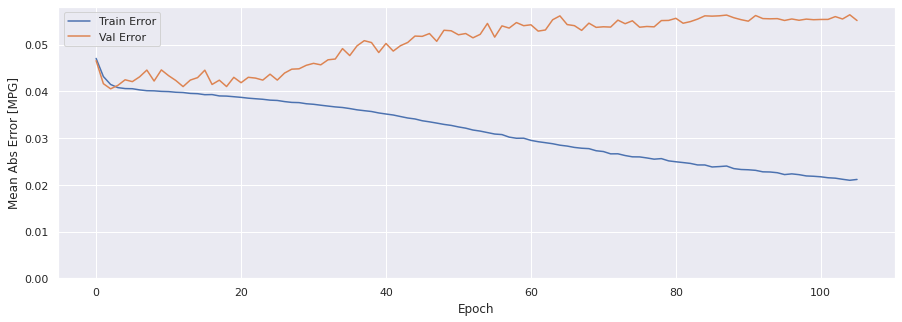

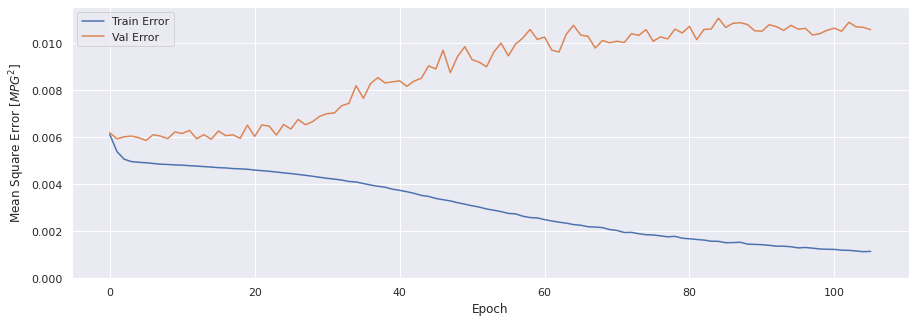

In [193]:
sns.set(rc = {'figure.figsize':(15,5)})
plot_history(history13)

### Evaluar predicciones

In [194]:
score_train13 = model13.evaluate(scaled_trainX, data_trainY, verbose=1)
print(f'Loss:{score_train13[0]}')
print(f'MAE:{score_train13[1]}')
print(f'MSE:{score_train13[2]}')
print(f'SMAPE:{score_train13[3]}')

1413/1413 [==============================] - 9s 7ms/step - loss: 0.0011 - mae: 0.0207 - mse: 0.0011 - smape: 0.5899
Loss:0.0011105173034593463
MAE:0.020745709538459778
MSE:0.0011105173034593463
SMAPE:0.589869499206543


In [195]:
score_val13 = model13.evaluate(scaled_valX, data_valY, verbose=1)
print(f'Loss:{score_val13[0]}')
print(f'MAE:{score_val13[1]}')
print(f'MSE:{score_val13[2]}')
print(f'SMAPE:{score_val13[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0106 - mae: 0.0551 - mse: 0.0106 - smape: 0.8693
Loss:0.010583726689219475
MAE:0.055144600570201874
MSE:0.010583726689219475
SMAPE:0.8693451881408691


In [196]:
score_test13 = model13.evaluate(scaled_testX, data_testY, verbose=1)
print(f'Loss:{score_test13[0]}')
print(f'MAE:{score_test13[1]}')
print(f'MSE:{score_test13[2]}')
print(f'SMAPE:{score_test13[3]}')

303/303 [==============================] - 2s 7ms/step - loss: 0.0089 - mae: 0.0547 - mse: 0.0089 - smape: 0.8637
Loss:0.00893972348421812
MAE:0.05469512194395065
MSE:0.00893972348421812
SMAPE:0.8637211918830872


### Comparativa de resultados

In [197]:
result = hist13.iloc[-1]
comparativa13 = pd.DataFrame(np.array([[result['mae'], result['mse'], result['smape'], math.sqrt(result['mse'])], 
                                      [result['val_mae'], result['val_mse'], result['val_smape'], math.sqrt(result['val_mse'])],
                                      [score_test13[1], score_test13[2], score_test13[3], math.sqrt(score_test13[2])]]),
                            columns = ['MAE', 'MSE', 'SMAPE', 'RMSE'],
                            index = ['ENTRENAMIENTO', 'VALIDACION', 'TEST'])

comparativa13.style.set_caption("Método de ventana de varios pasos - LSTM UNRESTRICTED dos capas")

,MAE,MSE,SMAPE,RMSE
ENTRENAMIENTO,0.021149,0.001147,0.597162,0.033863
VALIDACION,0.055145,0.010584,0.869836,0.102877
TEST,0.054695,0.008940,0.863721,0.094550


### Obtener predicciones

In [198]:
trainPredict13 = model13.predict(scaled_trainX)
testPredict13 = model13.predict(scaled_testX)

### Visualización de las predicciones

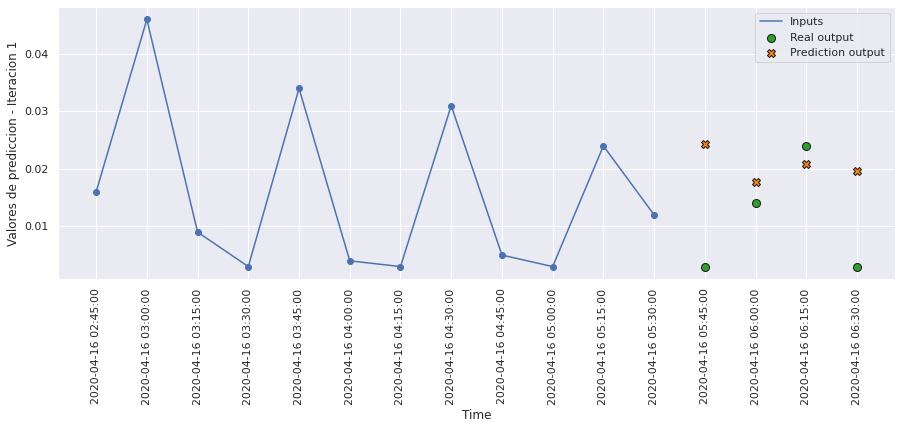

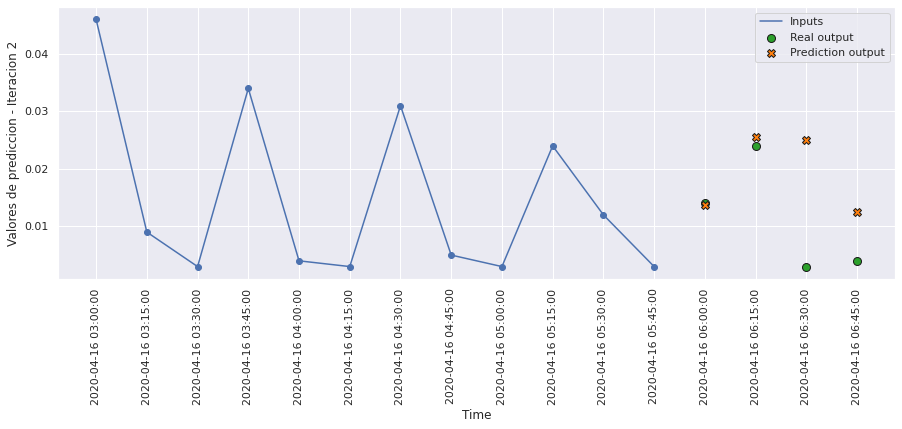

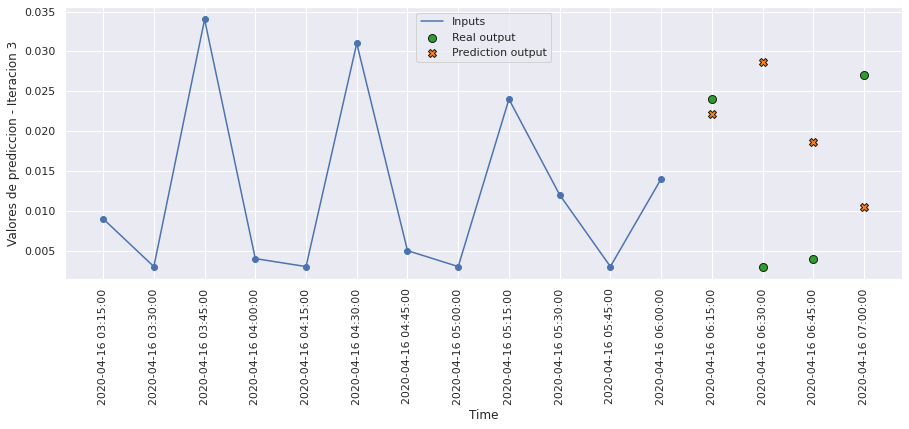

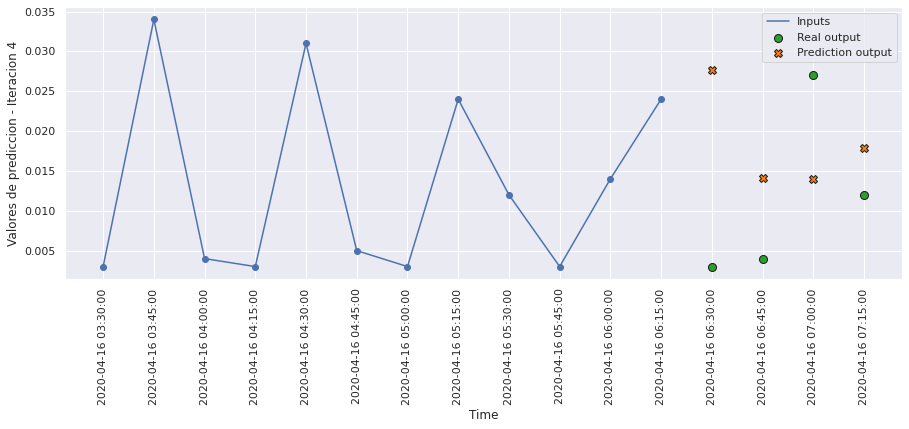

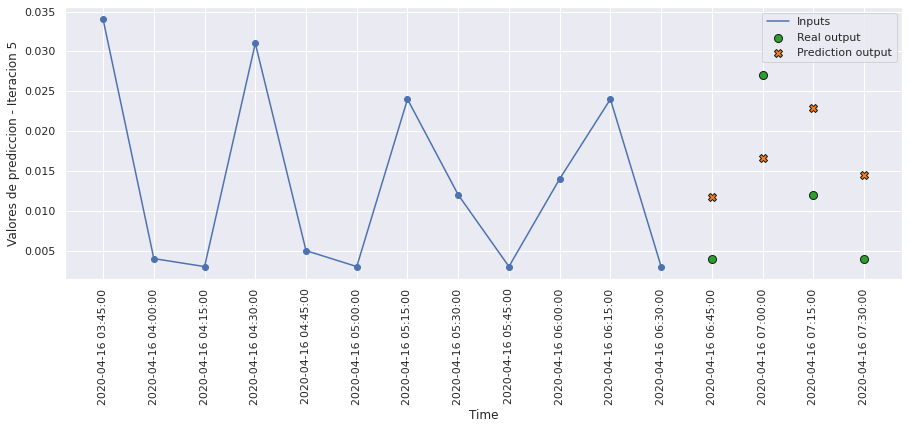

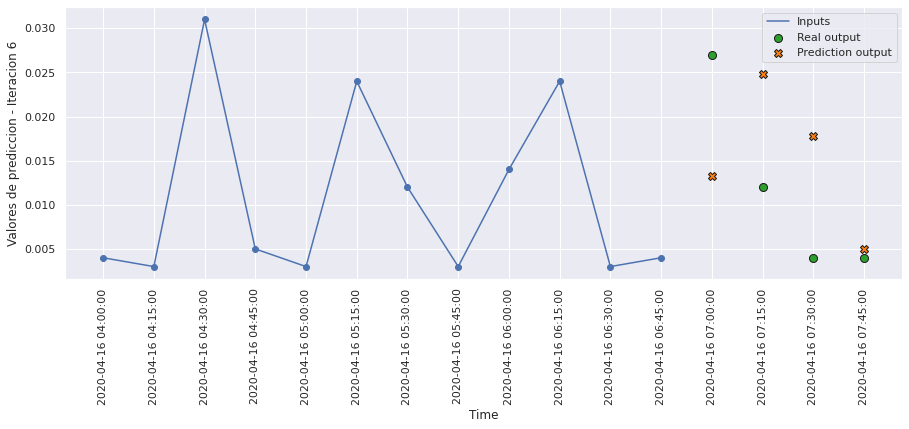

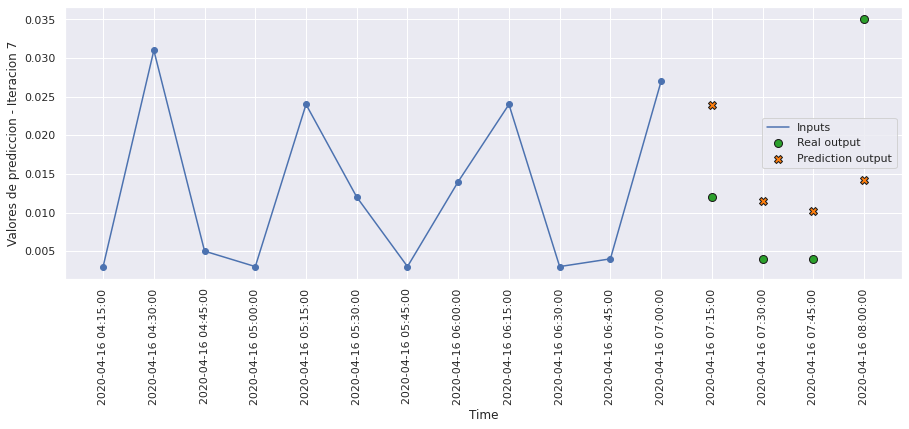

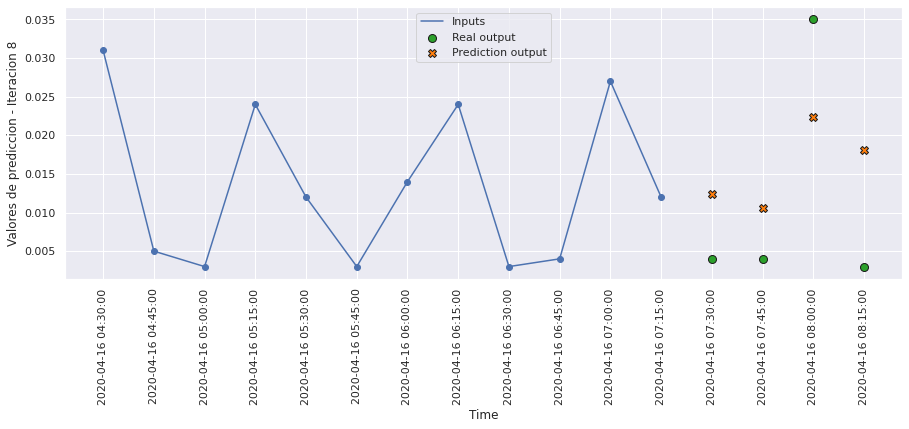

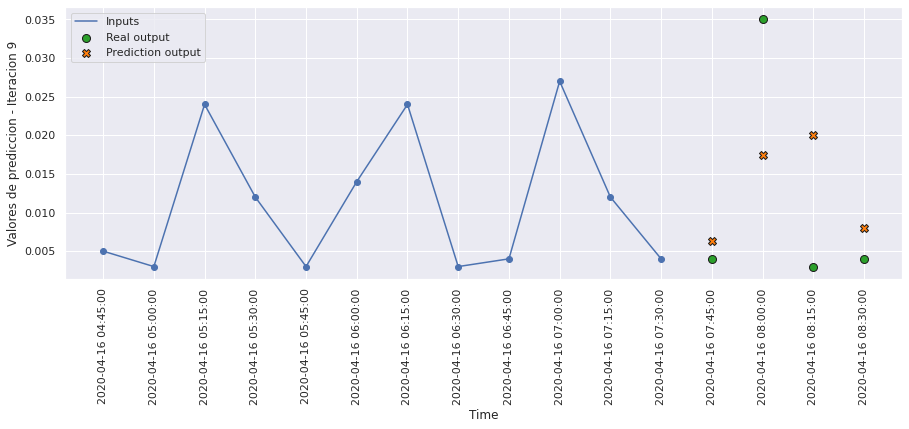

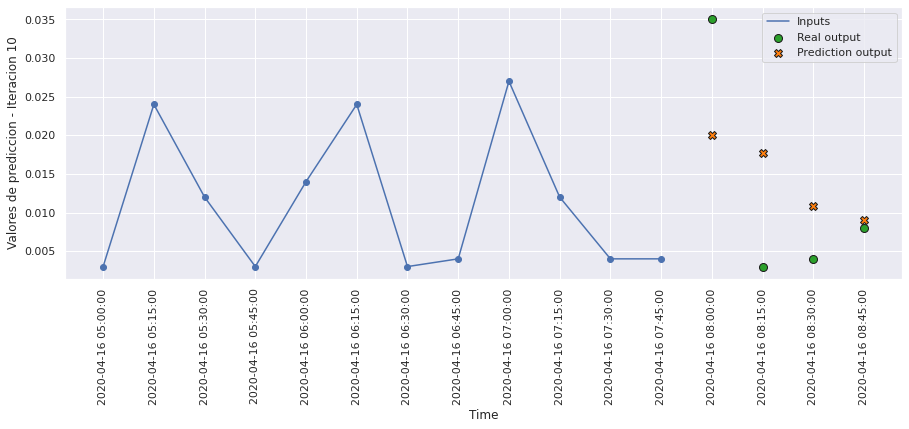

In [199]:
plot_window_predictions(int(test_df.iloc[0].name), int(test_df.iloc[-1].name), data_testY, testPredict13, 10, 0)

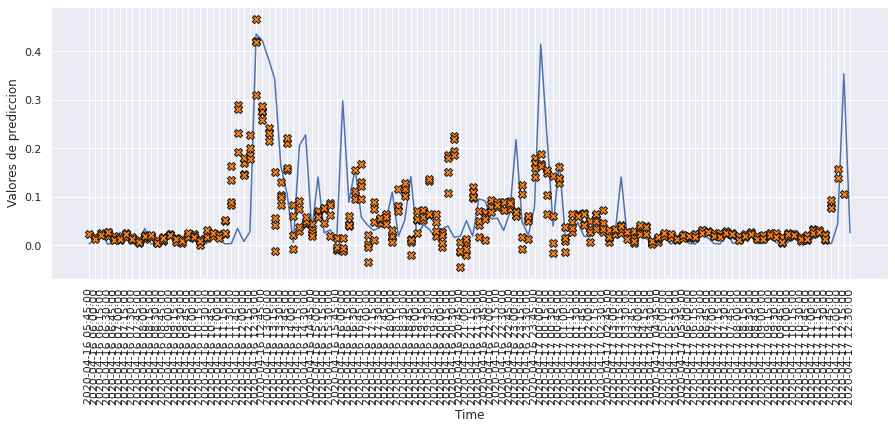

In [200]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 120)

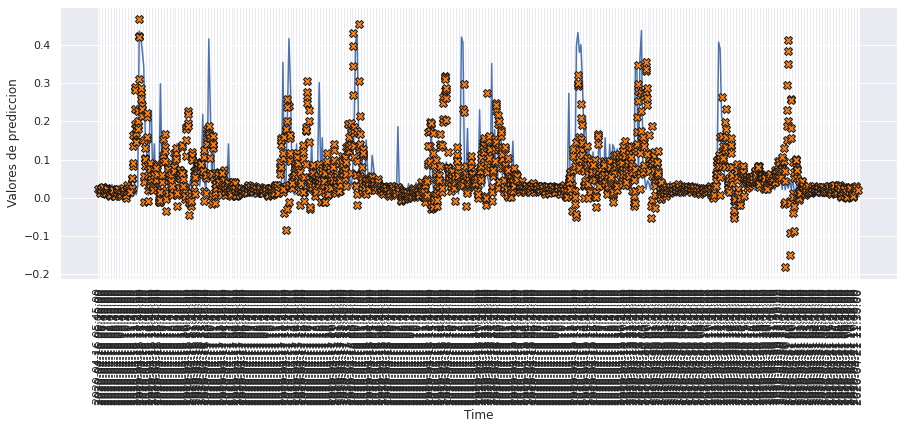

In [201]:
plot_window_predictions_values(int(test_df.iloc[0].name), testPredict13, 500)

# Comparación de modelos

In [202]:
idx = ['LSTM 1 Layer', 'LSTM 2 Layer', 'LSTM 3 Layer', 'Bidirectional LSTM', 
         'Conv 1D', 'Conv 1D con LSTM', 'ConvLSTM1D', 'ConvLSTM2D', 'LSTM Encode Decode', 
         'GRU 1 Layer', 'GRU 2 Layer', 'LSTM unrestricted 1 layer', 'LSTM unrestricted 2 layer']

col = ['TR_MAE', 'TR_MSE', 'TR_SMAPE', 'TR_RMSE',
       'V_MAE', 'V_MSE', 'V_SMAPE', 'V_RMSE',
       'TS_MAE', 'TS_MSE', 'TS_SMAPE', 'TS_RMSE']

datos = [[score_train1[1], score_train1[2], score_train1[3], math.sqrt(score_train1[2]),
            score_val1[1],   score_val1[2],   score_val1[3],   math.sqrt(score_val1[2]),
           score_test1[1],  score_test1[2],  score_test1[3],  math.sqrt(score_test1[2])],
         [score_train2[1], score_train2[2], score_train2[3], math.sqrt(score_train2[2]),
            score_val2[1],   score_val2[2],   score_val2[3],   math.sqrt(score_val2[2]),
           score_test2[1],  score_test2[2],  score_test2[3],  math.sqrt(score_test2[2])],
         [score_train3[1], score_train3[2], score_train3[3], math.sqrt(score_train3[2]),
            score_val3[1],   score_val3[2],   score_val3[3],   math.sqrt(score_val3[2]),
           score_test3[1],  score_test3[2],  score_test3[3],  math.sqrt(score_test3[2])],
         [score_train4[1], score_train4[2], score_train4[3], math.sqrt(score_train4[2]),
            score_val4[1],   score_val4[2],   score_val4[3],   math.sqrt(score_val4[2]),
           score_test4[1],  score_test4[2],  score_test4[3],  math.sqrt(score_test4[2])],
         [score_train5[1], score_train5[2], score_train5[3], math.sqrt(score_train5[2]),
            score_val5[1],   score_val5[2],   score_val5[3],   math.sqrt(score_val5[2]),
           score_test5[1],  score_test5[2],  score_test5[3],  math.sqrt(score_test5[2])],
         [score_train6[1], score_train6[2], score_train6[3], math.sqrt(score_train6[2]),
            score_val6[1],   score_val6[2],   score_val6[3],   math.sqrt(score_val6[2]),
           score_test6[1],  score_test6[2],  score_test6[3],  math.sqrt(score_test6[2])],
         [score_train7[1], score_train7[2], score_train7[3], math.sqrt(score_train7[2]),
            score_val7[1],   score_val7[2],   score_val7[3],   math.sqrt(score_val7[2]),
           score_test7[1],  score_test7[2],  score_test7[3],  math.sqrt(score_test7[2])],
         [score_train8[1], score_train8[2], score_train8[3], math.sqrt(score_train8[2]),
            score_val8[1],   score_val8[2],   score_val8[3],   math.sqrt(score_val8[2]),
           score_test8[1],  score_test8[2],  score_test8[3],  math.sqrt(score_test8[2])],
         [score_train9[1], score_train9[2], score_train9[3], math.sqrt(score_train9[2]),
            score_val9[1],   score_val9[2],   score_val9[3],   math.sqrt(score_val9[2]),
           score_test9[1],  score_test9[2],  score_test9[3],  math.sqrt(score_test9[2])],
         [score_train10[1], score_train10[2], score_train10[3], math.sqrt(score_train10[2]),
            score_val10[1],   score_val10[2],   score_val10[3],   math.sqrt(score_val10[2]),
           score_test10[1],  score_test10[2],  score_test10[3],  math.sqrt(score_test10[2])],
         [score_train11[1], score_train11[2], score_train11[3], math.sqrt(score_train11[2]),
            score_val11[1],   score_val11[2],   score_val11[3],   math.sqrt(score_val11[2]),
           score_test11[1],  score_test11[2],  score_test11[3],  math.sqrt(score_test11[2])],
         [score_train12[1], score_train12[2], score_train12[3], math.sqrt(score_train12[2]),
            score_val12[1],   score_val12[2],   score_val12[3],   math.sqrt(score_val12[2]),
           score_test12[1],  score_test12[2],  score_test12[3],  math.sqrt(score_test12[2])],
         [score_train13[1], score_train13[2], score_train13[3], math.sqrt(score_train13[2]),
            score_val13[1],   score_val13[2],   score_val13[3],   math.sqrt(score_val13[2]),
           score_test13[1],  score_test13[2],  score_test13[3],  math.sqrt(score_test13[2])]]

comparativa = pd.DataFrame(datos, columns = col, index = idx)
comparativa.style.set_caption("Tabla de comparación de todos los modelos - Método de ventana fecha y valor 12 - 4")

,TR_MAE,TR_MSE,TR_SMAPE,TR_RMSE,V_MAE,V_MSE,V_SMAPE,V_RMSE,TS_MAE,TS_MSE,TS_SMAPE,TS_RMSE
LSTM 1 Layer,0.028097,0.002235,0.649124,0.047279,0.053982,0.010051,0.884097,0.100254,0.053692,0.008574,0.867815,0.092596
LSTM 2 Layer,0.018853,0.000862,0.561423,0.029361,0.053438,0.009550,0.897113,0.097724,0.056985,0.009309,0.910084,0.096485
LSTM 3 Layer,0.013552,0.000429,0.474585,0.020724,0.049342,0.008773,0.856427,0.093662,0.051583,0.008111,0.854479,0.090059
Bidirectional LSTM,0.027925,0.001946,0.665205,0.044112,0.052171,0.008979,0.871940,0.094760,0.053371,0.008219,0.860490,0.090657
Conv 1D,0.039710,0.004783,0.741040,0.069156,0.045010,0.006358,0.789538,0.079740,0.046048,0.006120,0.778845,0.078234
Conv 1D con LSTM,0.032745,0.003062,0.684594,0.055338,0.054632,0.009909,0.880072,0.099542,0.051682,0.008221,0.831791,0.090672
ConvLSTM1D,0.040869,0.004715,0.735339,0.068666,0.044845,0.006172,0.789327,0.078563,0.047706,0.006065,0.796006,0.077876
ConvLSTM2D,0.037488,0.004479,0.717141,0.066924,0.045188,0.006611,0.858902,0.081308,0.046904,0.006292,0.830365,0.079323
LSTM Encode Decode,0.023551,0.001495,0.595364,0.038668,0.053117,0.010500,0.815615,0.102468,0.052238,0.008867,0.801247,0.094163
GRU 1 Layer,0.028709,0.002151,0.682574,0.046377,0.054209,0.009667,0.922015,0.098322,0.055473,0.008983,0.884485,0.094780


<AxesSubplot:title={'center':'Comparativa del error en los modelos para la hora del método de ventana de varios pasos fecha y valor'}>

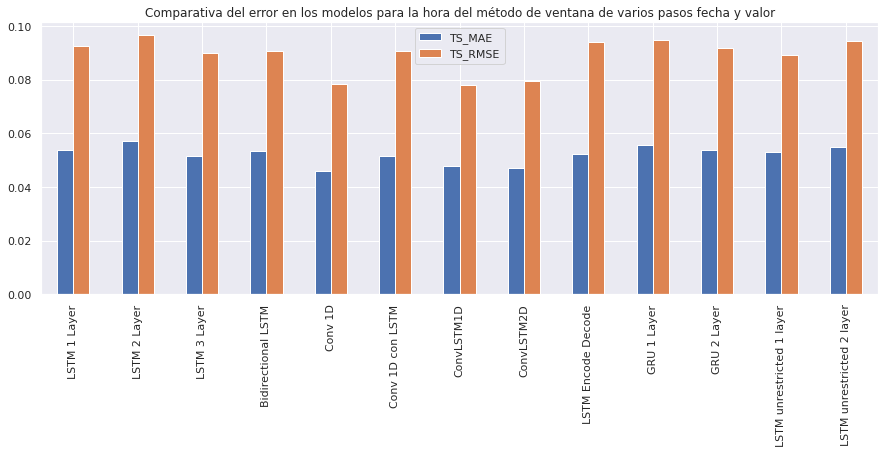

In [203]:
comparativa.loc[:, ['TS_MAE', 'TS_RMSE']].plot(kind='bar', title = 'Comparativa del error en los modelos para la hora del método de ventana de varios pasos fecha y valor')

<AxesSubplot:title={'center':'Comparativa del error porcentual absoluto medio simétrico para la hora del método de ventana de varios pasos fecha y valor'}>

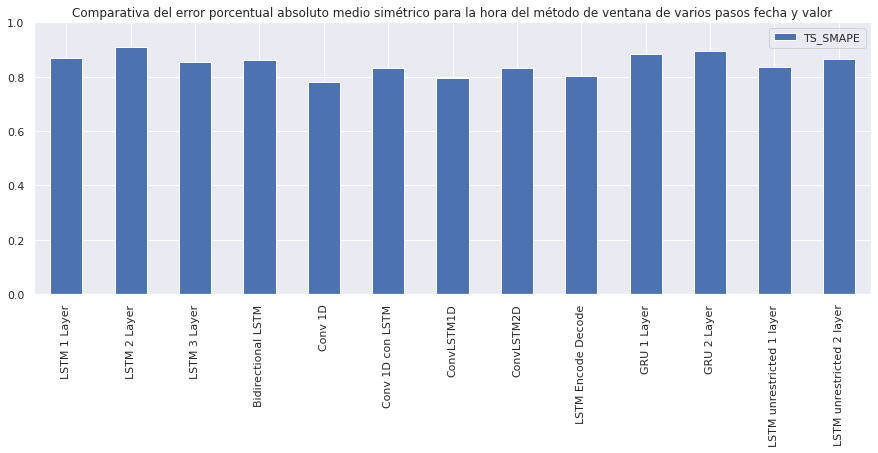

In [204]:
comparativa.loc[:, 'TS_SMAPE'].plot(kind='bar', legend=(['SMAPE']), ylim=(0, 1), 
                    title = 'Comparativa del error porcentual absoluto medio simétrico para la hora del método de ventana de varios pasos fecha y valor')

# Elección de modelo - 9

In [ ]:
model2.save('../../models/datetime_and_value/hourModel/1/')

2022-06-24 09:11:19.782547: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ../../models/datetime_and_value/hourModel/1/assets


INFO:tensorflow:Assets written to: ../../models/datetime_and_value/hourModel/1/assets
